# Import All Libraries


In [16]:
# GENERAL
import sys
from packaging import version
import uuid
import multiprocessing

# DATA
import numpy as np
import pandas as pd

# VISULISATION
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go


# Data Repository

from ucimlrepo import fetch_ucirepo

# MACHINE LEARNING

# Scikitlearn
import sklearn
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    StratifiedKFold,
    GridSearchCV,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_validate,
    RepeatedStratifiedKFold,
)
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    ExtraTreesClassifier,
    BaggingClassifier,
    IsolationForest,
)
from sklearn.impute import SimpleImputer, MissingIndicator

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    classification_report,
    precision_score,
    recall_score,
    f1_score,
    precision_recall_fscore_support,
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
    confusion_matrix,
    auc,
    log_loss,
    accuracy_score,
    make_scorer,
    average_precision_score,
    mean_squared_error,
    balanced_accuracy_score,
    RocCurveDisplay,
    PrecisionRecallDisplay,
)
from yellowbrick.classifier import (
    ROCAUC,
    PrecisionRecallCurve,
    ClassPredictionError,
    ClassificationReport,
    DiscriminationThreshold,
)
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.utils.class_weight import compute_sample_weight


from sklearn.base import clone

# XGBoost
import xgboost as xgb
from xgboost import XGBClassifier

# DEEP LEARNING

# Tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop, SGD

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import mixed_precision
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import (
    CategoricalCrossentropy,
    SparseCategoricalCrossentropy,
    BinaryCrossentropy,
)

# Conditional Tabular GANs
from ctgan import CTGAN


# Oversampling
from imblearn.over_sampling import (
    RandomOverSampler,
    SMOTE,
    ADASYN,
    BorderlineSMOTE,
    SVMSMOTE,
    SMOTENC,
)
from imblearn.pipeline import make_pipeline

from imblearn.under_sampling import (
    RandomUnderSampler,
    CondensedNearestNeighbour,
    TomekLinks,
    OneSidedSelection,
    EditedNearestNeighbours,
    RepeatedEditedNearestNeighbours,
    AllKNN,
    NeighbourhoodCleaningRule,
    NearMiss,
    InstanceHardnessThreshold,
)


# Hyperparameter Tunning
from hyperopt import fmin, tpe, hp, Trials, rand, STATUS_OK

# AI Explainability
import shap

# Deployment
import streamlit as st
import joblib

# Fairness
from fairlearn.metrics import MetricFrame, true_positive_rate, true_negative_rate
from fairlearn.reductions import (
    ExponentiatedGradient,
    DemographicParity,
    EqualizedOdds,
    TruePositiveRateParity,
)
from fairlearn.postprocessing import ThresholdOptimizer
import json

from sklearn.preprocessing import PowerTransformer, FunctionTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
from sklearn.preprocessing import KBinsDiscretizer
from feature_engine.outliers import Winsorizer, OutlierTrimmer

from feature_engine.selection import (
    RecursiveFeatureAddition,
    RecursiveFeatureElimination,
    DropConstantFeatures,
    DropDuplicateFeatures,
    SelectByShuffling,
    SelectByTargetMeanPerformance,
    DropCorrelatedFeatures,
    SmartCorrelatedSelection,
)
from sklearn.metrics import roc_auc_score, mean_squared_error, r2_score

from sklearn.neighbors import NearestNeighbors
from dython.nominal import associations

# Setting up models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.ensemble import (
    BalancedBaggingClassifier,
    BalancedRandomForestClassifier,
    RUSBoostClassifier,
    EasyEnsembleClassifier,
)

from xgboost import XGBClassifier, DMatrix, train
from xgboost import plot_importance
from imblearn.combine import SMOTEENN, SMOTETomek
from skopt import dummy_minimize  # for the randomized search
from skopt.plots import (
    plot_convergence,
    plot_evaluations,
    plot_objective,
    plot_gaussian_process,
)
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args

from skopt import gp_minimize, forest_minimize, gbrt_minimize

from skopt import BayesSearchCV
import scipy.stats as stats


import warnings

warnings.filterwarnings("ignore")

# Load Data


In [396]:
def load_data_from_uci():
    """Load data from UC Irvine Machine Learning reposity using the link
    https://archive.ics.uci.edu/dataset/2/adult
    """

    # fetch dataset
    bank_marketing = fetch_ucirepo(id=222)

    # data (as pandas dataframes)
    input_features = bank_marketing.data.features
    target_feature = bank_marketing.data.targets
    return input_features, target_feature, bank_marketing


input_features, target_feature, bank_marketing = load_data_from_uci()

# Goal of this work and source of data

In [3]:
# metadata of the dataset

print(json.dumps(bank_marketing.metadata, indent=4))

{
    "uci_id": 222,
    "name": "Bank Marketing",
    "repository_url": "https://archive.ics.uci.edu/dataset/222/bank+marketing",
    "data_url": "https://archive.ics.uci.edu/static/public/222/data.csv",
    "abstract": "The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe a term deposit (variable y).",
    "area": "Business",
    "tasks": [
        "Classification"
    ],
    "characteristics": [
        "Multivariate"
    ],
    "num_instances": 45211,
    "num_features": 16,
    "feature_types": [
        "Categorical",
        "Integer"
    ],
    "demographics": [
        "Age",
        "Occupation",
        "Marital Status",
        "Education Level"
    ],
    "target_col": [
        "y"
    ],
    "index_col": null,
    "has_missing_values": "yes",
    "missing_values_symbol": "NaN",
    "year_of_dataset_creation": 2014,
    "last_updated": "Fri Aug 18 2023",
  

In [4]:
print(bank_marketing.metadata["tasks"])

['Classification']


In [5]:
print(bank_marketing.metadata["additional_info"]["summary"])

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. 

There are four datasets: 
1) bank-additional-full.csv with all examples (41188) and 20 inputs, ordered by date (from May 2008 to November 2010), very close to the data analyzed in [Moro et al., 2014]
2) bank-additional.csv with 10% of the examples (4119), randomly selected from 1), and 20 inputs.
3) bank-full.csv with all examples and 17 inputs, ordered by date (older version of this dataset with less inputs). 
4) bank.csv with 10% of the examples and 17 inputs, randomly selected from 3 (older version of this dataset with less inputs). 
The smallest datasets are provided to test more computationally demanding machine learning algorithms (e.g., SVM). 

The classification goal is to predict i

In [6]:
print(
    f" shape of the input features is: {input_features.shape} \n\n\n shape of the target features is: {target_feature.shape}"
)

 shape of the input features is: (45211, 16) 


 shape of the target features is: (45211, 1)


The data has $45211$ entries, $16$ features and $1$ target variable. What are these features or variables?

In [7]:
print(bank_marketing.metadata["additional_info"]["variable_info"])

Input variables:
   # bank client data:
   1 - age (numeric)
   2 - job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
   3 - marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   4 - education (categorical: "unknown","secondary","primary","tertiary")
   5 - default: has credit in default? (binary: "yes","no")
   6 - balance: average yearly balance, in euros (numeric) 
   7 - housing: has housing loan? (binary: "yes","no")
   8 - loan: has personal loan? (binary: "yes","no")
   # related with the last contact of the current campaign:
   9 - contact: contact communication type (categorical: "unknown","telephone","cellular") 
  10 - day: last contact day of the month (numeric)
  11 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "no

# Exploratory Data Analysis

In [397]:
data = pd.concat([input_features, target_feature], axis=1)

# display the first few rows of the data

data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no


To avoid data leakage, it is good practice to split the data into train and test set before embarking on feature engineering and missing data imputation

In [2]:
# data.to_csv("data_imbalance.csv", index=False)

# Load the data from the csv file
data = pd.read_csv("data_imbalance.csv")

data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          45211 non-null  int64 
 1   job          44923 non-null  object
 2   marital      45211 non-null  object
 3   education    43354 non-null  object
 4   default      45211 non-null  object
 5   balance      45211 non-null  int64 
 6   housing      45211 non-null  object
 7   loan         45211 non-null  object
 8   contact      32191 non-null  object
 9   day_of_week  45211 non-null  int64 
 10  month        45211 non-null  object
 11  duration     45211 non-null  int64 
 12  campaign     45211 non-null  int64 
 13  pdays        45211 non-null  int64 
 14  previous     45211 non-null  int64 
 15  poutcome     8252 non-null   object
 16  y            45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


This shows the variable type: whether numeric or categorical. Different Non-Null Count shows there is a presence of missing data (more this later).

In [4]:
# data["day_of_week"] = data["day_of_week"].astype("object")
data.dtypes

age             int64
job            object
marital        object
education      object
default        object
balance         int64
housing        object
loan           object
contact        object
day_of_week     int64
month          object
duration        int64
campaign        int64
pdays           int64
previous        int64
poutcome       object
y              object
dtype: object

day_of_week is a categorical variable and hence we chnages its type below

In [8]:
data["day_of_week"] = data["day_of_week"].astype("object")

To avoid data leakage, it is good practice to split the data into train and test set before embarking on feature engineering and missing data imputation. I applied a stratified split to ensure even distribution of categories in both the train and test set. I alos applied a random seed to ensure reproducibility

In [10]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop("y", axis=1),
    data["y"],
    stratify=data["y"],
    test_size=0.2,
    random_state=42,
)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((36168, 16), (9043, 16), (36168,), (9043,))

### categorical variables

Find the categorical variables and their cardinality. Cardinality is the number sub-category within each category. For the job feature, it has $11$ sub-categority or cardinality. High cardinality can lead to uneven distribution between the train and test set. That is some categories are only present in the train set (cause overfitting) and others in the test set (cause operational problems). High cardinal variables tend to dominate over low cardinal ones particularly when using tree based models. High cardinal variable  can also introducd noise with little information. Reducing cardiality can imporve model performance. Rare labels can also be combined to reduce cardinality of the dataset. In this work, I assume labels less than $5\%$ as belonging to rare classes and will have to find ways to deal with them in the feature engineering section (either choosing the most frequent classes or re-grouping).

In [11]:
categorical_variables = X_train.select_dtypes(include=["object"]).columns.to_list()
categorical_variables

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'day_of_week',
 'month',
 'poutcome']

In [5]:
print("There are {} categorical variables".format(len(categorical_variables)))

There are 9 categorical variables


In [12]:
# shows and plots the cardinality of the categorical variables

for variable in categorical_variables:
    print("Variable {} has {} categories".format(variable, X_train[variable].nunique()))

Variable job has 11 categories
Variable marital has 3 categories
Variable education has 3 categories
Variable default has 2 categories
Variable housing has 2 categories
Variable loan has 2 categories
Variable contact has 2 categories
Variable day_of_week has 31 categories
Variable month has 12 categories
Variable poutcome has 3 categories


The cardinality of the variable job is: 12


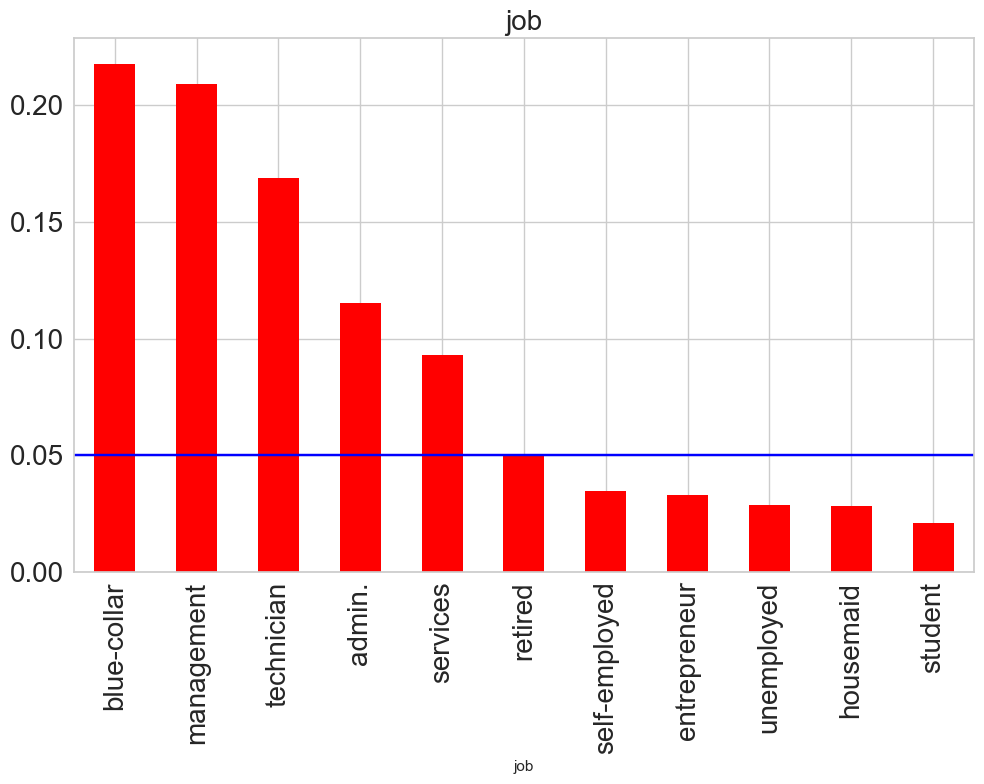

The cardinality of the variable marital is: 3


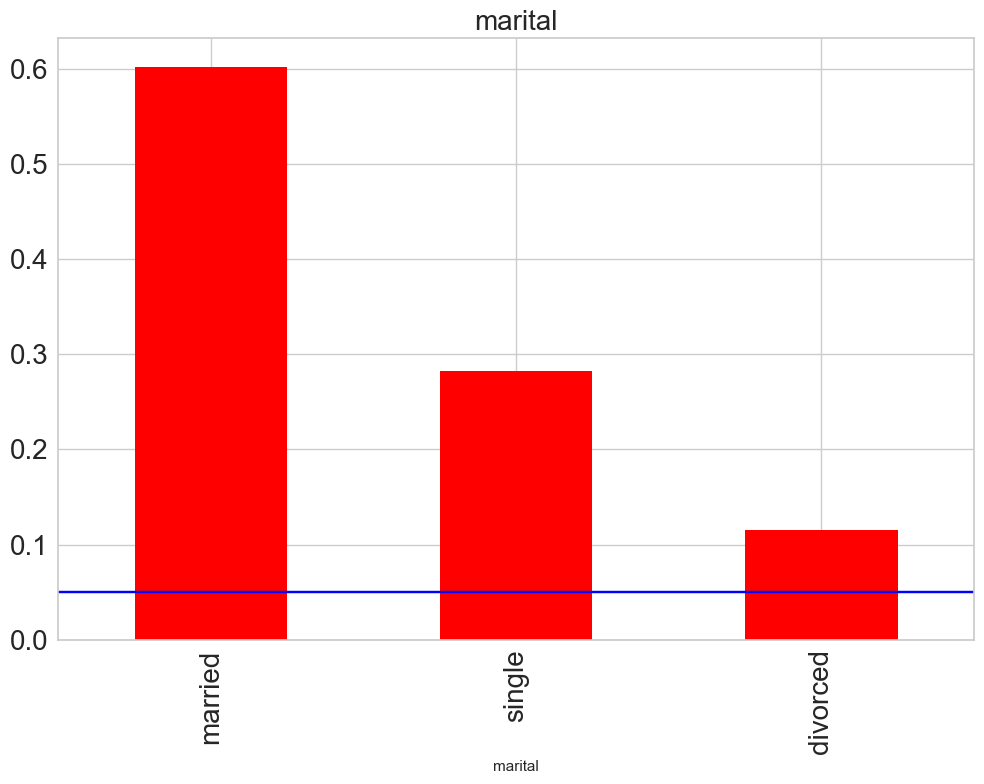

The cardinality of the variable education is: 4


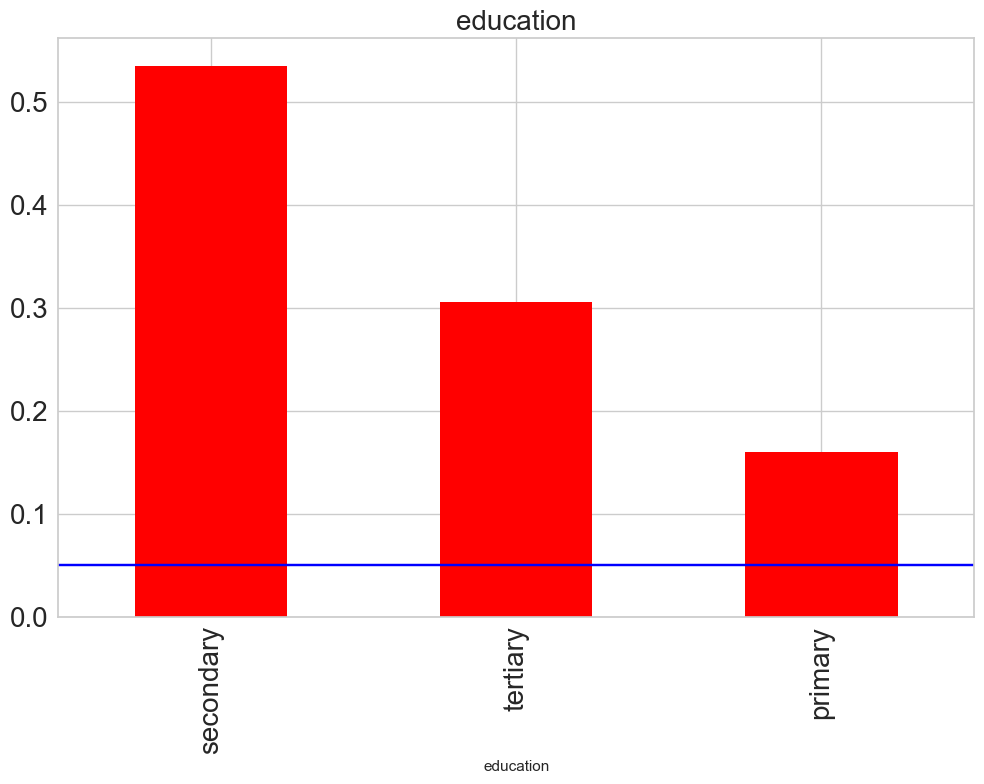

The cardinality of the variable default is: 2


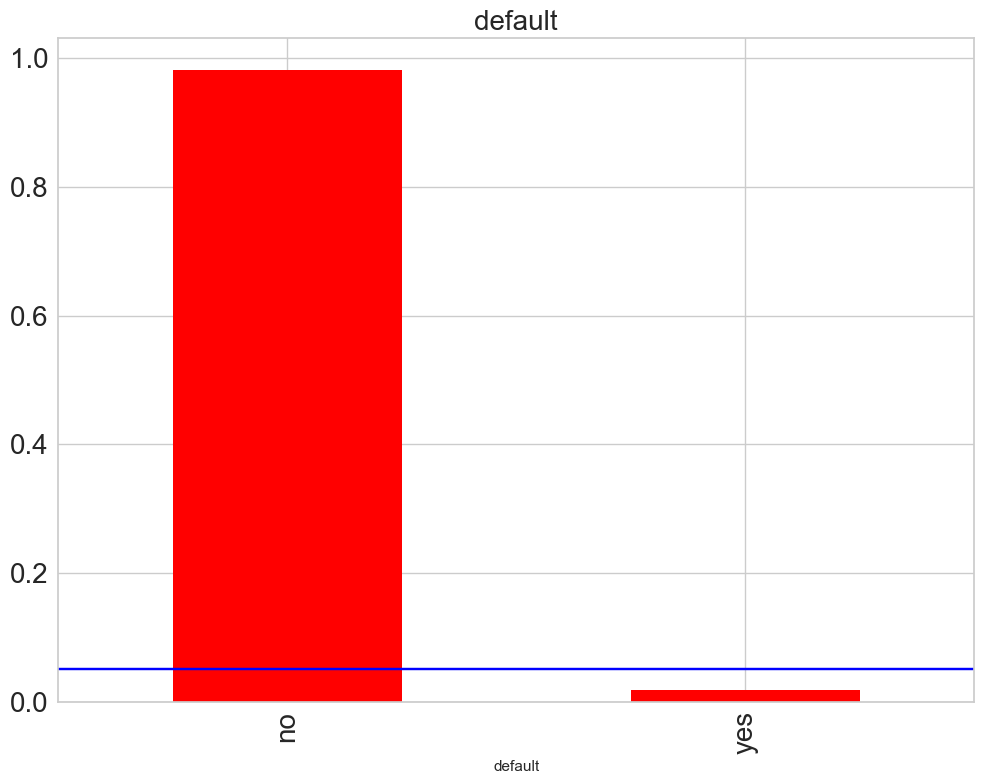

The cardinality of the variable housing is: 2


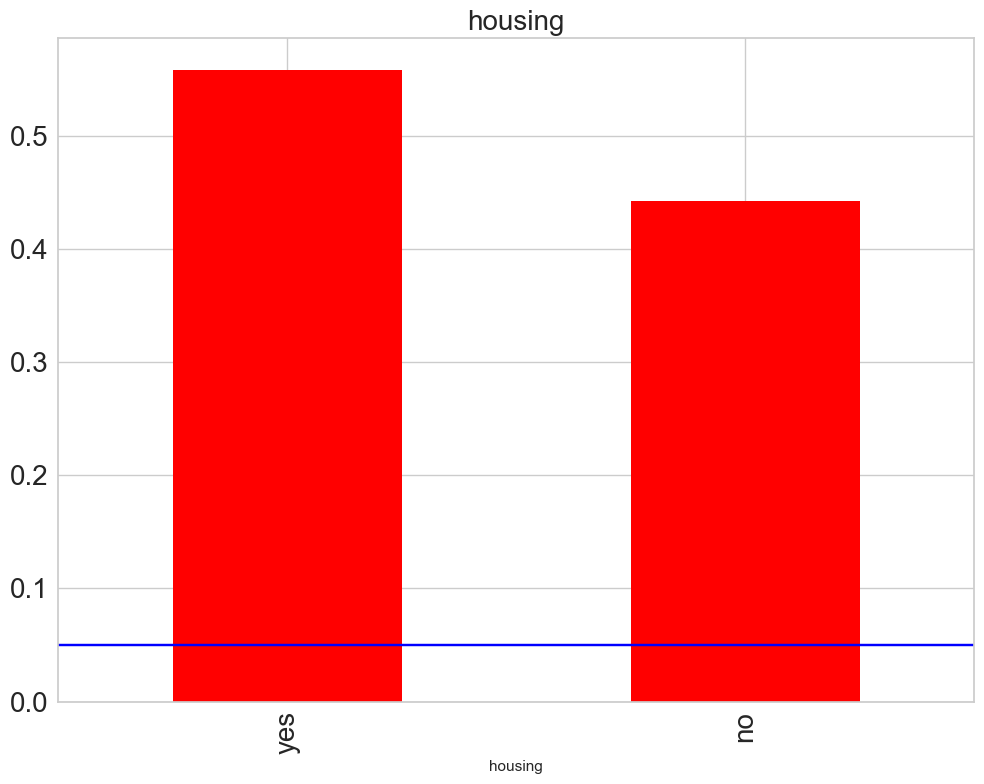

The cardinality of the variable loan is: 2


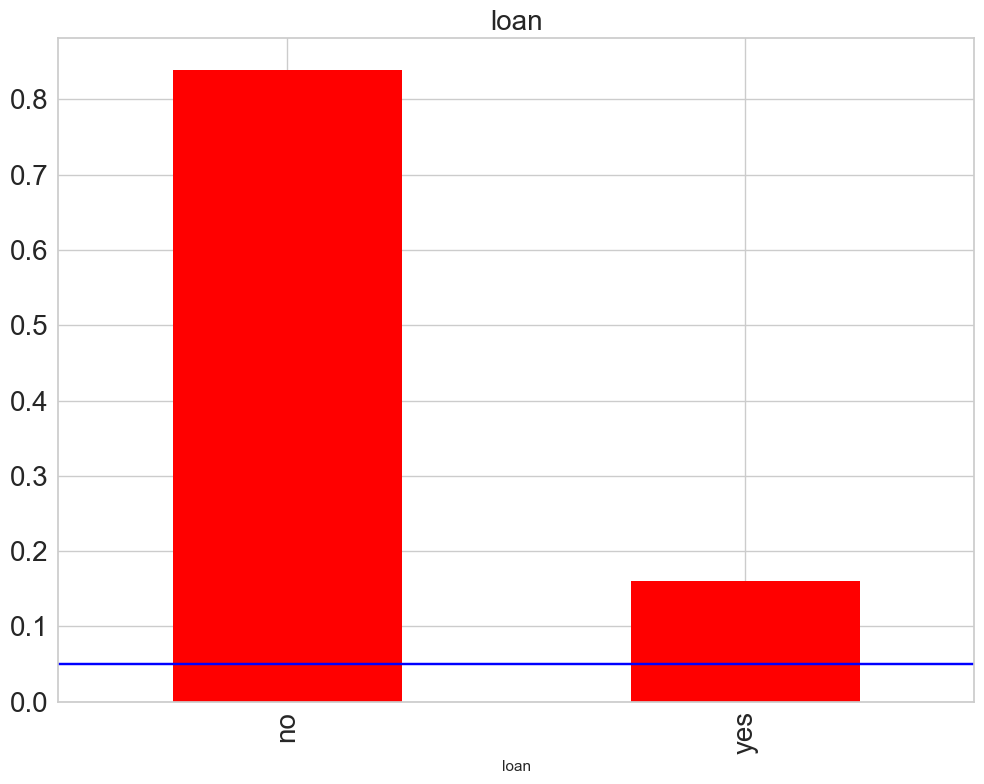

The cardinality of the variable contact is: 3


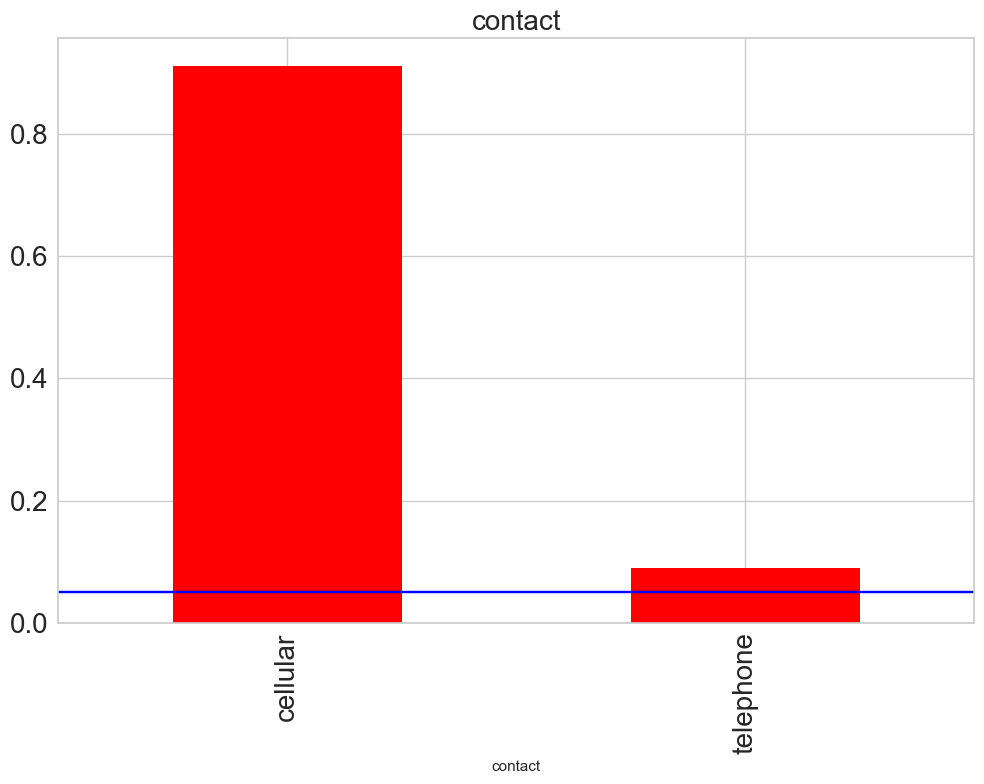

The cardinality of the variable day_of_week is: 31


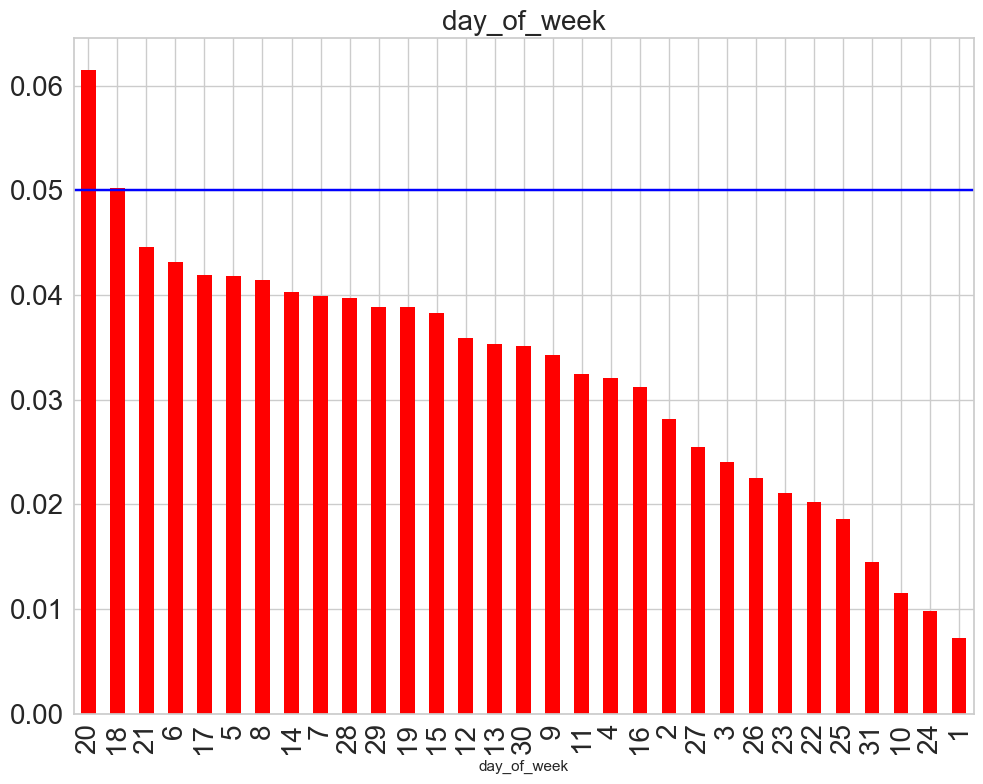

The cardinality of the variable month is: 12


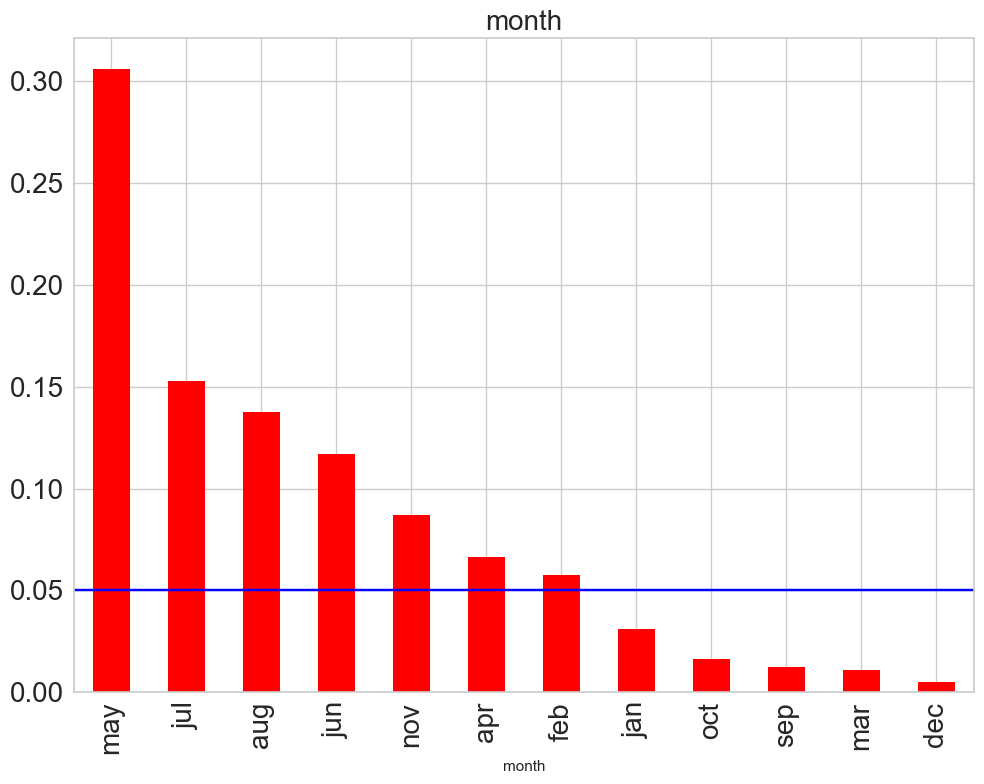

The cardinality of the variable poutcome is: 4


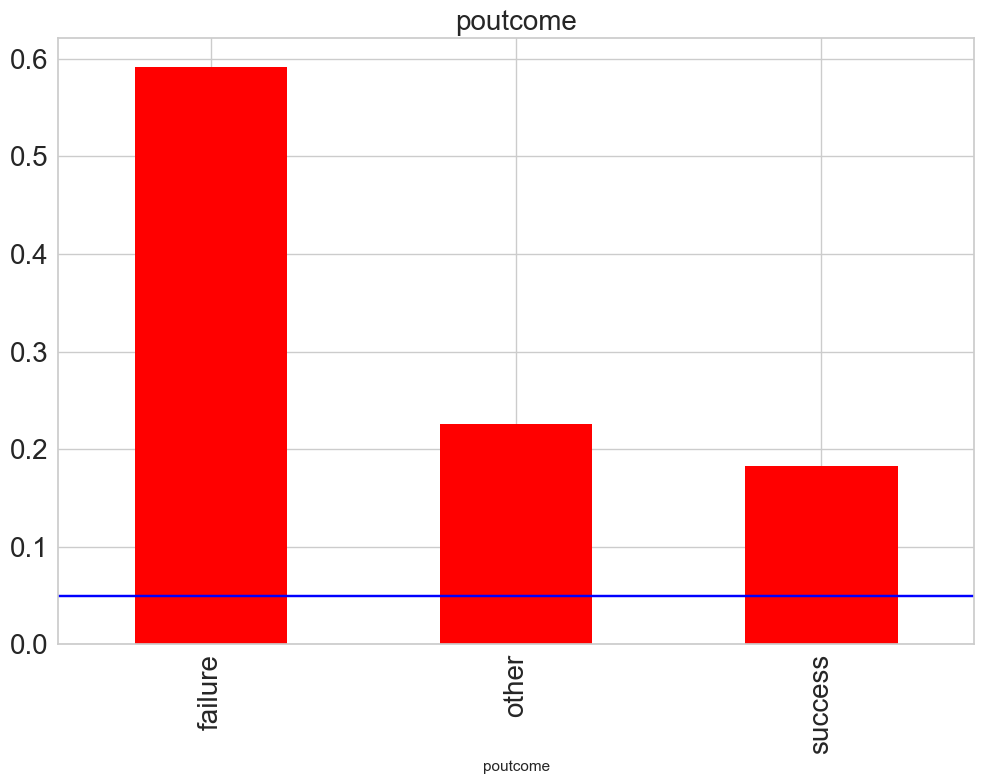

In [13]:
def display_categorical_cardinality(X_train, categorical_variables):
    """plots the cardinality of the categorical variables: number of labels per variable"""
    for variable in categorical_variables:
        print(
            f"The cardinality of the variable {variable} is: {len(X_train[variable].unique())}"
        )

        X_train[variable].value_counts(normalize=True).plot.bar(
            figsize=(10, 8), color="red"
        )
        plt.axhline(y=0.05, color="blue")
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.title(variable, fontsize=20)
        plt.tight_layout()

        plt.show()


display_categorical_cardinality(X_train, categorical_variables)

#### Target variable
Here, we determine the relative proportion of each class. This is an imbalance dataset. Later, we will address how to handle imbalance situation like this. This analysis is also neccessary to help us to decide on the choice of a performace metric

In [14]:
y_train.value_counts(normalize=True)

y
no     0.883018
yes    0.116982
Name: proportion, dtype: float64

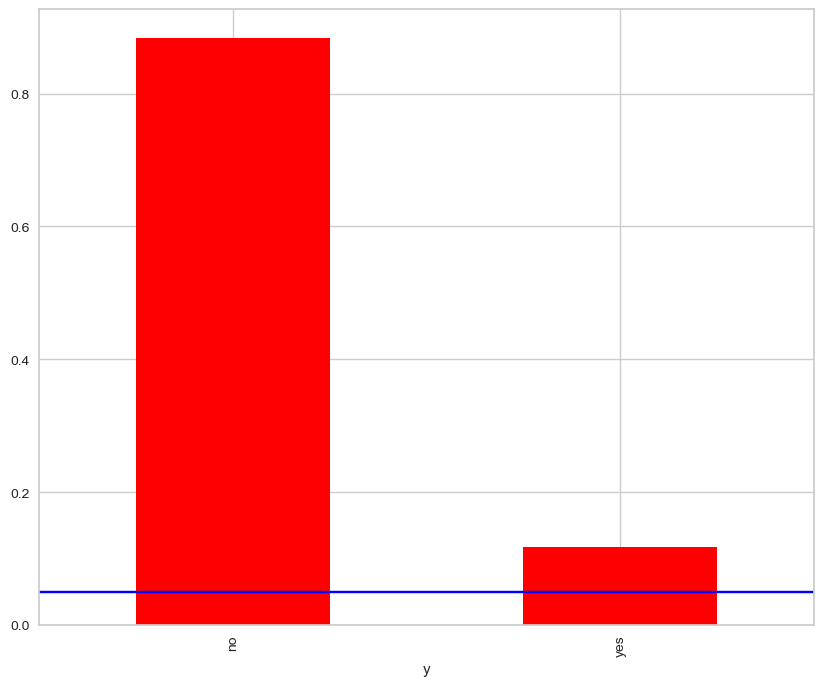

In [15]:
y_train.value_counts(normalize=True).plot.bar(figsize=(10, 8), color="red")
plt.axhline(y=0.05, color="blue")
plt.show()

### Numerical Variables


In [17]:
numeric_features = X_train.select_dtypes(include=["int64", "float64"]).columns.to_list()
numeric_features

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']

In [18]:
# numerical: discrete vs continuous
discrete = [
    var
    for var in X_train.columns
    if X_train[var].dtype != "O" and var != "y" and X_train[var].nunique() < 10
]

continuous = [
    var
    for var in X_train.columns
    if X_train[var].dtype != "O" and var != "y" and var not in discrete
]

print("There are {} discrete numerical variables".format(len(discrete)))
print("There are {} continuous numerical variables".format(len(continuous)))

There are 0 discrete numerical variables
There are 6 continuous numerical variables


In [19]:
# checking this statistics shows outliers in balance, duration, campaign, pdays, previous

X_train[numeric_features].describe()

,age,balance,duration,campaign,pdays,previous
count,36168.000000,36168.00000,36168.000000,36168.000000,36168.000000,36168.000000
mean,40.892999,1365.49342,258.506940,2.763935,40.157238,0.581730
std,10.627075,3068.54350,259.142445,3.104161,100.162614,2.408766
min,18.000000,-8019.00000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,74.00000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,451.00000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1430.25000,318.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.00000,4918.000000,63.000000,871.000000,275.000000


Visualize the numerical variables to see their distribution, and inform your feature engineering steps. Most of the distributions are right skewed which is not desirable for linear models that implicitly assumed a normal distributed orrors. This means we have apply some trasformations or discritization to handle the outliers. Sometimes histograms can be misleading because its distribtion depends on the bin size chosen. To address, I also plotted the QQ plot which shows that these variables are all not normally distributed

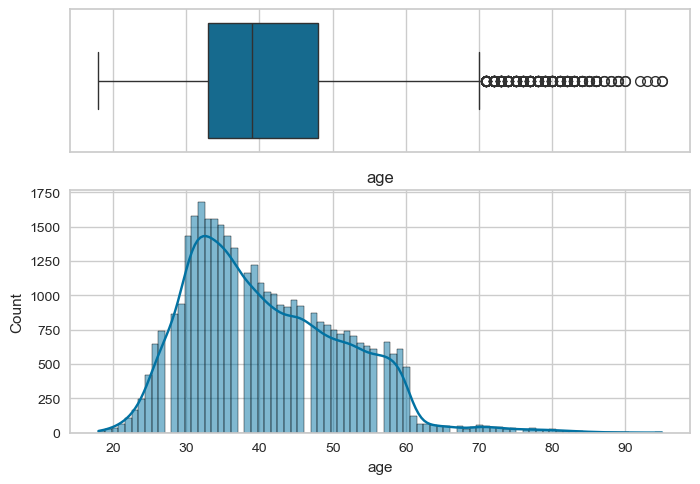

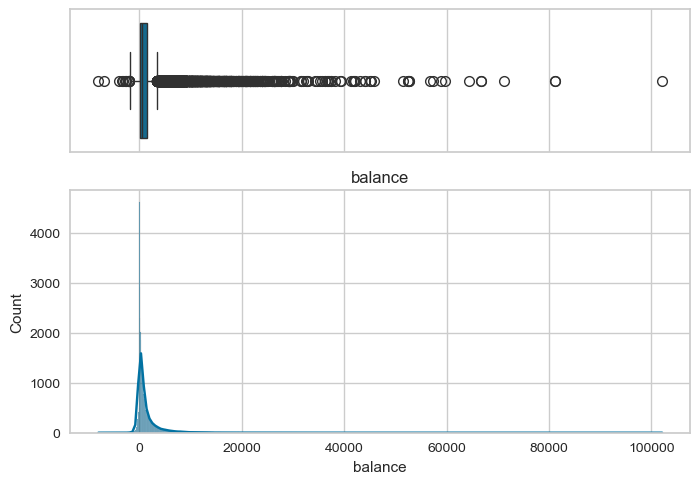

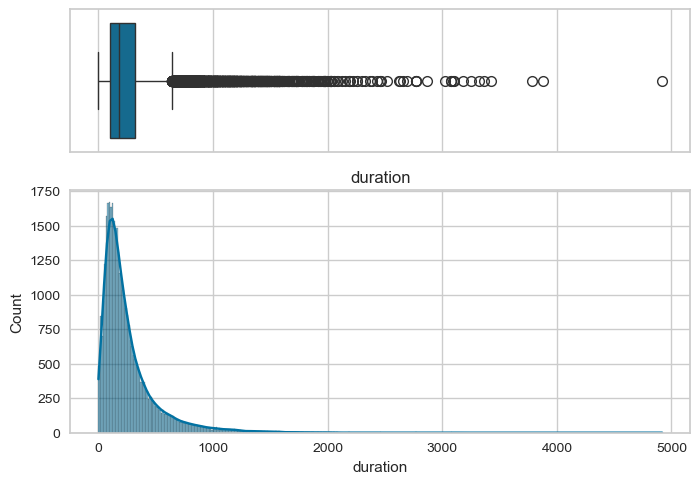

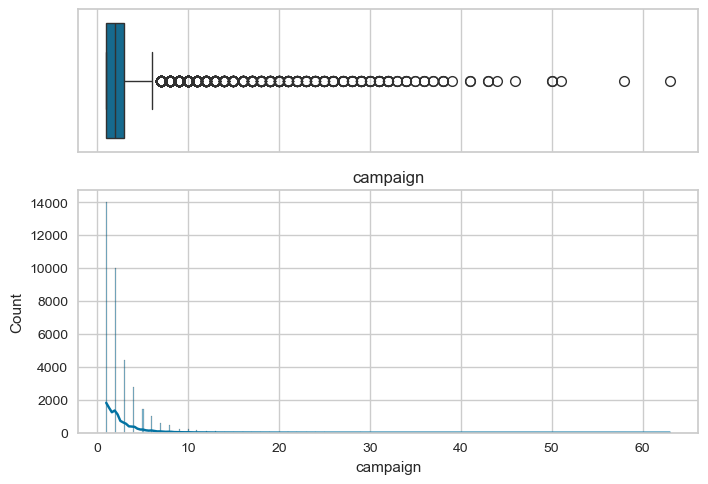

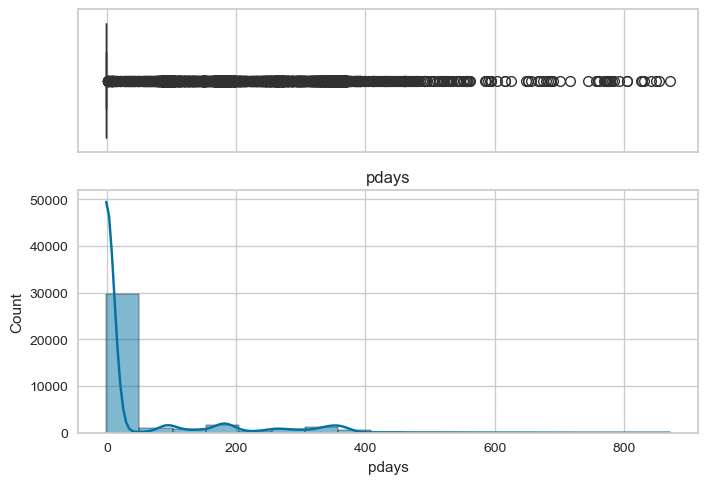

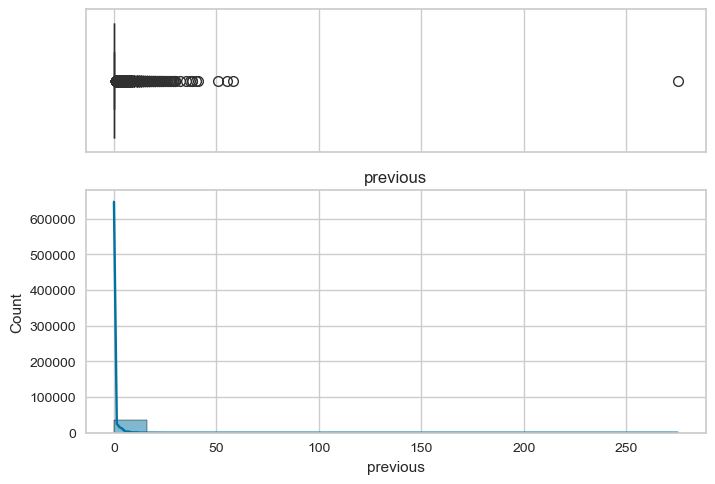

In [20]:
def plot_boxplot_and_hist(data, variable):

    # creating a figure composed of two matplotlib.Axes
    # objects (ax_box and ax_hist)

    f, (ax_box, ax_hist) = plt.subplots(
        2, sharex=True, gridspec_kw={"height_ratios": (0.50, 0.85)}
    )

    # assigning a graph to each ax
    sns.boxplot(x=data[variable], ax=ax_box)
    sns.histplot(data=data, x=variable, ax=ax_hist, kde=True)

    # Remove x axis name for the boxplot
    ax_box.set(xlabel="")
    plt.title(variable)
    plt.show()


def make_qqplot(df, num_col):

    plt.figure(figsize=(10, 6), constrained_layout=True)

    for i, j in enumerate(num_col):
        # location in figure
        ax = plt.subplot(2, 4, i + 1)

        # q-q plot
        stats.probplot((df[j]), dist="norm", plot=plt)

        # add variable name as title
        ax.set_title(j)

    plt.show()


for variable in numeric_features:
    plot_boxplot_and_hist(X_train, variable)

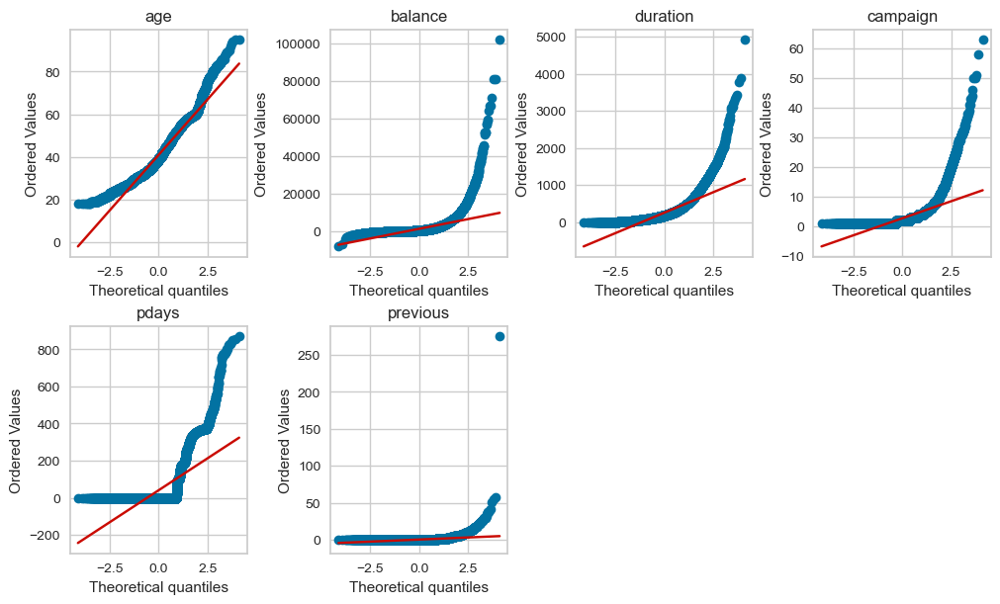

In [21]:
make_qqplot(X_train, numeric_features)

# Feature Engineering

### Missing data impuation

In [22]:
# display the fraction missing data per column

X_train.isnull().mean().sort_values(ascending=False)

poutcome       0.818099
contact        0.287160
education      0.040975
job            0.006470
age            0.000000
marital        0.000000
default        0.000000
balance        0.000000
housing        0.000000
loan           0.000000
day_of_week    0.000000
month          0.000000
duration       0.000000
campaign       0.000000
pdays          0.000000
previous       0.000000
dtype: float64

In [23]:
features_with_nan = [var for var in X_train.columns if X_train[var].isna().any()]
features_with_nan

['job', 'education', 'contact', 'poutcome']

Since categerical and numerical missing data imputations are handle differently, we need to separate these variables types and process them separately. Only the categorical variables have a nan in this dataset. To decide what imputation technique to use, we see the fraction of missing data for each variable and try to understand how this happened. For this dataset it is unclear how the missing data occur so I am going to assume they happened completely randomly. 

For the categorical features: "job" and "education", we will impute the missing value using the most-frequent category imputation (the equivalent of mean/median/mode imputation for numrical variables) plus the missing indicator since less the $5\%$ of the data is missing. This should not affect the statiscal properties of the distribution of the data.

for the other two categories, we use the arbitrary category imputation technique as shown below and their distributions are changed.

In [24]:
imputer = ColumnTransformer(
    [
        (
            "small_cat_imputer",
            SimpleImputer(strategy="most_frequent", add_indicator=True),
            ["job", "education"],
        ),
        (
            "large_cat_imputer",
            SimpleImputer(strategy="constant", fill_value="missing"),
            ["contact", "poutcome"],
        ),
    ],
    remainder="passthrough",
).set_output(transform="pandas")

imputer.fit(X_train)

X_train_imp = imputer.transform(X_train)
X_test_imp = imputer.transform(X_test)

X_train_imp.head()

,small_cat_imputer__job,small_cat_imputer__education,small_cat_imputer__missingindicator_job,small_cat_imputer__missingindicator_education,large_cat_imputer__contact,large_cat_imputer__poutcome,remainder__age,remainder__marital,remainder__default,remainder__balance,remainder__housing,remainder__loan,remainder__day_of_week,remainder__month,remainder__duration,remainder__campaign,remainder__pdays,remainder__previous
24001,technician,secondary,False,False,telephone,missing,36,divorced,no,861,no,no,29,aug,140,2,-1,0
43409,student,secondary,False,False,cellular,failure,24,single,no,4126,no,no,5,apr,907,4,185,7
20669,technician,secondary,False,False,cellular,missing,44,single,no,244,yes,no,12,aug,1735,4,-1,0
18810,unemployed,secondary,False,False,telephone,missing,48,married,no,0,no,no,31,jul,35,11,-1,0
23130,technician,secondary,False,False,cellular,missing,38,married,no,257,no,no,26,aug,57,10,-1,0


This creates a new dataframe with the imputed variables and a missing indicator variable. The imputation did not affect the distribution of the categorical variables with less than 5% of missing values. For categorical variables with more missing data, the distribution chnages with even an additional label called missing

In [25]:
X_train_imp.isnull().mean()

small_cat_imputer__job                           0.0
small_cat_imputer__education                     0.0
small_cat_imputer__missingindicator_job          0.0
small_cat_imputer__missingindicator_education    0.0
large_cat_imputer__contact                       0.0
large_cat_imputer__poutcome                      0.0
remainder__age                                   0.0
remainder__marital                               0.0
remainder__default                               0.0
remainder__balance                               0.0
remainder__housing                               0.0
remainder__loan                                  0.0
remainder__day_of_week                           0.0
remainder__month                                 0.0
remainder__duration                              0.0
remainder__campaign                              0.0
remainder__pdays                                 0.0
remainder__previous                              0.0
dtype: float64

In [26]:
numeric_features_imp = X_train_imp.select_dtypes(
    include=["int64", "float64"]
).columns.to_list()

numeric_features_imp

['remainder__age',
 'remainder__balance',
 'remainder__duration',
 'remainder__campaign',
 'remainder__pdays',
 'remainder__previous']

In [27]:
categorical_variables_imp = X_train_imp.select_dtypes(
    include=["object"]
).columns.to_list()

categorical_variables_imp

['small_cat_imputer__job',
 'small_cat_imputer__education',
 'small_cat_imputer__missingindicator_job',
 'small_cat_imputer__missingindicator_education',
 'large_cat_imputer__contact',
 'large_cat_imputer__poutcome',
 'remainder__marital',
 'remainder__default',
 'remainder__housing',
 'remainder__loan',
 'remainder__day_of_week',
 'remainder__month']

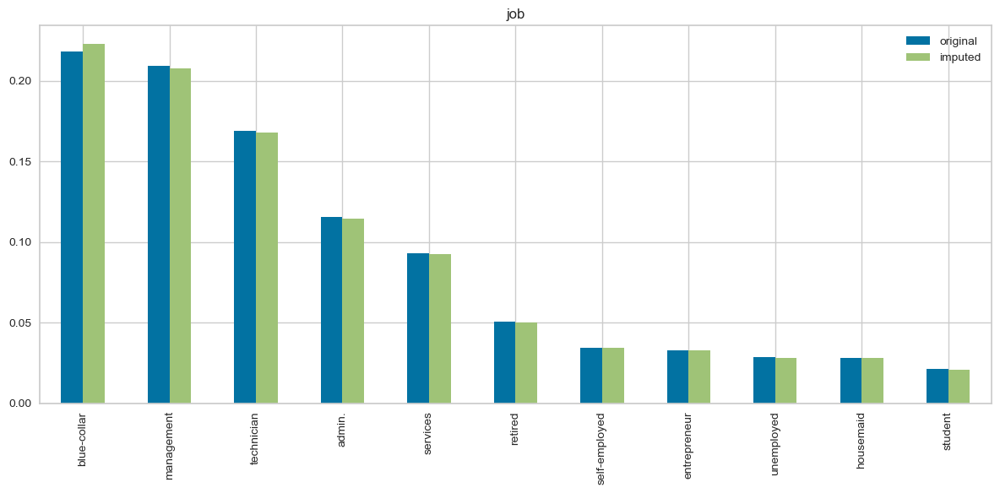

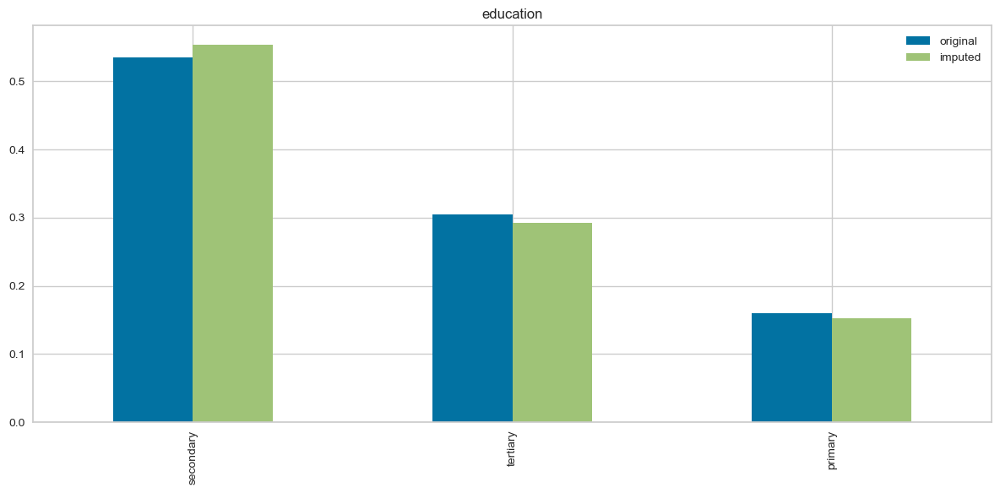

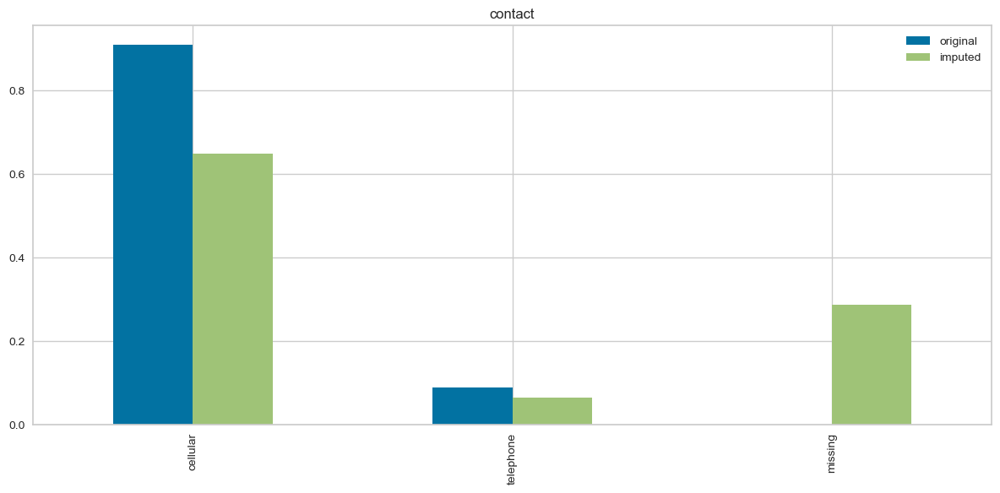

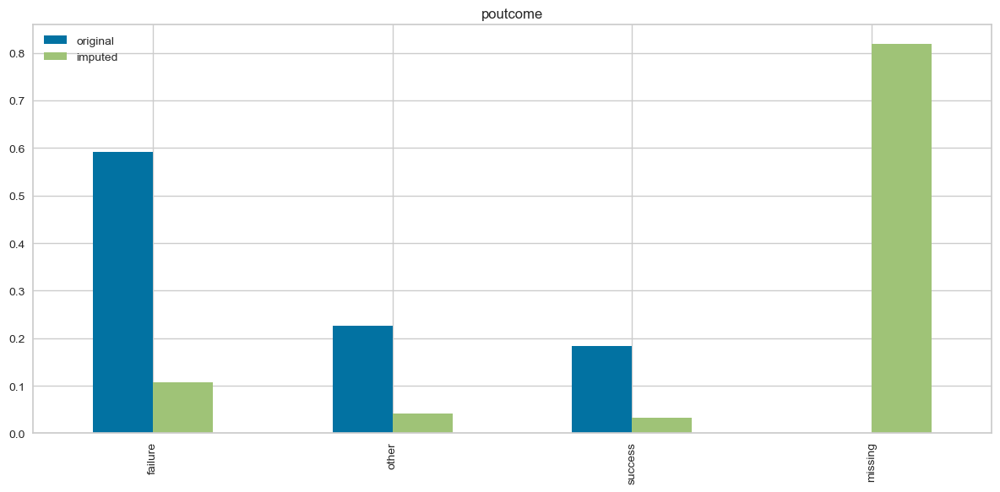

In [29]:
# below we can see the percentage of observations per category, original data vs imputed data
def categorical_distribution(df, df_imp, variable, variable_imp):
    tmp = pd.concat(
        [
            # percentage of observations per category, original data
            df[variable].value_counts(normalize=True),
            # percentage of observations per category, cca data
            df_imp[variable_imp].value_counts(normalize=True),
        ],
        axis=1,
    )

    # add column names
    tmp.columns = ["original", "imputed"]

    return tmp


variable_imp = [
    "small_cat_imputer__job",
    "small_cat_imputer__education",
    "large_cat_imputer__contact",
    "large_cat_imputer__poutcome",
]

for i, j in zip(features_with_nan, variable_imp):

    temp = categorical_distribution(X_train, X_train_imp, i, j)

    temp.plot(kind="bar", figsize=(12, 6), title=i)
    plt.tight_layout()
    plt.show()

### Correlation

Here, we see that pdays and poutcome are highly correlated but poutcome has more predictive power. Hence pdays will be dropped. This is not surprising as both variables are related to the previous campaign. The same holds for previous and poutcome and I dropped previous. Similar argument goes for job and education and education is dropped

Dropped variables:
* pdays
* previous
* education
* missingindicators have no predictive power and hence dropped

The most predictive variables are duration, poutcome and month in decreasing order. Visualizing the numeric variables, I dont see a clear correlation then them. In the next sections, we will see if any of the transformation will improve the correlations

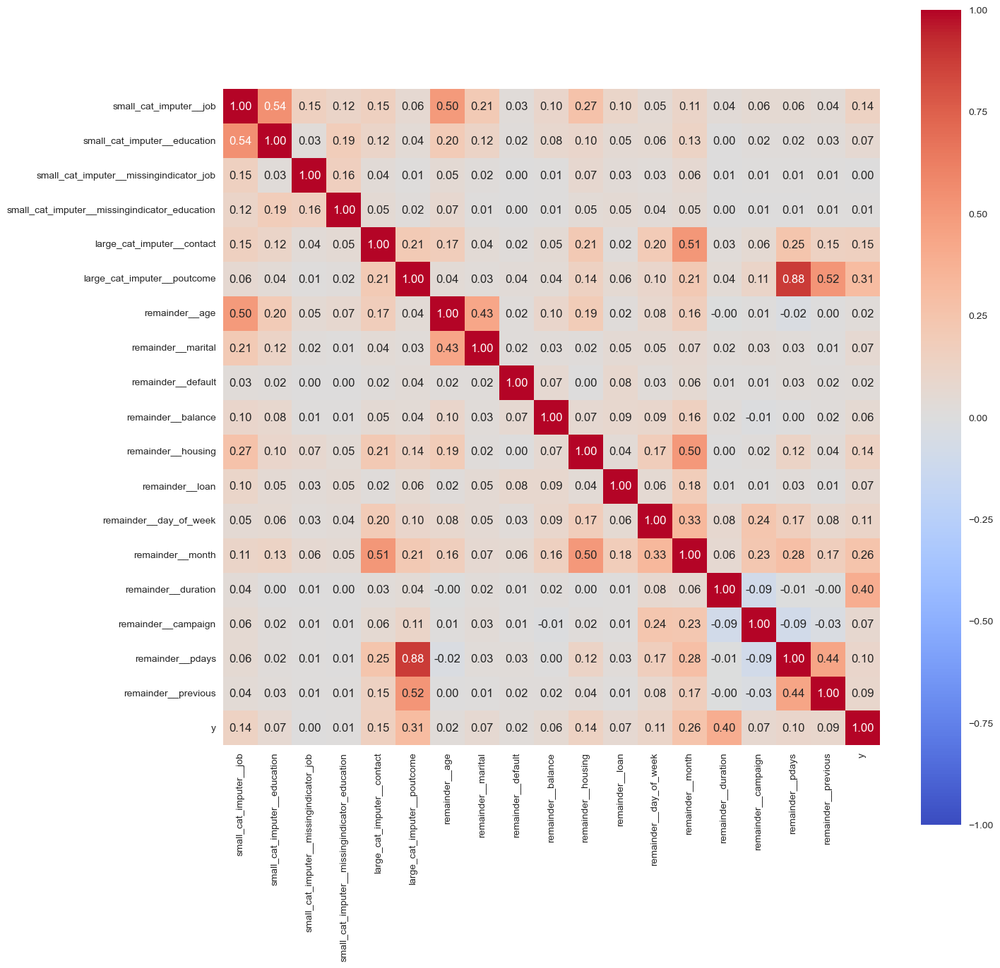

In [30]:
data_imp = pd.concat([X_train_imp, y_train], axis=1)

assoc = associations(
    data_imp,
    nominal_columns=categorical_variables_imp + ["y"],
    numerical_columns=numeric_features_imp,
    nom_nom_assoc="cramer",
    num_num_assoc="pearson",
    nom_num_assoc="correlation_ratio",
    plot=True,
    cmap="coolwarm",
    figsize=(15, 15),
)


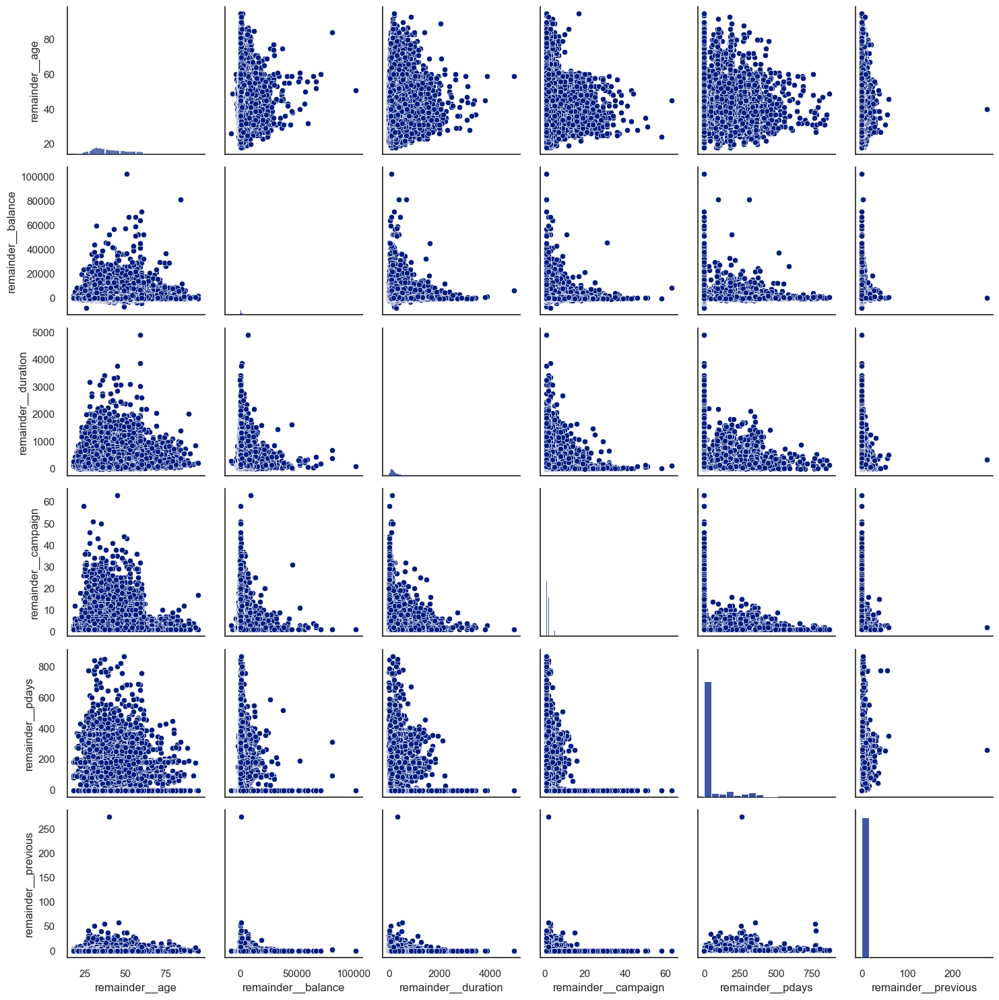

In [37]:
sns.set_context("notebook")
sns.set_style("white")
sns.set_palette("dark")
sns.pairplot(data_imp.select_dtypes(include=["int64", "float64"]))
plt.tight_layout()
plt.show()

In [42]:
print(X_train_imp.shape, X_test_imp.shape)
X_train_imp.drop(
    columns=[
        "remainder__pdays",
        "remainder__previous",
        "small_cat_imputer__education",
        "small_cat_imputer__missingindicator_education",
    ],
    axis=1,
    inplace=True,
)

X_test_imp.drop(
    columns=[
        "remainder__pdays",
        "remainder__previous",
        "small_cat_imputer__education",
        "small_cat_imputer__missingindicator_education",
    ],
    axis=1,
    inplace=True,
)

X_train_imp.shape, X_test_imp.shape

(36168, 18) (9043, 18)


((36168, 14), (9043, 14))

### Outlier Detection
Detection: using quantile and IQR for a skewed distribution and mean plus std for a normally distributed variable.

Techniques for handling include: trimming (removing outliers), censoring (capping), discretization, and missing data with imputaion. In this work, I used discretization.

In [43]:
X_train_imp.select_dtypes(include=["int64", "float64"]).describe()

,remainder__age,remainder__balance,remainder__duration,remainder__campaign
count,36168.000000,36168.00000,36168.000000,36168.000000
mean,40.892999,1365.49342,258.506940,2.763935
std,10.627075,3068.54350,259.142445,3.104161
min,18.000000,-8019.00000,0.000000,1.000000
25%,33.000000,74.00000,103.000000,1.000000
50%,39.000000,451.00000,180.000000,2.000000
75%,48.000000,1430.25000,318.000000,3.000000
max,95.000000,102127.00000,4918.000000,63.000000


Carefully studyning the statistical properties of the numerical variables, we see that variables: pdays balance, duration, campaign and previous. 

#### Trimming
This removes outliers from the dataset. Since the distributions are skewed, the quantile and IQR techniques are used. I setteled with quantiles, as the IQR was aggressive in removing most of the observations

In [44]:
trimmer = OutlierTrimmer(
    variables=[
        "remainder__balance",
        "remainder__duration",
        "remainder__campaign",
    ],
    capping_method="quantiles",
    tail="both",
    fold=0.02,
)

trimmer.fit(X_train_imp)

OutlierTrimmer(capping_method='quantiles', fold=0.02, tail='both',
               variables=['remainder__balance', 'remainder__duration',
                          'remainder__campaign'])

In [45]:
trimmer.left_tail_caps_

{'remainder__balance': -429.0,
 'remainder__duration': 16.0,
 'remainder__campaign': 1.0}

In [46]:
trimmer.right_tail_caps_

{'remainder__balance': 9367.0,
 'remainder__duration': 1055.0,
 'remainder__campaign': 12.0}

In [47]:
print(X_train_imp.shape, X_test_imp.shape)

X_train_imp_enc = trimmer.transform(X_train_imp)
X_test_imp_enc = trimmer.transform(X_test_imp)

print(X_train_imp_enc.shape, X_test_imp_enc.shape)

(36168, 14) (9043, 14)
(32834, 14) (8202, 14)


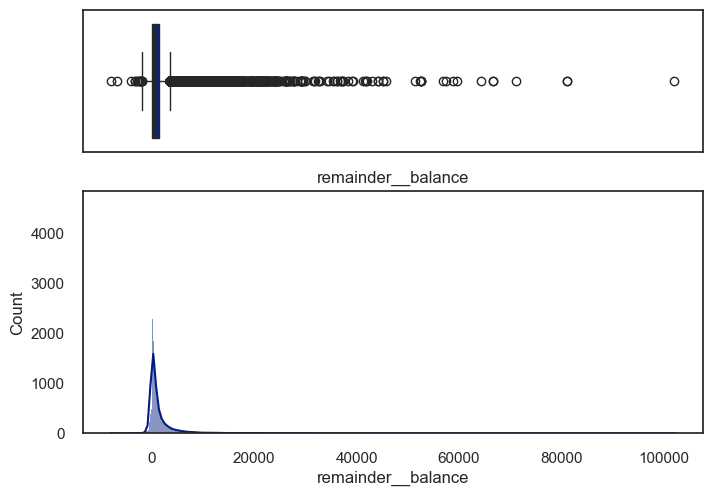

In [48]:
# plot the distributions of the variables before trimming
plot_boxplot_and_hist(X_train_imp, "remainder__balance")

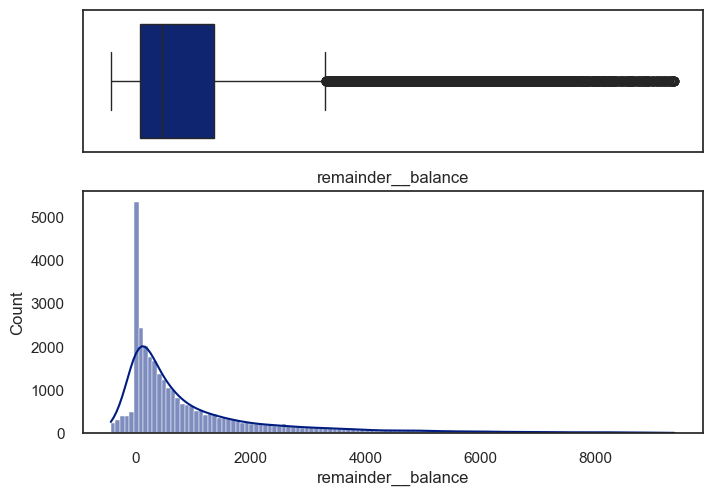

In [49]:
# plot the distributions of the variables after trimming

plot_boxplot_and_hist(X_train_imp_enc, "remainder__balance")

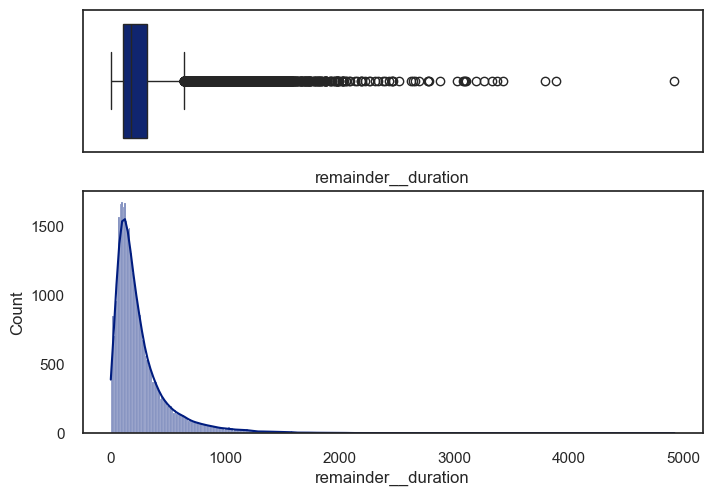

In [50]:
# plot the distributions of the variables before trimming

plot_boxplot_and_hist(X_train_imp, "remainder__duration")

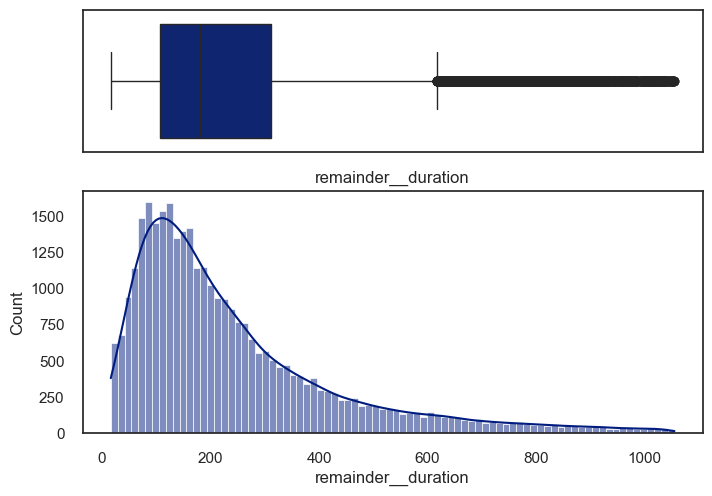

In [51]:
# plot the distributions of the variables after trimming

plot_boxplot_and_hist(X_train_imp_enc, "remainder__duration")

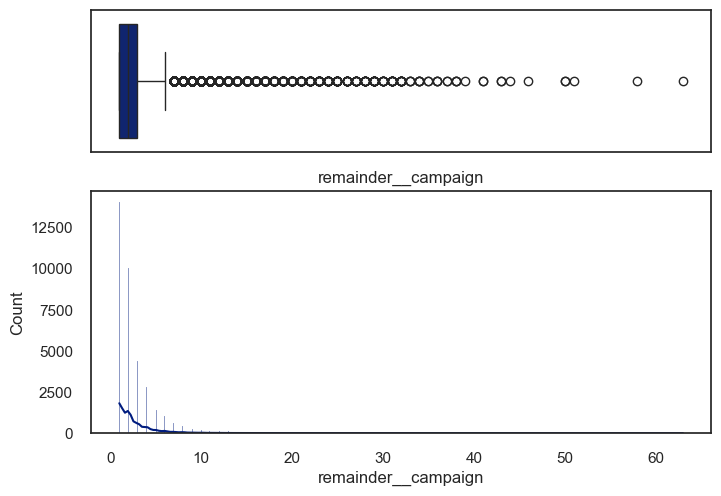

In [52]:
# plot the distributions of the variables before trimming

plot_boxplot_and_hist(X_train_imp, "remainder__campaign")

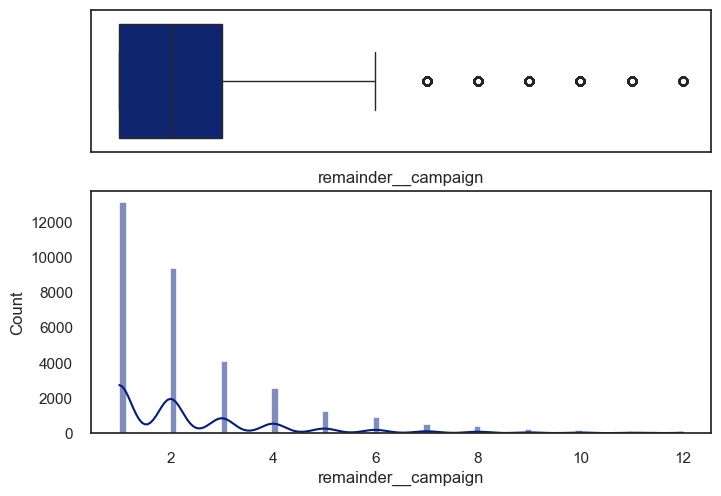

In [53]:
# plot the distributions of the variables after trimming

plot_boxplot_and_hist(X_train_imp_enc, "remainder__campaign")

#### Capping

replaces an outlier with a fixed or arbitrary value. Since I dont want to get rid of data, I am using this technique in the remaining part of the work

In [54]:
capper = Winsorizer(
    variables=[
        "remainder__balance",
        "remainder__duration",
        "remainder__campaign",
    ],
    capping_method="quantiles",
    tail="both",
    fold=0.02,
)

capper.fit(X_train_imp)

Winsorizer(capping_method='quantiles', fold=0.02, tail='both',
           variables=['remainder__balance', 'remainder__duration',
                      'remainder__campaign'])

In [55]:
capper.left_tail_caps_

{'remainder__balance': -429.0,
 'remainder__duration': 16.0,
 'remainder__campaign': 1.0}

In [56]:
capper.right_tail_caps_

{'remainder__balance': 9367.0,
 'remainder__duration': 1055.0,
 'remainder__campaign': 12.0}

In [57]:
print(X_train_imp.shape, X_test_imp.shape)

X_train_imp_enc = capper.transform(X_train_imp)
X_test_imp_enc = capper.transform(X_test_imp)

print(X_train_imp_enc.shape, X_test_imp_enc.shape)

(36168, 14) (9043, 14)
(36168, 14) (9043, 14)


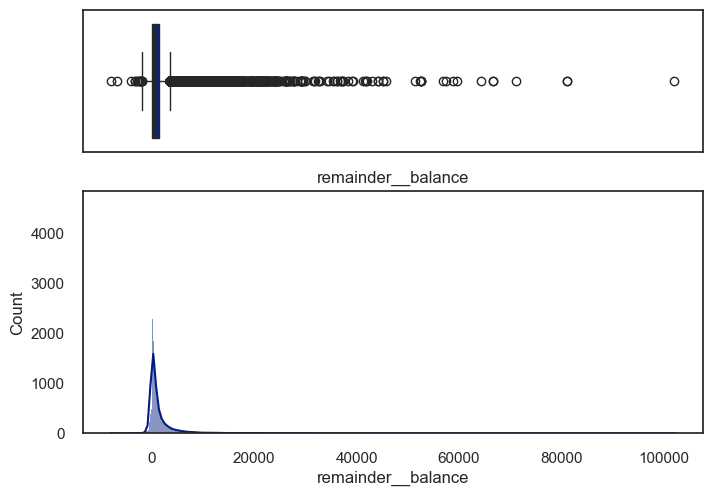

In [58]:
plot_boxplot_and_hist(X_train_imp, "remainder__balance")

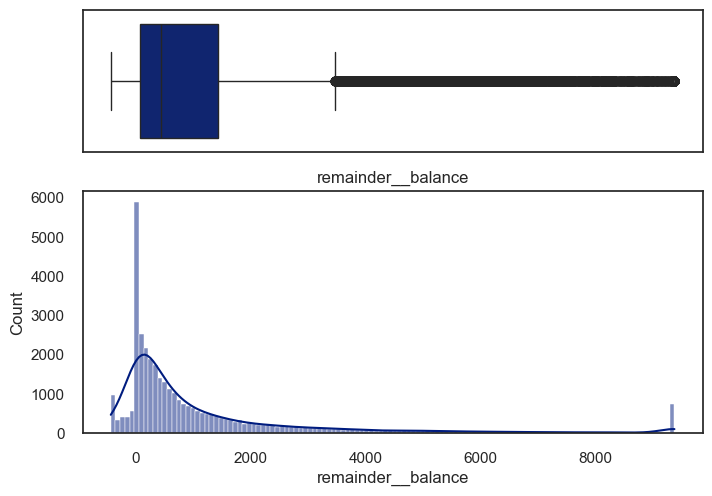

In [59]:
# plot the distributions of the variables after capping

plot_boxplot_and_hist(X_train_imp_enc, "remainder__balance")

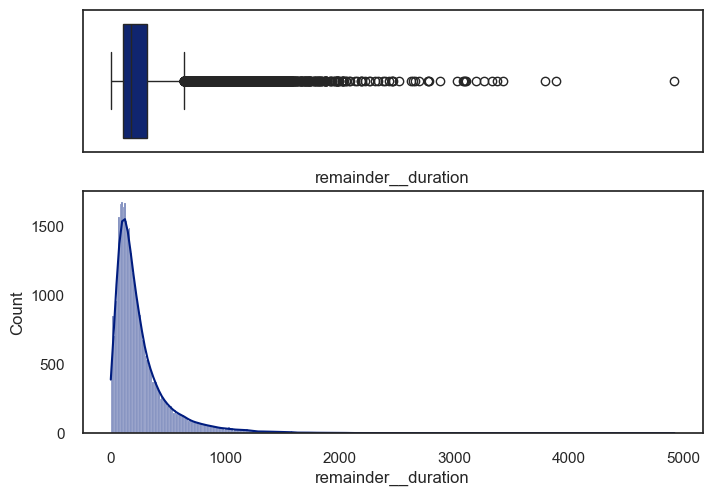

In [60]:
plot_boxplot_and_hist(X_train_imp, "remainder__duration")

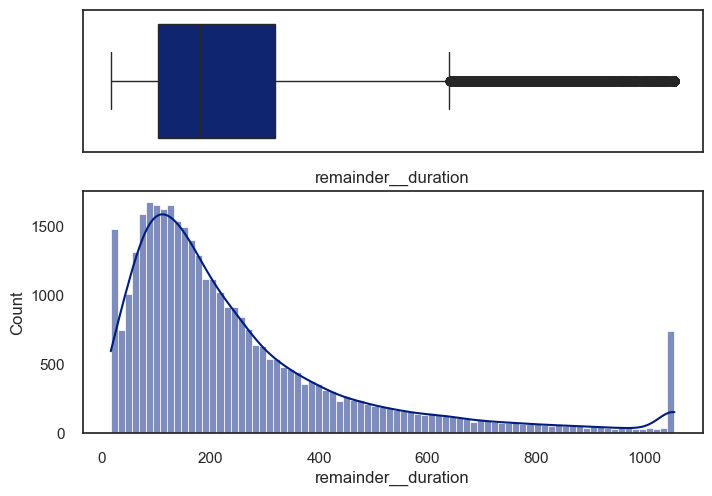

In [61]:
# plot the distributions of the variables after capping

plot_boxplot_and_hist(X_train_imp_enc, "remainder__duration")

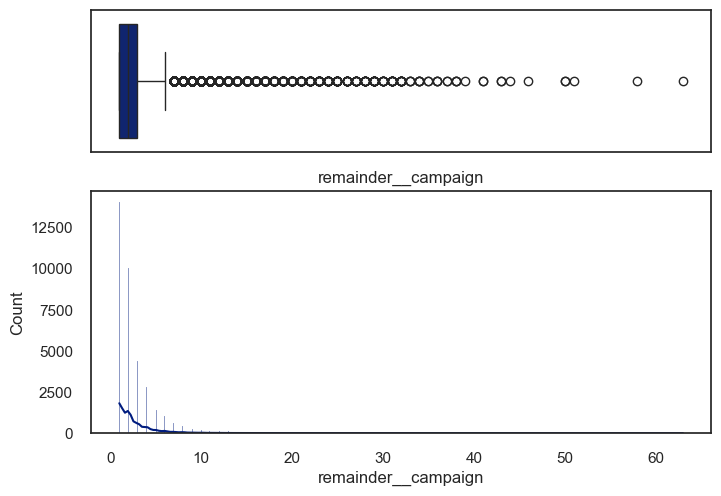

In [62]:
plot_boxplot_and_hist(X_train_imp, "remainder__campaign")

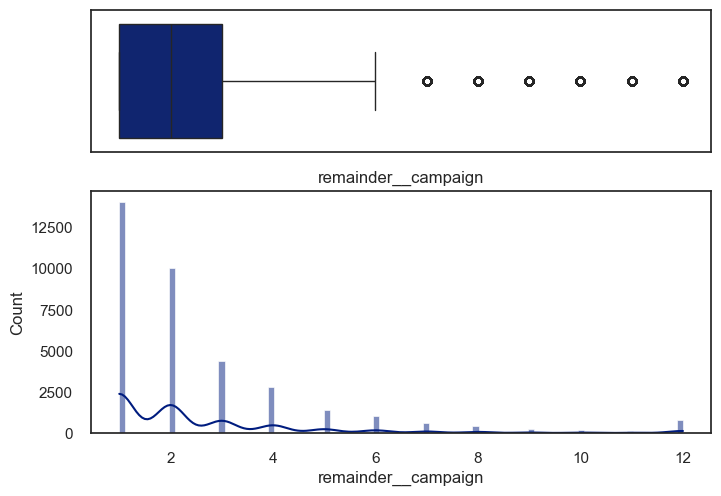

In [63]:
# plot the distributions of the variables after capping

plot_boxplot_and_hist(X_train_imp_enc, "remainder__campaign")

## Power Transformation
Apply a power transformation using the Yeo-Johnson formulation (since it generalises the Box-Cox fromulation to cover negative values). This transformation works well with age and duration and not so great with balance and campaign. The distribution of the variable affects the performance of the model hence as a further step in this direction, I binned/discritise the data. This is also a way to handle outliers for continuous numeric variable.





In [67]:
col_trans = X_train_imp_enc.select_dtypes(
    include=["int64", "float64"]
).columns.to_list()
col_trans

['remainder__age',
 'remainder__balance',
 'remainder__duration',
 'remainder__campaign']

In [68]:
# initialize the transformer with yeo-johnson

transformer = PowerTransformer(method="yeo-johnson", standardize=False)

transformer.set_output(transform="pandas")
transformer.fit(X_train_imp_enc[col_trans])

X_tf = transformer.transform(X_train_imp_enc[col_trans])

X_tf.head()

,remainder__age,remainder__balance,remainder__duration,remainder__campaign
24001,2.554665,292.642332,6.911459,0.648721
43409,2.359374,1042.895845,10.879795,0.771661
20669,2.646476,104.905626,11.244999,0.771661
18810,2.685287,0.000000,4.548999,0.875054
23130,2.579719,109.442347,5.327717,0.868525


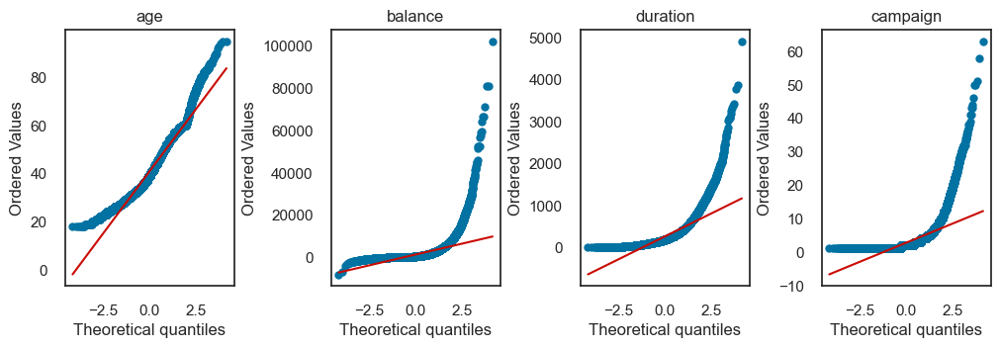

In [71]:
# original data before transformation and outlier capping
make_qqplot(X_train, numeric_features[:-2])

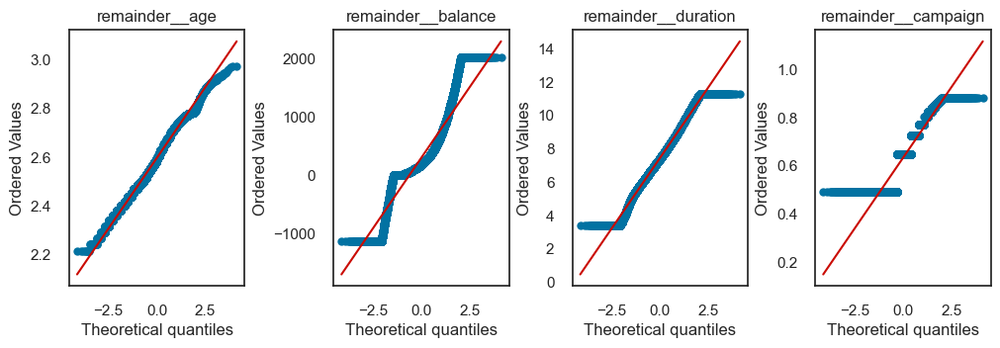

In [70]:
make_qqplot(X_tf, col_trans)

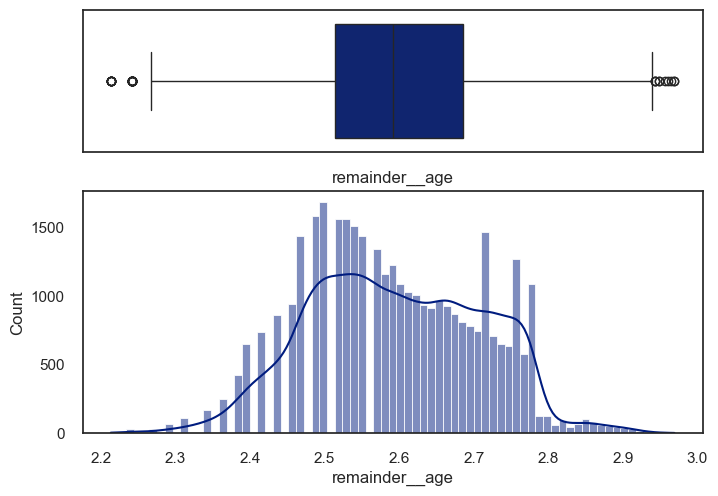

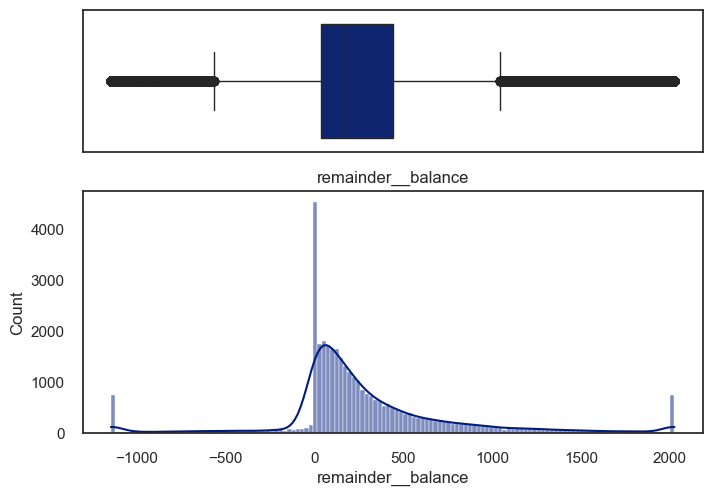

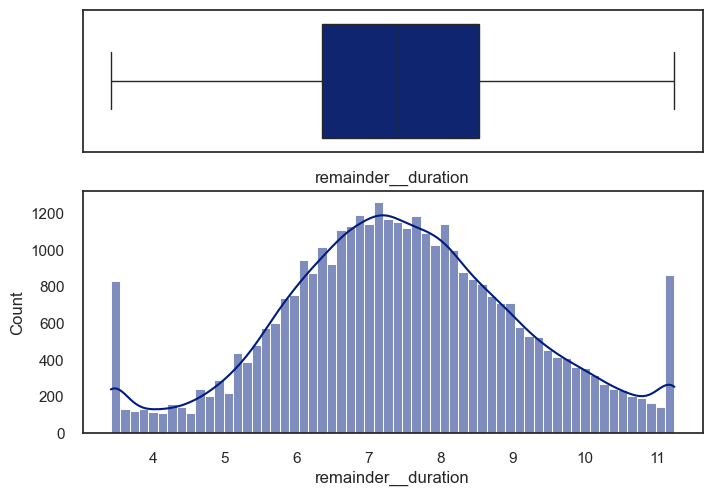

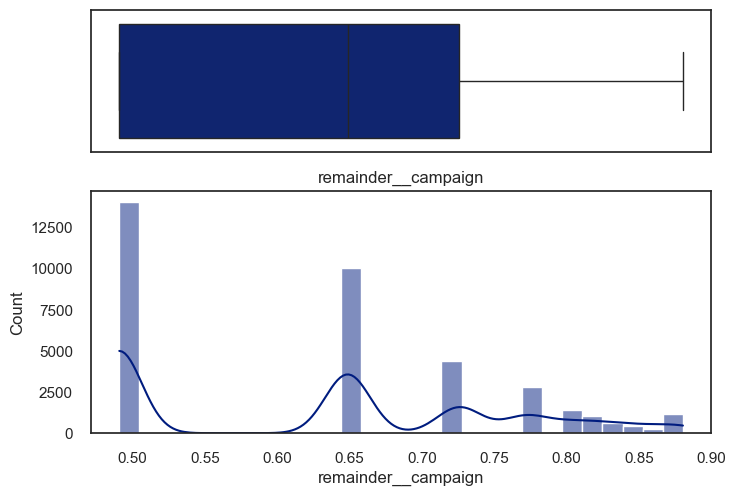

In [72]:
for variable in col_trans:
    plot_boxplot_and_hist(X_tf, variable)

### Discritization

For the other numeric features I applied discretization techniques to handle the outliers that might exist and also created simple features 

3. For day of week, added a cyclical feature, separate 7 days a week feature

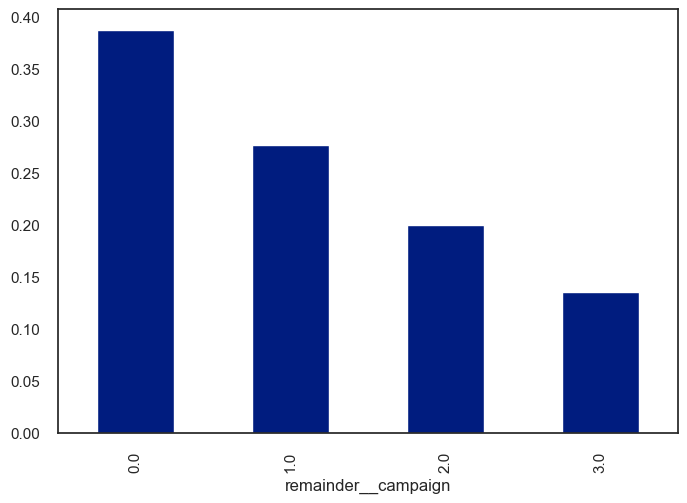

In [83]:
# differen bins and strategies were tried and the best one was chosen to give the value spread
disc = KBinsDiscretizer(
    n_bins=4,
    encode="ordinal",
    strategy="uniform",
    subsample=None,
)

disc.set_output(transform="pandas")

disc.fit(X_tf[["remainder__campaign"]])
train_t = disc.transform(X_tf[["remainder__campaign"]])
t1 = train_t["remainder__campaign"].value_counts(normalize=True).sort_index()
t1.plot.bar()
plt.show()

<Axes: xlabel='remainder__duration'>

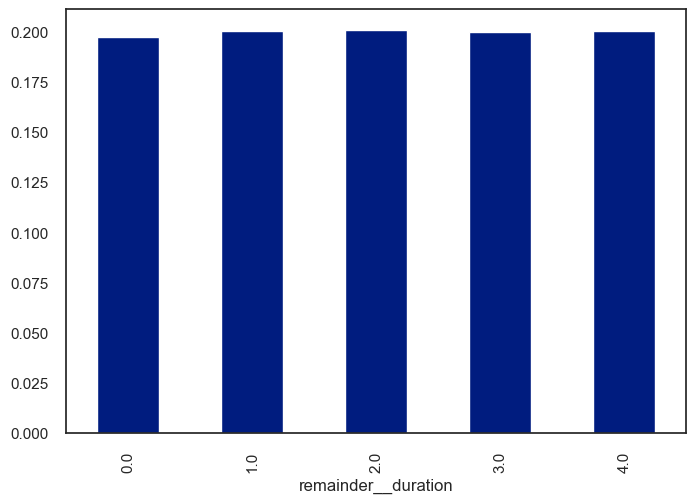

In [77]:
# differen bins and strategies were tried and the best one was chosen to give the value spread
disc = KBinsDiscretizer(
    n_bins=5,
    encode="ordinal",
    strategy="quantile",
    subsample=None,
)

disc.set_output(transform="pandas")

disc.fit(X_tf[["remainder__duration"]])
train_t = disc.transform(X_tf[["remainder__duration"]])
t1 = train_t["remainder__duration"].value_counts(normalize=True).sort_index()
t1.plot.bar()

<Axes: xlabel='remainder__balance'>

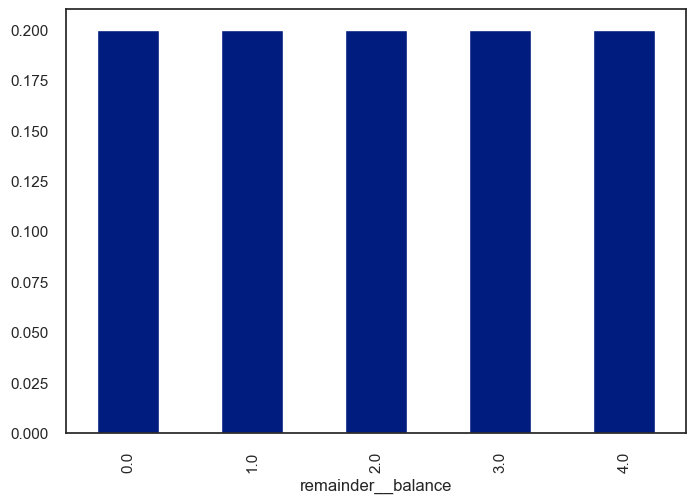

In [75]:
disc = KBinsDiscretizer(
    n_bins=5,
    encode="ordinal",
    strategy="quantile",
    subsample=None,
)

disc.set_output(transform="pandas")

disc.fit(X_tf[["remainder__balance"]])
train_t = disc.transform(X_tf[["remainder__balance"]])
t1 = train_t["remainder__balance"].value_counts(normalize=True).sort_index()
t1.plot.bar()

<Axes: xlabel='remainder__age'>

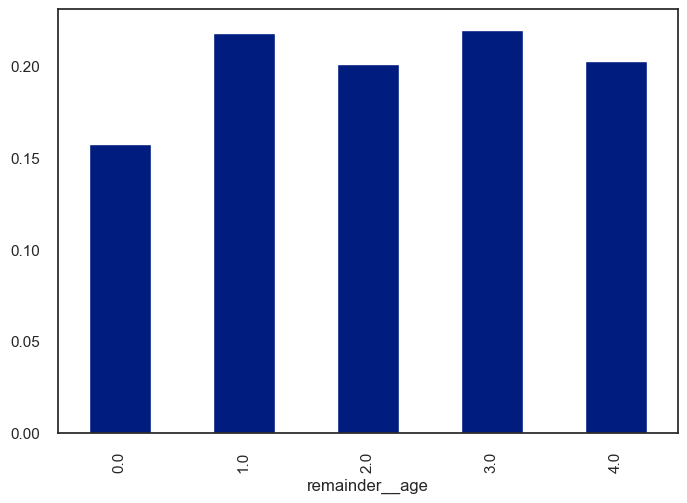

In [76]:
disc = KBinsDiscretizer(
    n_bins=5,
    encode="ordinal",
    strategy="quantile",
    subsample=None,
)

disc.set_output(transform="pandas")

disc.fit(X_tf[["remainder__age"]])
train_t = disc.transform(X_tf[["remainder__age"]])
t1 = train_t["remainder__age"].value_counts(normalize=True).sort_index()
t1.plot.bar()

### Seasonal Features

<Axes: xlabel='remainder__day_of_week'>

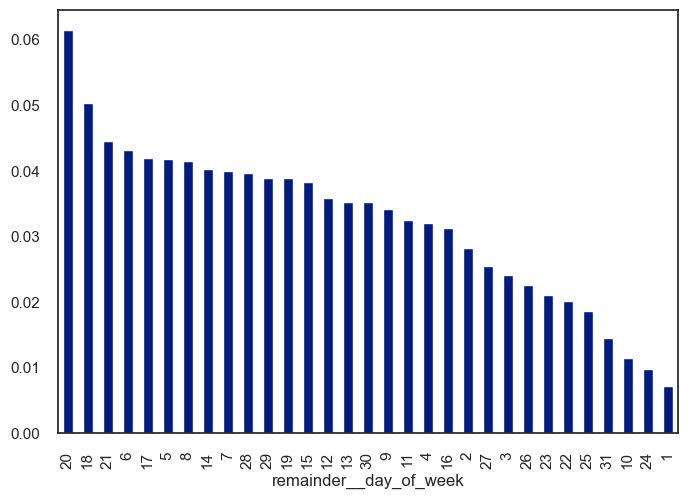

In [85]:
X_train_imp_enc["remainder__day_of_week"].value_counts(normalize=True).plot.bar()

<Axes: xlabel='day_of_week'>

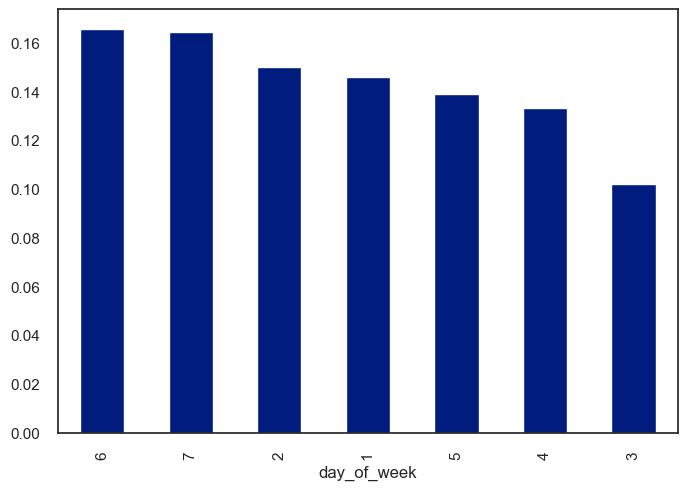

In [86]:
# create a feature for days in a week
day = X_train[["day_of_week"]].apply(lambda x: ((x - 1) % 7) + 1)
day["day_of_week"].value_counts(normalize=True).plot.bar()

<Axes: xlabel='day_of_week'>

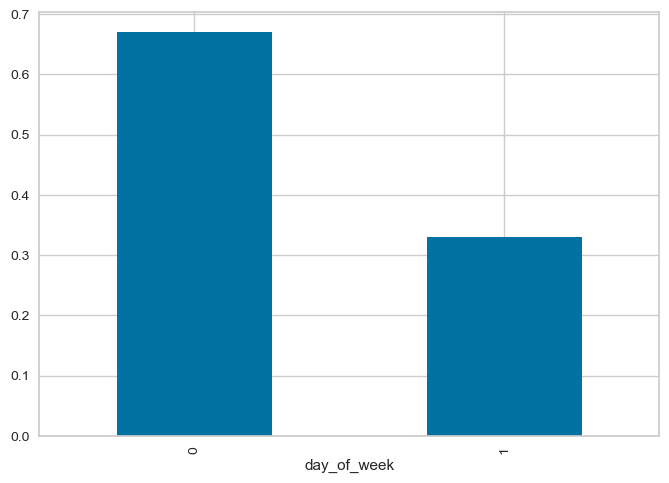

In [69]:
# create a feature for weekend
sd["day_of_week"].isin([6, 7]).astype(int).value_counts(normalize=True).plot.bar()

In [70]:
sd["day_of_week_sin"] = np.sin(sd["day_of_week"] / sd["day_of_week"].max() * 2 * np.pi)


# Transform day_of_week with cosine.
sd["day_of_week_cos"] = np.cos(sd["day_of_week"] / sd["day_of_week"].max() * 2 * np.pi)
# sd["day_of_week_sin"].plot.bar()

In [71]:
# create custom features


class CustomFeatureCreator(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Assume X is a DataFrame
        X = X.copy()

        # X["is_unemployed"] = (
        #     X["job"].isin(["unemployed", "student", "retired"]).astype(int)
        # )
        # X["is_married"] = (X["marital"] == "married").astype(int)
        X["day"] = X["day_of_week"].apply(lambda x: ((x - 1) % 7) + 1).astype(int)
        X["day_of_week_sin"] = np.sin(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_of_week_cos"] = np.cos(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_sin"] = np.sin(X["day"] / X["day"].max() * 2 * np.pi)
        X["day_cos"] = np.cos(X["day"] / X["day"].max() * 2 * np.pi)

        X["is_weekend"] = X["day_of_week"].isin([6, 7]).astype(int)
        # Map each month to its respective quarter
        # month_to_quarter = {
        #     "jan": "1st quarter",
        #     "feb": "1st quarter",
        #     "mar": "1st quarter",
        #     "apr": "2nd quarter",
        #     "may": "2nd quarter",
        #     "jun": "2nd quarter",
        #     "jul": "3rd quarter",
        #     "aug": "3rd quarter",
        #     "sep": "3rd quarter",
        #     "oct": "4th quarter",
        #     "nov": "4th quarter",
        #     "dec": "4th quarter",
        # }

        # X["quarter"] = X["month"].map(month_to_quarter)

        return X

### Categorical features

1. **months**


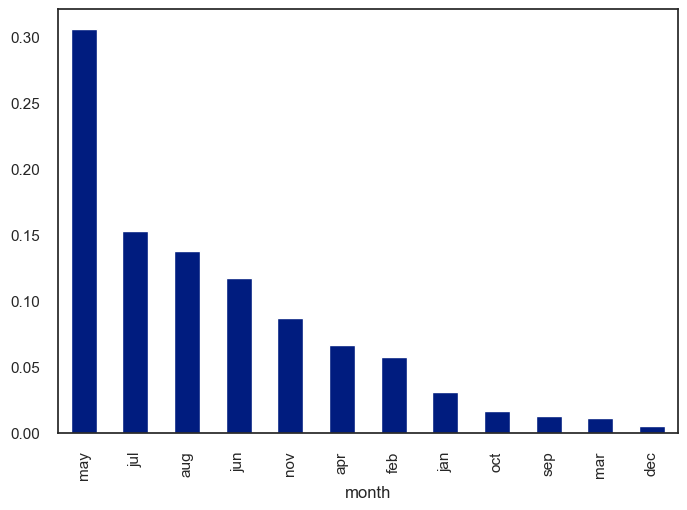

In [92]:
X_train["month"].value_counts(normalize=True).plot.bar()
plt.show()

<Axes: xlabel='month'>

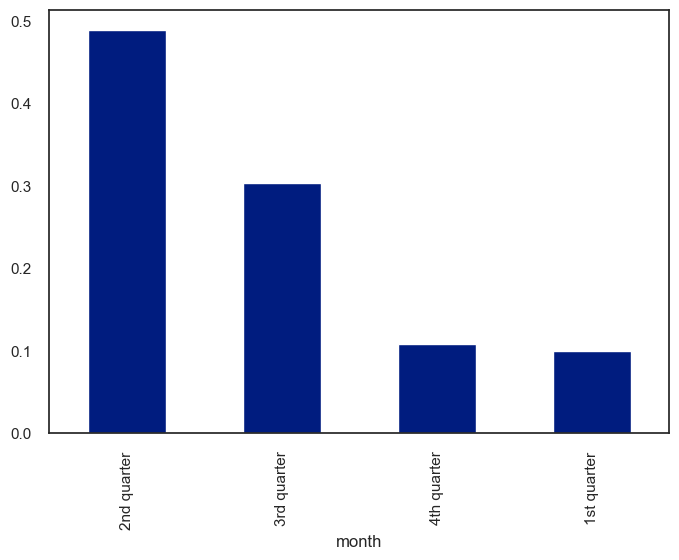

In [93]:
# create quarter feature
month_to_quarter = {
    "jan": "1st quarter",
    "feb": "1st quarter",
    "mar": "1st quarter",
    "apr": "2nd quarter",
    "may": "2nd quarter",
    "jun": "2nd quarter",
    "jul": "3rd quarter",
    "aug": "3rd quarter",
    "sep": "3rd quarter",
    "oct": "4th quarter",
    "nov": "4th quarter",
    "dec": "4th quarter",
}
Q1 = X_train["month"].map(month_to_quarter)
Q1.value_counts(normalize=True).plot.bar()

In [89]:
# create semester feature
# month_to_semester = {
#     "jan": "1st semester",
#     "feb": "1st semester",
#     "mar": "1st semester",
#     "apr": "1st semester",
#     "may": "1st semester",
#     "jun": "1st semester",
#     "jul": "2nd semester",
#     "aug": "2nd semester",
#     "sep": "2nd semester",
#     "oct": "2nd semester",
#     "nov": "2nd semester",
#     "dec": "2nd semester",
# }

# Q1 = X_train["month"].map(month_to_semester)
# Q1.value_counts(normalize=True).plot.bar()
# plt.show()

2. **Marital**

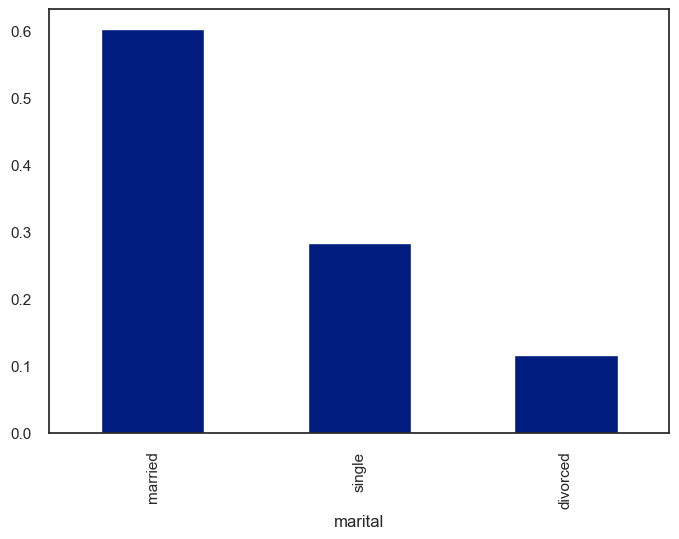

In [94]:
# use this as it is and encode it or binarize it as done later

X_train["marital"].value_counts(normalize=True).plot.bar()
plt.show()

In [90]:
# create a feature for married or not married
# (X_train["marital"] == "married").astype(int).value_counts(normalize=True).plot.bar()
# plt.show()

3. **Jobs**

to handle the rare group, we can use techniques like
* encoding the top categories per variable
* rare label encoding

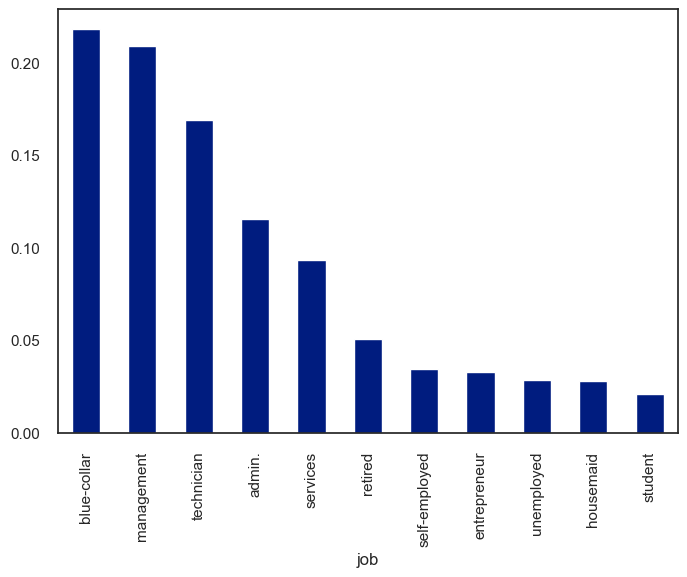

In [95]:
X_train["job"].value_counts(normalize=True).plot.bar()
plt.show()

In [91]:
# combining labels that are similar as done below

# X_train["job"].isin(["unemployed", "student", "retired"]).astype(int).value_counts(
#     normalize=True
# ).plot.bar()
# plt.show()

<Axes: xlabel='job_admin.,job_blue-collar,job_management,job_services,job_technician,job_infrequent_sklearn'>

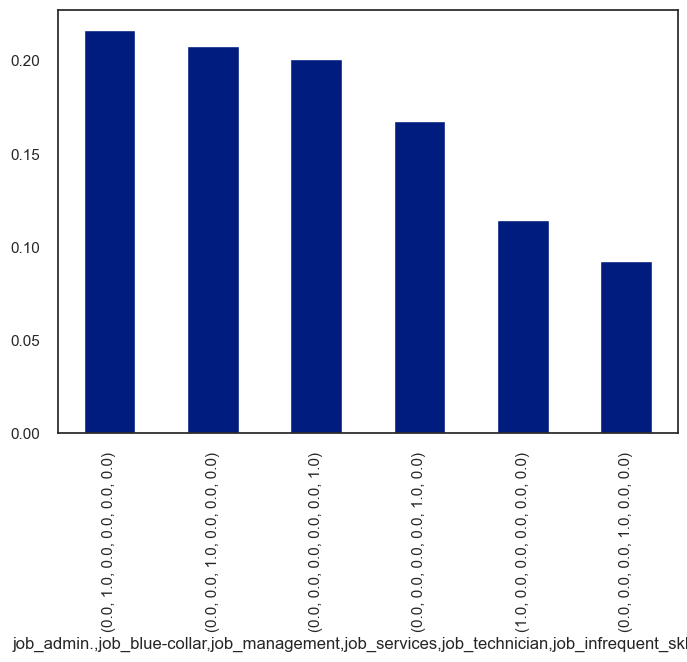

In [102]:
# encoding the top categories per variable

ohe_enc = OneHotEncoder(
    handle_unknown="infrequent_if_exist",  # unseen categories will be treated like the less frequent ones
    max_categories=6,  # the number of top categories
    sparse_output=False,  # necessary for set output pandas
)

ohe_enc.set_output(transform="pandas")

ohe_enc.fit(X_train[["job"]])

X_train_ohe = ohe_enc.transform(X_train[["job"]])

X_train_ohe.value_counts(normalize=True).plot.bar()

### Pipeline for feature engineering

This pipeline consist of imputation for missing values, one-hot encoding of categorical features, numeric variable transformation via Yeo-Johnson transformers, outlier handling using capping (using 98th percentile) and discritization; a technique also use to handle rare classes. 

Summary of steps:
1. Drop features: pdays, previous and education
2. missing data imputation for jobs ("most_frequent", and add_indicator for missing value), poutcome and contact ("constant", and fill_value="missing")
3. outlier removal for numeric variable "balance", "duration", and "campaign" using capping
4. power transformations using jeo-johnson transformer for "age", "balance", "duration", and "campaign"
5. discritizations of "age", "balance", "duration", and "campaign"
6. feature creations
7. encoding cat

In [279]:
### Pipeline for feature engineering

class CustomFeatureCreator(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Assume X is a DataFrame
        X = X.copy()

        X["day_of_week"] = X["day_of_week"].astype("float")
        X["day_of_month_sin"] = np.sin(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_of_month_cos"] = np.cos(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )

        X["day"] = X["day_of_week"].apply(lambda x: ((x - 1) % 7) + 1).astype(int)

        X["day_sin"] = np.sin(X["day"] / X["day"].max() * 2 * np.pi)
        X["day_cos"] = np.cos(X["day"] / X["day"].max() * 2 * np.pi)

        # X["is_weekend"] = X["day_of_week"].isin([6, 7]).astype(int)

        # Map each month to its respective quarter
        month_to_quarter = {
            "jan": "1st quarter",
            "feb": "1st quarter",
            "mar": "1st quarter",
            "apr": "2nd quarter",
            "may": "2nd quarter",
            "jun": "2nd quarter",
            "jul": "3rd quarter",
            "aug": "3rd quarter",
            "sep": "3rd quarter",
            "oct": "4th quarter",
            "nov": "4th quarter",
            "dec": "4th quarter",
        }

        X["quarter"] = X["month"].map(month_to_quarter)

        month_to_num = {
            "jan": 1,
            "feb": 2,
            "mar": 3,
            "apr": 4,
            "may": 5,
            "jun": 6,
            "jul": 7,
            "aug": 8,
            "sep": 9,
            "oct": 10,
            "nov": 11,
            "dec": 12,
        }

        X["month"] = X["month"].map(month_to_num)

        X["month_sin"] = np.sin(X["month"] / X["month"].max() * 2 * np.pi)
        X["month_cos"] = np.cos(X["month"] / X["month"].max() * 2 * np.pi)
        return X

col_transformer = ColumnTransformer(
    [
        # part 1
        (
            "dropped",
            "drop",
            ["pdays", "previous", "day_of_week", "month", "day", "educ"],
        ),
        # part 2
        (
            "imputer1",
            SimpleImputer(strategy="most_frequent", add_indicator=True),
            ["job"],
        ),
        (
            "imputer2",
            SimpleImputer(strategy="constant", fill_value="missing"),
            ["contact", "poutcome"],
        ),
        # part 3, outlier handling
        # part 4, power transformer. this will be droppped later
        (
            "transformer",
            PowerTransformer(method="yeo-johnson", standardize=False),
            ["age", "balance", "duration", "campaign"],
        ),
        # part 5, discritizations of the transformed numerical variables above.
        (
            "bin1",
            KBinsDiscretizer(
                n_bins=4,
                encode="ordinal",
                strategy="uniform",
                subsample=None,
            ),
            ["campaign"],
        ),
        (
            "bin2",
            KBinsDiscretizer(
                n_bins=5,
                encode="ordinal",
                strategy="quantile",
                subsample=None,
            ),
            ["balance", "duration", "age"],
        ),
        (
            "encJob",
            OneHotEncoder(
                handle_unknown="infrequent_if_exist",  # unseen categories will be treated like the less frequent ones
                max_categories=6,  # the number of top categories
                sparse_output=False,  # necessary for set output pandas
            ),
            ["job"],
        ),
        (
            "encoder",
            OneHotEncoder(sparse_output=False, handle_unknown="error"),
            [
                "loan",
                "default",
                "housing",
                "marital",
                "quarter",
                # "education",  #
            ],
        ),
    ],
    remainder="passthrough",
    verbose_feature_names_out=True,
).set_output(transform="pandas")


secondary_col_transformer = ColumnTransformer(
    transformers=[
        (
            "column_dropper",
            "drop",
            [
                "transformer__balance",
                "transformer__duration",
                "transformer__age",
                "transformer__campaign",
                "imputer1__job",
                # "imputer1__education",
            ],
        ),
        (
            "enc",
            OneHotEncoder(sparse_output=False, handle_unknown="error"),
            [
                "imputer1__missingindicator_job",
                # "imputer1__missingindicator_education",
                "imputer2__contact",
                "imputer2__poutcome",
            ],
        ),
        (
            "scale",
            StandardScaler(),
            [
                "remainder__day_of_month_sin",
                "remainder__day_of_month_cos",
                "remainder__day_sin",
                "remainder__day_cos",
                "remainder__month_sin",
                "remainder__month_cos",
            ],
        ),
    ],
    remainder="passthrough",
).set_output(transform="pandas")


capper = Winsorizer(
    variables=[
        "balance",
        "duration",
        "campaign",
    ],
    capping_method="quantiles",
    tail="both",
    fold=0.02,
)

final_pipeline = Pipeline(
    steps=[
        ("capping", capper),  # capping part 3
        ("feature_creation", CustomFeatureCreator()),  # create feature
        ("feature_transform", col_transformer),  # transform features
        (
            "preprocessor",
            secondary_col_transformer,
        ),  # drop some of the transformed features
    ]
)

final_pipeline.fit(X_train)
label_encoder = LabelEncoder().fit(y_train)

X_train_imp_num_cat = final_pipeline.transform(X_train)
y_train_transformed = label_encoder.transform(y_train)

X_test_imp_num_cat = final_pipeline.transform(X_test)
y_test_transformed = label_encoder.transform(y_test)

X_train_imp_num_cat.head()

,enc__imputer1__missingindicator_job_False,enc__imputer1__missingindicator_job_True,enc__imputer2__contact_cellular,enc__imputer2__contact_missing,enc__imputer2__contact_telephone,enc__imputer2__poutcome_failure,enc__imputer2__poutcome_missing,enc__imputer2__poutcome_other,enc__imputer2__poutcome_success,scale__remainder__day_of_month_sin,...,remainder__encoder__default_yes,remainder__encoder__housing_no,remainder__encoder__housing_yes,remainder__encoder__marital_divorced,remainder__encoder__marital_married,remainder__encoder__marital_single,remainder__encoder__quarter_1st quarter,remainder__encoder__quarter_2nd quarter,remainder__encoder__quarter_3rd quarter,remainder__encoder__quarter_4th quarter
24001,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.603224,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
43409,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.174447,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
20669,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.892320,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
18810,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.039238,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
23130,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.252923,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [280]:
col_transformer.get_feature_names_out()

array(['imputer1__job', 'imputer1__missingindicator_job',
       'imputer2__contact', 'imputer2__poutcome', 'transformer__age',
       'transformer__balance', 'transformer__duration',
       'transformer__campaign', 'bin1__campaign', 'bin2__balance',
       'bin2__duration', 'bin2__age', 'encJob__job_admin.',
       'encJob__job_blue-collar', 'encJob__job_management',
       'encJob__job_services', 'encJob__job_technician',
       'encJob__job_infrequent_sklearn', 'encoder__loan_no',
       'encoder__loan_yes', 'encoder__default_no', 'encoder__default_yes',
       'encoder__housing_no', 'encoder__housing_yes',
       'encoder__marital_divorced', 'encoder__marital_married',
       'encoder__marital_single', 'encoder__quarter_1st quarter',
       'encoder__quarter_2nd quarter', 'encoder__quarter_3rd quarter',
       'encoder__quarter_4th quarter', 'remainder__day_of_month_sin',
       'remainder__day_of_month_cos', 'remainder__day_sin',
       'remainder__day_cos', 'remainder__month_sin'

In [281]:
secondary_col_transformer.get_feature_names_out()

array(['enc__imputer1__missingindicator_job_False',
       'enc__imputer1__missingindicator_job_True',
       'enc__imputer2__contact_cellular',
       'enc__imputer2__contact_missing',
       'enc__imputer2__contact_telephone',
       'enc__imputer2__poutcome_failure',
       'enc__imputer2__poutcome_missing', 'enc__imputer2__poutcome_other',
       'enc__imputer2__poutcome_success',
       'scale__remainder__day_of_month_sin',
       'scale__remainder__day_of_month_cos', 'scale__remainder__day_sin',
       'scale__remainder__day_cos', 'scale__remainder__month_sin',
       'scale__remainder__month_cos', 'remainder__bin1__campaign',
       'remainder__bin2__balance', 'remainder__bin2__duration',
       'remainder__bin2__age', 'remainder__encJob__job_admin.',
       'remainder__encJob__job_blue-collar',
       'remainder__encJob__job_management',
       'remainder__encJob__job_services',
       'remainder__encJob__job_technician',
       'remainder__encJob__job_infrequent_sklearn',
    

In [282]:
X_test_imp_num_cat.head()

,enc__imputer1__missingindicator_job_False,enc__imputer1__missingindicator_job_True,enc__imputer2__contact_cellular,enc__imputer2__contact_missing,enc__imputer2__contact_telephone,enc__imputer2__poutcome_failure,enc__imputer2__poutcome_missing,enc__imputer2__poutcome_other,enc__imputer2__poutcome_success,scale__remainder__day_of_month_sin,...,remainder__encoder__default_yes,remainder__encoder__housing_no,remainder__encoder__housing_yes,remainder__encoder__marital_divorced,remainder__encoder__marital_married,remainder__encoder__marital_single,remainder__encoder__quarter_1st quarter,remainder__encoder__quarter_2nd quarter,remainder__encoder__quarter_3rd quarter,remainder__encoder__quarter_4th quarter
1392,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.389072,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
7518,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.327124,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
12007,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-1.170162,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
5536,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-1.467548,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
29816,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.997321,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0


In [283]:
# check to see if there are still missing values and categorical variables
X_train_imp_num_cat.select_dtypes(
    include=["object"]
).columns.to_list(), X_train_imp_num_cat.isnull().mean().any(), X_train_imp_num_cat.shape

([], False, (36168, 38))

In [284]:
X_test_imp_num_cat.select_dtypes(
    include=["object"]
).columns.to_list(), X_test_imp_num_cat.isnull().mean().any(), X_test_imp_num_cat.shape

([], False, (9043, 38))

Test performance of our features using a baseline model. Lets see if proper feature selection can improve performance

In [285]:
# Scorer for cross-validation: Area Under Precision-Recall Curve (AUPRC)
def auprc_score(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)


# create custom scorer
auprc = make_scorer(
    auprc_score,
    needs_proba=False,
    greater_is_better=True,
)

baseline_model = XGBClassifier(
    scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
    random_state=42,
)

# baseline_model = LogisticRegression(
#     random_state=42, max_iter=5000, class_weight="balanced"
# )


def evaluate_model(X_train, X_test, y_train, y_test, xgbc):

    xgbc.fit(X_train, y_train)

    print("Train set")
    pred = xgbc.predict_proba(X_train)
    print(f"XGBoost AUPRC: {auprc_score(y_train, pred[:, 1])}")

    print("Test set")
    pred = xgbc.predict_proba(X_test)
    print(f"XGBoost AUPRC: {auprc_score(y_test, pred[:, 1])}")


evaluate_model(
    X_train_imp_num_cat,
    X_test_imp_num_cat,
    y_train_transformed,
    y_test_transformed,
    baseline_model,
)

Train set
XGBoost AUPRC: 0.8263966446458932
Test set
XGBoost AUPRC: 0.559334041369592


## Feature Selection 

1. Correlation 
Discussed earlier in the work.


2. Using shuffling method

In [286]:
sel = SelectByShuffling(
    variables=None,  # automatically examine all numerical variables
    estimator=baseline_model,  # the ML model
    scoring="f1",  # the metric to evaluate
    threshold=None,  # the maximum performance drop allowed to select the feature
    cv=5,  # cross validation
    random_state=42,  # seed
)


sel.fit(X_train_imp_num_cat, y_train_transformed)

SelectByShuffling(cv=5,
                  estimator=XGBClassifier(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=None,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=42, ...),
                  random_state=42, scoring='f1')

In [287]:
# performance of model trained with all features

sel.initial_model_performance_

0.5473037992492744

<Axes: >

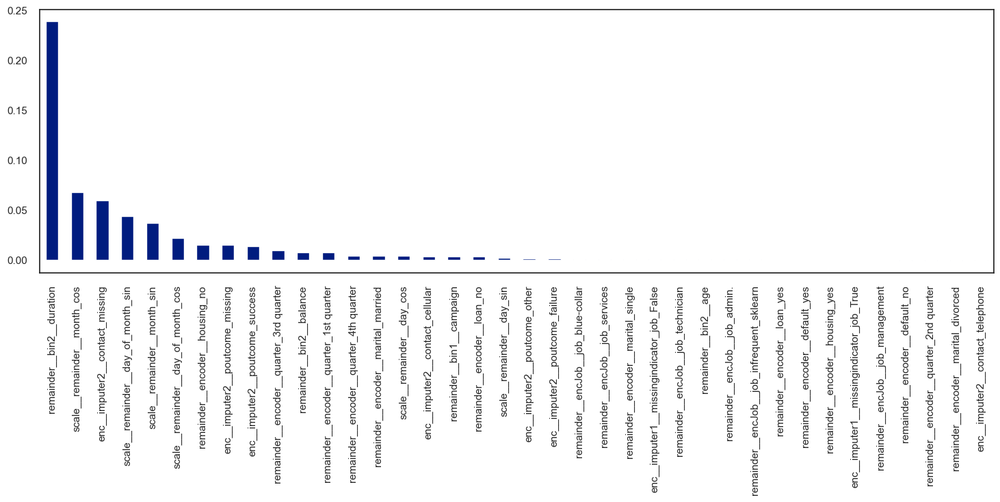

In [288]:
# drop in performance caused by shuffling the feature

# bar plot of the performance drops

pd.Series(sel.performance_drifts_).sort_values(ascending=False).plot.bar(
    figsize=(18, 5)
)

In [289]:
# features that will be removed

len(sel.features_to_drop_)

30

In [290]:
X_train_best = sel.transform(X_train_imp_num_cat)
X_test_best = sel.transform(X_test_imp_num_cat)

X_train_best.shape, X_test_best.shape

((36168, 8), (9043, 8))

In [291]:
# outcome for logistic regression
X_train_best.columns

Index(['enc__imputer2__contact_missing', 'enc__imputer2__poutcome_missing',
       'scale__remainder__day_of_month_sin',
       'scale__remainder__day_of_month_cos', 'scale__remainder__month_sin',
       'scale__remainder__month_cos', 'remainder__bin2__duration',
       'remainder__encoder__housing_no'],
      dtype='object')

In [293]:
# Now let's build a random forests only with the selected features

baseline_model.fit(X_train_best, y_train_transformed)

# print roc-auc in train_best and testing sets
print(
    "train_best auc score: ",
    f1_score(y_train_transformed, baseline_model.predict(X_train_best)),
)
print(
    "test auc score: ",
    f1_score(y_test_transformed, baseline_model.predict(X_test_best)),
)

train_best auc score:  0.5588811188811189
test auc score:  0.5127212389380531


### 3. Recursive feature elimination

In [294]:
sel = RecursiveFeatureElimination(
    variables=None,  # automatically evaluate all numerical variables
    estimator=baseline_model,  # the ML model
    scoring="f1",  # the metric we want to evalute
    threshold=0.0005,  # the maximum performance drop allowed to remove a feature
    cv=2,  # cross-validation
)

sel.fit(X_train_imp_num_cat, y_train_transformed)

RecursiveFeatureElimination(cv=2,
                            estimator=XGBClassifier(base_score=None,
                                                    booster=None,
                                                    callbacks=None,
                                                    colsample_bylevel=None,
                                                    colsample_bynode=None,
                                                    colsample_bytree=None,
                                                    device=None,
                                                    early_stopping_rounds=None,
                                                    enable_categorical=False,
                                                    eval_metric=None,
                                                    feature_types=None,
                                                    gamma=None,
                                                    grow_policy=None,
                                                    importance_type=None,
                                                    interaction_constraints=None,
                                                    learning_rate=None,
                                                    max_bin=None,
                                                    max_cat_threshold=None,
                                                    max_cat_to_onehot=None,
                                                    max_delta_step=None,
                                                    max_depth=None,
                                                    max_leaves=None,
                                                    min_child_weight=None,
                                                    missing=nan,
                                                    monotone_constraints=None,
                                                    multi_strategy=None,
                                                    n_estimators=None,
                                                    n_jobs=None,
                                                    num_parallel_tree=None,
                                                    random_state=42, ...),
                            scoring='f1', threshold=0.0005)

In [295]:
sel.initial_model_performance_

0.5398267026693044

In [296]:
len(sel.features_to_drop_), sel.features_to_drop_

(5,
 ['enc__imputer1__missingindicator_job_False',
  'enc__imputer1__missingindicator_job_True',
  'remainder__encoder__loan_yes',
  'remainder__encoder__default_yes',
  'remainder__encoder__housing_yes'])

<Axes: >

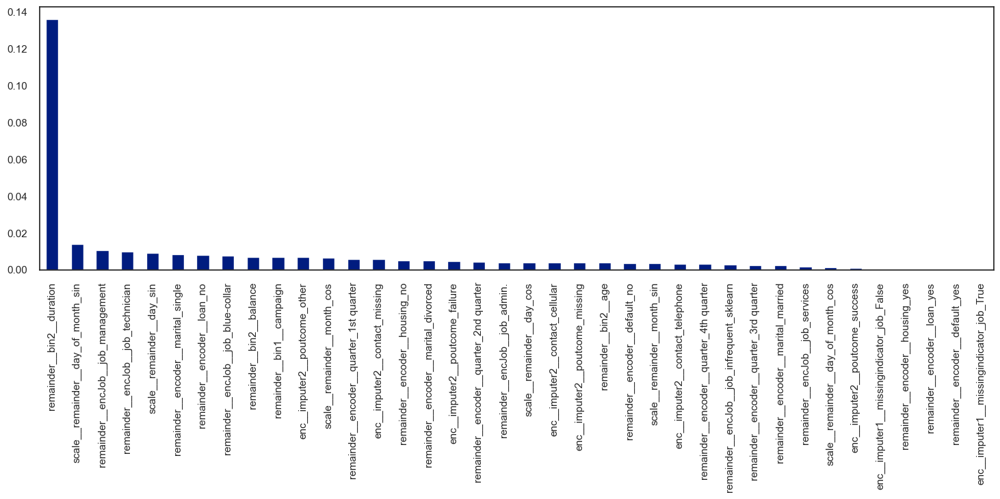

In [297]:
# drop in performance caused by shuffling the feature

# bar plot of the performance drops

pd.Series(sel.performance_drifts_).sort_values(ascending=False).plot.bar(
    figsize=(18, 5)
)

In [298]:
X_train_best = sel.transform(X_train_imp_num_cat)
X_test_best = sel.transform(X_test_imp_num_cat)

X_train_best.shape, X_test_best.shape

((36168, 33), (9043, 33))

In [224]:
# outcome for logistic regression
X_train_best.columns

Index(['enc__imputer2__contact_cellular', 'enc__imputer2__contact_missing',
       'enc__imputer2__poutcome_failure', 'enc__imputer2__poutcome_missing',
       'enc__imputer2__poutcome_success', 'scale__remainder__day_of_month_cos',
       'scale__remainder__day_sin', 'scale__remainder__day_cos',
       'scale__remainder__month_sin', 'scale__remainder__month_cos',
       'remainder__bin2__balance', 'remainder__bin2__duration',
       'remainder__encJob__job_blue-collar', 'remainder__encJob__job_services',
       'remainder__encJob__job_infrequent_sklearn',
       'remainder__encoder__loan_yes', 'remainder__encoder__default_no',
       'remainder__encoder__housing_yes',
       'remainder__encoder__marital_married',
       'remainder__encoder__quarter_2nd quarter',
       'remainder__encoder__quarter_3rd quarter'],
      dtype='object')

In [299]:
baseline_model.fit(X_train_best, y_train_transformed)

# print roc-auc in train_best and testing sets
print(
    "train_best auc score: ",
    f1_score(y_train_transformed, baseline_model.predict(X_train_best)),
)
print(
    "test auc score: ",
    f1_score(y_test_transformed, baseline_model.predict(X_test_best)),
)

train_best auc score:  0.6552547770700637
test auc score:  0.5388535031847134


### 4. Recursive feature addition

In [300]:
sel = RecursiveFeatureAddition(
    variables=None,  # automatically evaluate all numerical variables
    estimator=baseline_model,  # the ML model
    scoring="f1",  # the metric we want to evalute
    threshold=0.0005,  # the maximum performance drop allowed to remove a feature
    cv=2,  # cross-validation
)

sel.fit(X_train_imp_num_cat, y_train_transformed)

RecursiveFeatureAddition(cv=2,
                         estimator=XGBClassifier(base_score=None, booster=None,
                                                 callbacks=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytree=None,
                                                 device=None,
                                                 early_stopping_rounds=None,
                                                 enable_categorical=False,
                                                 eval_metric=None,
                                                 feature_types=None, gamma=None,
                                                 grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=None,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 multi_strategy=None,
                                                 n_estimators=None, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 random_state=42, ...),
                         scoring='f1', threshold=0.0005)

In [301]:
sel.initial_model_performance_

0.5398267026693044

<Axes: >

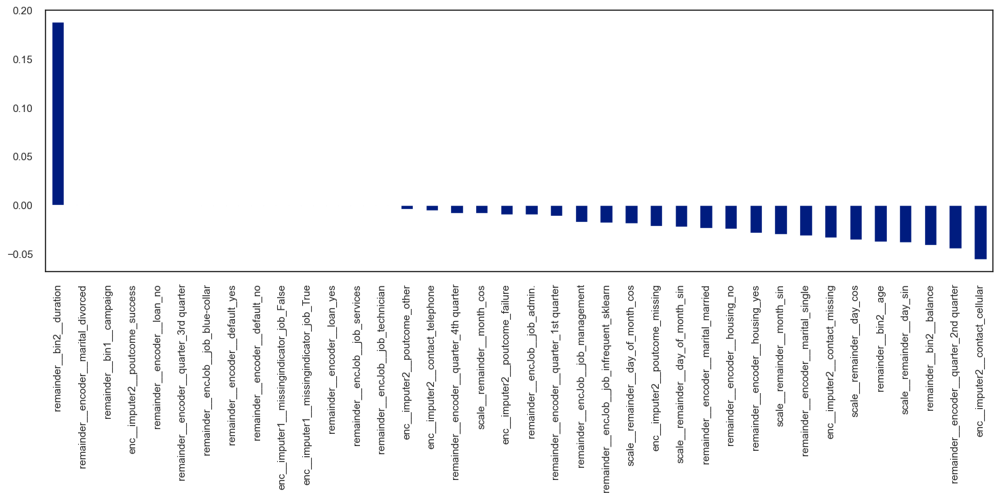

In [302]:
# drop in performance caused by shuffling the feature

# bar plot of the performance drops

pd.Series(sel.performance_drifts_).sort_values(ascending=False).plot.bar(
    figsize=(18, 5)
)

In [303]:
# features that will be removed

len(sel.features_to_drop_), sel.features_to_drop_

(35,
 ['enc__imputer1__missingindicator_job_False',
  'enc__imputer1__missingindicator_job_True',
  'enc__imputer2__contact_cellular',
  'enc__imputer2__contact_missing',
  'enc__imputer2__contact_telephone',
  'enc__imputer2__poutcome_failure',
  'enc__imputer2__poutcome_missing',
  'enc__imputer2__poutcome_other',
  'scale__remainder__day_of_month_sin',
  'scale__remainder__day_of_month_cos',
  'scale__remainder__day_sin',
  'scale__remainder__day_cos',
  'scale__remainder__month_sin',
  'scale__remainder__month_cos',
  'remainder__bin1__campaign',
  'remainder__bin2__balance',
  'remainder__bin2__age',
  'remainder__encJob__job_admin.',
  'remainder__encJob__job_blue-collar',
  'remainder__encJob__job_management',
  'remainder__encJob__job_services',
  'remainder__encJob__job_technician',
  'remainder__encJob__job_infrequent_sklearn',
  'remainder__encoder__loan_no',
  'remainder__encoder__loan_yes',
  'remainder__encoder__default_no',
  'remainder__encoder__default_yes',
  'remaind

In [304]:
X_train_best = sel.transform(X_train_imp_num_cat)
X_test_best = sel.transform(X_test_imp_num_cat)

X_train_best.shape, X_test_best.shape

((36168, 3), (9043, 3))

In [305]:
# outcome for logistic regression
X_train_best.columns

Index(['enc__imputer2__poutcome_success', 'remainder__bin2__duration',
       'remainder__encoder__marital_divorced'],
      dtype='object')

In [306]:
baseline_model.fit(X_train_best, y_train_transformed)

# print roc-auc in train_best and testing sets
print(
    "train_best auc score: ",
    f1_score(y_train_transformed, baseline_model.predict(X_train_best)),
)
print(
    "test auc score: ",
    f1_score(y_test_transformed, baseline_model.predict(X_test_best)),
)

train_best auc score:  0.4753472504264479
test auc score:  0.4700193423597679


#### 6. Removing constant and quasi-constant and duplicated features


In [307]:
sel = DropConstantFeatures(tol=0.998, variables=None, missing_values="raise")

sel.fit(X_train_imp_num_cat)

DropConstantFeatures(tol=0.998)

In [308]:
sel.features_to_drop_

[]

In [309]:
sel = DropDuplicateFeatures(variables=None, missing_values="raise")
sel.fit(X_train_imp_num_cat)

DropDuplicateFeatures(missing_values='raise')

In [310]:
sel.features_to_drop_

set()

#### 7. Correlation
Here, I tried different feature selection techniques and the best performing one is the smartcorrelation selection using vaiance (this is model agnostic as well).

In [311]:
sel = DropCorrelatedFeatures(threshold=0.6, method="pearson", missing_values="ignore")

sel.fit(X_train_imp_num_cat)

DropCorrelatedFeatures(threshold=0.6)

In [312]:
sel.correlated_feature_sets_

[{'enc__imputer1__missingindicator_job_False',
  'enc__imputer1__missingindicator_job_True'},
 {'enc__imputer2__contact_cellular', 'enc__imputer2__contact_missing'},
 {'enc__imputer2__poutcome_failure', 'enc__imputer2__poutcome_missing'},
 {'remainder__encoder__default_no', 'remainder__encoder__default_yes'},
 {'remainder__encoder__housing_no', 'remainder__encoder__housing_yes'},
 {'remainder__encoder__loan_no', 'remainder__encoder__loan_yes'},
 {'remainder__encoder__marital_married', 'remainder__encoder__marital_single'},
 {'remainder__encoder__quarter_2nd quarter',
  'remainder__encoder__quarter_3rd quarter',
  'scale__remainder__month_sin'},
 {'remainder__encoder__quarter_4th quarter', 'scale__remainder__month_cos'}]

In [313]:
len(sel.features_to_drop_), sel.features_to_drop_

(10,
 ['enc__imputer1__missingindicator_job_True',
  'enc__imputer2__contact_missing',
  'enc__imputer2__poutcome_missing',
  'remainder__encoder__default_yes',
  'remainder__encoder__housing_yes',
  'remainder__encoder__loan_yes',
  'remainder__encoder__marital_single',
  'remainder__encoder__quarter_3rd quarter',
  'scale__remainder__month_sin',
  'scale__remainder__month_cos'])

In [241]:
# log_reg_model = LogisticRegression(
#     random_state=42, max_iter=1000, class_weight="balanced"
# )
log_reg_model = XGBClassifier(random_state=42, n_jobs=4)

# correlation selector
sel = SmartCorrelatedSelection(
    variables=None,  # if none, selector examines all numerical variables
    method="pearson",
    threshold=0.5,
    missing_values="raise",
    selection_method="model_performance",
    estimator=log_reg_model,
    scoring="f1",
    cv=3,
)
sel.fit(X_train_imp_num_cat, y_train_transformed)

SmartCorrelatedSelection(estimator=XGBClassifier(base_score=None, booster=None,
                                                 callbacks=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytree=None,
                                                 device=None,
                                                 early_stopping_rounds=None,
                                                 enable_categorical=False,
                                                 eval_metric=None,
                                                 feature_types=None, gamma=None,
                                                 grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rat...e,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 multi_strategy=None,
                                                 n_estimators=None, n_jobs=4,
                                                 num_parallel_tree=None,
                                                 random_state=42, ...),
                         missing_values='raise', scoring='f1',
                         selection_method='model_performance', threshold=0.5)

In [242]:
sel.correlated_feature_sets_

[{'enc__imputer1__missingindicator_job_False',
  'enc__imputer1__missingindicator_job_True'},
 {'enc__imputer2__contact_cellular',
  'enc__imputer2__contact_missing',
  'remainder__encoder__quarter_2nd quarter'},
 {'enc__imputer2__poutcome_failure', 'enc__imputer2__poutcome_missing'},
 {'remainder__encoder__default_no', 'remainder__encoder__default_yes'},
 {'remainder__encoder__housing_no', 'remainder__encoder__housing_yes'},
 {'remainder__encoder__loan_no', 'remainder__encoder__loan_yes'},
 {'remainder__encoder__marital_married', 'remainder__encoder__marital_single'},
 {'remainder__encoder__quarter_1st quarter', 'scale__remainder__month_cos'},
 {'remainder__encoder__quarter_3rd quarter', 'scale__remainder__month_sin'}]

In [314]:
len(sel.features_to_drop_), sel.features_to_drop_

(10,
 ['enc__imputer1__missingindicator_job_True',
  'enc__imputer2__contact_missing',
  'enc__imputer2__poutcome_missing',
  'remainder__encoder__default_yes',
  'remainder__encoder__housing_yes',
  'remainder__encoder__loan_yes',
  'remainder__encoder__marital_single',
  'remainder__encoder__quarter_3rd quarter',
  'scale__remainder__month_sin',
  'scale__remainder__month_cos'])

In [315]:
sel = SmartCorrelatedSelection(
    selection_method="variance",
    variables=None,  # if none, selector examines all numerical variables
    method="pearson",
    threshold=0.45,
    scoring="f1",
    cv=3,
    missing_values="raise",
)
sel.fit(X_train_imp_num_cat, y_train_transformed)

SmartCorrelatedSelection(missing_values='raise', scoring='f1',
                         selection_method='variance', threshold=0.45)

In [316]:
sel.correlated_feature_sets_

[{'remainder__bin2__age', 'remainder__encoder__marital_single'},
 {'remainder__encoder__quarter_1st quarter',
  'remainder__encoder__quarter_2nd quarter',
  'remainder__encoder__quarter_4th quarter',
  'scale__remainder__month_cos'},
 {'remainder__encoder__quarter_3rd quarter', 'scale__remainder__month_sin'},
 {'remainder__encoder__housing_no', 'remainder__encoder__housing_yes'},
 {'enc__imputer2__contact_cellular', 'enc__imputer2__contact_missing'},
 {'enc__imputer2__poutcome_failure', 'enc__imputer2__poutcome_missing'},
 {'remainder__encoder__loan_no', 'remainder__encoder__loan_yes'},
 {'remainder__encoder__default_no', 'remainder__encoder__default_yes'},
 {'enc__imputer1__missingindicator_job_False',
  'enc__imputer1__missingindicator_job_True'}]

In [317]:
len(sel.features_to_drop_), sel.features_to_drop_

(11,
 ['remainder__encoder__marital_single',
  'remainder__encoder__quarter_2nd quarter',
  'remainder__encoder__quarter_4th quarter',
  'remainder__encoder__quarter_1st quarter',
  'remainder__encoder__quarter_3rd quarter',
  'remainder__encoder__housing_yes',
  'enc__imputer2__contact_missing',
  'enc__imputer2__poutcome_failure',
  'remainder__encoder__loan_yes',
  'remainder__encoder__default_no',
  'enc__imputer1__missingindicator_job_False'])

In [320]:
pipe = Pipeline(
    [
        ("constant", DropConstantFeatures(tol=0.998)),
        ("duplicated", DropDuplicateFeatures()),
        (
            "cor",
            SmartCorrelatedSelection(
                selection_method="variance",
                variables=None,  # if none, selector examines all numerical variables
                method="pearson",
                threshold=0.6,
                scoring="f1",
                cv=3,
                missing_values="raise",
            ),
        ),
    ]
)

pipe.fit(X_train_imp_num_cat, y_train_transformed)

X_train_best = pipe.transform(X_train_imp_num_cat)
X_test_best = pipe.transform(X_test_imp_num_cat)

X_train_best.shape, X_test_best.shape

((36168, 28), (9043, 28))

In [321]:
baseline_model.fit(X_train_best, y_train_transformed)

# print roc-auc in train_best and testing sets
print(
    "train_best auc score: ",
    f1_score(y_train_transformed, baseline_model.predict(X_train_best)),
)
print(
    "test auc score: ",
    f1_score(y_test_transformed, baseline_model.predict(X_test_best)),
)

train_best auc score:  0.6563171721996657
test auc score:  0.5383165829145728


### Pipeline for feature engineering and feature selection


In [332]:

class CustomFeatureCreator(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Assume X is a DataFrame
        X = X.copy()

        X["day_of_week"] = X["day_of_week"].astype("float")
        X["day_of_month_sin"] = np.sin(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_of_month_cos"] = np.cos(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )

        X["day"] = X["day_of_week"].apply(lambda x: ((x - 1) % 7) + 1).astype(int)

        X["day_sin"] = np.sin(X["day"] / X["day"].max() * 2 * np.pi)
        X["day_cos"] = np.cos(X["day"] / X["day"].max() * 2 * np.pi)

        # X["is_weekend"] = X["day_of_week"].isin([6, 7]).astype(int)

        # Map each month to its respective quarter
        month_to_quarter = {
            "jan": "1st quarter",
            "feb": "1st quarter",
            "mar": "1st quarter",
            "apr": "2nd quarter",
            "may": "2nd quarter",
            "jun": "2nd quarter",
            "jul": "3rd quarter",
            "aug": "3rd quarter",
            "sep": "3rd quarter",
            "oct": "4th quarter",
            "nov": "4th quarter",
            "dec": "4th quarter",
        }

        X["quarter"] = X["month"].map(month_to_quarter)

        month_to_num = {
            "jan": 1,
            "feb": 2,
            "mar": 3,
            "apr": 4,
            "may": 5,
            "jun": 6,
            "jul": 7,
            "aug": 8,
            "sep": 9,
            "oct": 10,
            "nov": 11,
            "dec": 12,
        }

        X["month"] = X["month"].map(month_to_num)

        X["month_sin"] = np.sin(X["month"] / X["month"].max() * 2 * np.pi)
        X["month_cos"] = np.cos(X["month"] / X["month"].max() * 2 * np.pi)
        return X

col_transformer = ColumnTransformer(
    [
        # part 1
        (
            "dropped",
            "drop",
            ["pdays", "previous", "day_of_week", "month", "day", "education"],
        ),
        # part 2
        (
            "imputer1",
            SimpleImputer(strategy="most_frequent", add_indicator=True),
            ["job"],
        ),
        (
            "imputer2",
            SimpleImputer(strategy="constant", fill_value="missing"),
            ["contact", "poutcome"],
        ),
        # part 3, outlier handling
        # part 4, power transformer. this will be droppped later
        (
            "transformer",
            PowerTransformer(method="yeo-johnson", standardize=False),
            ["age", "balance", "duration", "campaign"],
        ),
        # part 5, discritizations of the transformed numerical variables above.
        (
            "bin1",
            KBinsDiscretizer(
                n_bins=4,
                encode="ordinal",
                strategy="uniform",
                subsample=None,
            ),
            ["campaign"],
        ),
        (
            "bin2",
            KBinsDiscretizer(
                n_bins=5,
                encode="ordinal",
                strategy="quantile",
                subsample=None,
            ),
            ["balance", "duration", "age"],
        ),
        (
            "encJob",
            OneHotEncoder(
                handle_unknown="infrequent_if_exist",  # unseen categories will be treated like the less frequent ones
                max_categories=6,  # the number of top categories
                sparse_output=False,  # necessary for set output pandas
            ),
            ["job"],
        ),
        (
            "encoder",
            OneHotEncoder(sparse_output=False, handle_unknown="error"),
            [
                "loan",
                "default",
                "housing",
                "marital",
                "quarter",
                # "education",  #
            ],
        ),
    ],
    remainder="passthrough",
    verbose_feature_names_out=True,
).set_output(transform="pandas")


secondary_col_transformer = ColumnTransformer(
    transformers=[
        (
            "column_dropper",
            "drop",
            [
                "transformer__balance",
                "transformer__duration",
                "transformer__age",
                "transformer__campaign",
                "imputer1__job",
                # "imputer1__education",
            ],
        ),
        (
            "enc",
            OneHotEncoder(sparse_output=False, handle_unknown="error"),
            [
                "imputer1__missingindicator_job",
                # "imputer1__missingindicator_education",
                "imputer2__contact",
                "imputer2__poutcome",
            ],
        ),
        (
            "scale",
            StandardScaler(),
            [
                "remainder__day_of_month_sin",
                "remainder__day_of_month_cos",
                "remainder__day_sin",
                "remainder__day_cos",
                "remainder__month_sin",
                "remainder__month_cos",
            ],
        ),
    ],
    remainder="passthrough",
).set_output(transform="pandas")


capper = Winsorizer(
    variables=[
        "balance",
        "duration",
        "campaign",
    ],
    capping_method="quantiles",
    tail="both",
    fold=0.02,
)

select_transformer = SmartCorrelatedSelection(
    selection_method="variance",
    method="pearson",
    threshold=0.4,  # use to be 0.8
    scoring="f1",
    cv=5,
    missing_values="raise",
    variables=None,
)


feature_select = Pipeline(
    [
        ("constant", DropConstantFeatures(tol=0.998)),
        ("duplicated", DropDuplicateFeatures()),
        (
            "correlation",
            select_transformer,
        ),
    ]
)


final_pipeline = Pipeline(
    steps=[
        ("capping", capper),  # capping part 3
        ("feature_creation", CustomFeatureCreator()),  # create feature
        ("feature_transform", col_transformer),  # transform features
        (
            "preprocessor",
            secondary_col_transformer,
        ),  # drop some of the transformed features
        ("feature_select", feature_select),
    ]
)

final_pipeline.fit(X_train)
label_encoder = LabelEncoder().fit(y_train)

X_train_imp_num_cat = final_pipeline.transform(X_train)
y_train_transformed = label_encoder.transform(y_train)

X_test_imp_num_cat = final_pipeline.transform(X_test)
y_test_transformed = label_encoder.transform(y_test)

X_train_imp_num_cat.head()

,enc__imputer1__missingindicator_job_True,enc__imputer2__contact_cellular,enc__imputer2__contact_telephone,enc__imputer2__poutcome_missing,enc__imputer2__poutcome_success,scale__remainder__day_of_month_sin,scale__remainder__day_of_month_cos,scale__remainder__day_sin,scale__remainder__day_cos,scale__remainder__month_sin,...,remainder__encJob__job_admin.,remainder__encJob__job_blue-collar,remainder__encJob__job_management,remainder__encJob__job_services,remainder__encJob__job_technician,remainder__encJob__job_infrequent_sklearn,remainder__encoder__loan_no,remainder__encoder__default_yes,remainder__encoder__housing_no,remainder__encoder__marital_married
24001,0.0,0.0,1.0,1.0,0.0,-0.603224,1.449787,1.121425,0.777704,-1.446393,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
43409,0.0,1.0,0.0,0.0,0.0,1.174447,0.897820,-1.341127,-0.438423,1.380273,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
20669,0.0,1.0,0.0,1.0,0.0,0.892320,-0.924721,-1.341127,-0.438423,-1.446393,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
18810,0.0,0.0,1.0,1.0,0.0,-0.039238,1.564487,0.633686,-1.413681,-0.849048,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0
23130,0.0,1.0,0.0,1.0,0.0,-1.252923,0.897820,-1.341127,-0.438423,-1.446393,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0


In [333]:
evaluate_model(
    X_train_imp_num_cat,
    X_test_imp_num_cat,
    y_train_transformed,
    y_test_transformed,
    baseline_model,
)

Train set
XGBoost AUPRC: 0.8236433962087226
Test set
XGBoost AUPRC: 0.5561886608375469


In [334]:
X_train_imp_num_cat.shape

(36168, 25)

# Evaluation metrics

Here, I chose the area under the precision-recall curve because it is a threshold independent metric and robust to imbalance dataset. I used a f1-score above because it balances the precision and recall scores which is also a good metric for evaluating model performance on an imbalance dataset.

In [340]:
baseline_model.fit(X_train_imp_num_cat, y_train_transformed)

y_test_pred = baseline_model.predict_proba(X_test_imp_num_cat)[:, 1]

y_test_pred_ = baseline_model.predict(X_test_imp_num_cat)

precision, recall, thresholds = precision_recall_curve(y_test_transformed, y_test_pred)

auc_logit = auc(recall, precision)
print("Area under PR Curve XGBoost: ", auc_logit)

# print("F1 Score: ", f1_score(y_test_transformed, y_test_pred))

Area under PR Curve XGBoost:  0.5561886608375469


Below, I show two ways to visualize the metrics using sklearn and Yellowbrick

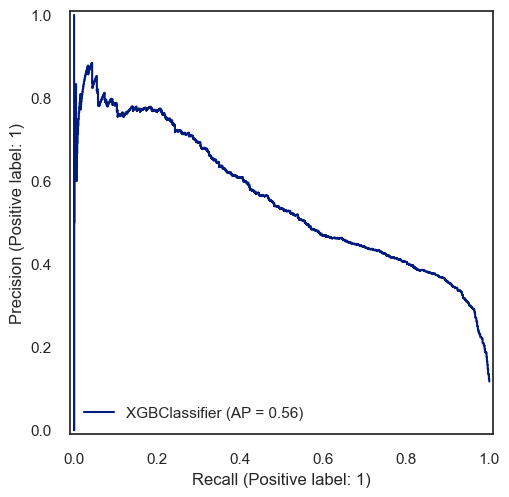

In [337]:
logit_disp = PrecisionRecallDisplay.from_estimator(
    baseline_model, X_test_imp_num_cat, y_test_transformed
)

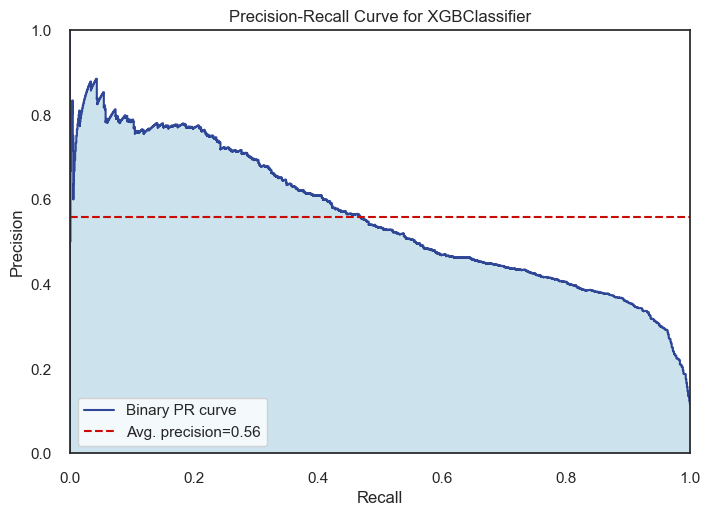

<Axes: title={'center': 'Precision-Recall Curve for XGBClassifier'}, xlabel='Recall', ylabel='Precision'>

In [338]:
visualizer = PrecisionRecallCurve(baseline_model, classes=[0, 1])

visualizer.fit(
    X_train_imp_num_cat, y_train_transformed
)  # Fit the training data to the visualizer
visualizer.score(
    X_test_imp_num_cat, y_test_transformed
)  # Evaluate the model on the test data
visualizer.show()

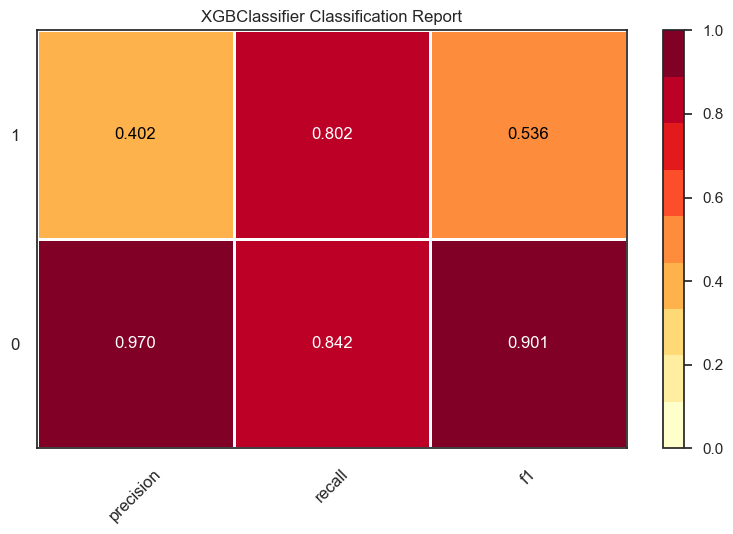

<Axes: title={'center': 'XGBClassifier Classification Report'}>

In [339]:
from yellowbrick.classifier import (
    ClassificationReport,
    DiscriminationThreshold,
)

visualizer = ClassificationReport(baseline_model)

visualizer.fit(
    X_train_imp_num_cat, y_train_transformed
)  # Fit the training data to the visualizer
visualizer.score(
    X_test_imp_num_cat, y_test_transformed
)  # Evaluate the model on the test data
visualizer.show()

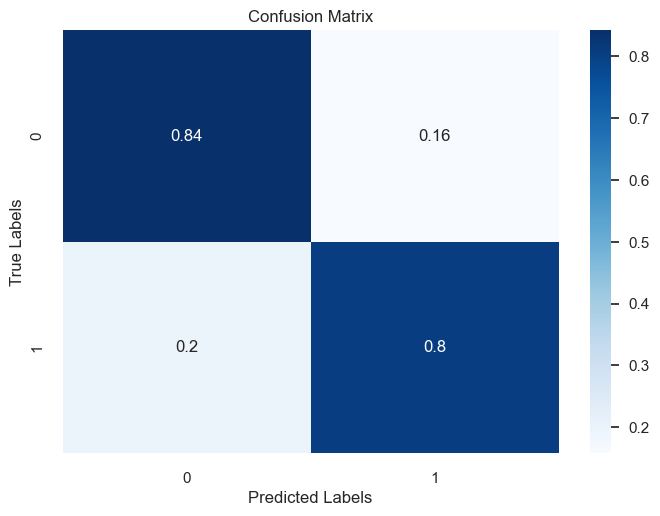

In [341]:
cm = confusion_matrix(y_test_transformed, y_test_pred_, labels=[0, 1], normalize="true")

sns.heatmap(
    cm, annot=True, cmap="Blues", xticklabels=["0", "1"], yticklabels=["0", "1"]
)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Below, I show what threshold gives the best metric for f1 score

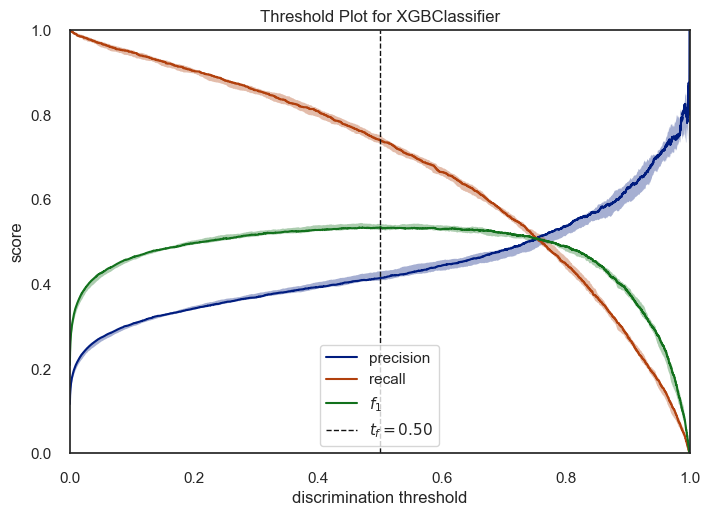

<Axes: title={'center': 'Threshold Plot for XGBClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [342]:
visualizer = DiscriminationThreshold(
    baseline_model,
    n_trials=5,
    cv=0.5,
    argmax="fscore",
    random_state=0,
    is_fitted="auto",
    exclude="queue_rate",
)

visualizer.fit(
    X_train_imp_num_cat, y_train_transformed
)  # Fit the training data to the visualizer
visualizer.score(
    X_test_imp_num_cat, y_test_transformed
)  # Evaluate the model on the test data
visualizer.show()

## Modeling: Model Selection Using KFold Cross-Validation

There other validation methods like leave-one-out cross validation (LOOCV), leave-pout cross validation (LPOCV) and repeated kfold cross validation. The model with the highest cross validation score - which in this work is the area under the precision-recall curve - is the best model. XGBoost is the best model as it has the highest out-box performance. I used stratified split to ensure equal representation of the different classes in the different folds as the data is imbalance.Because of the imbalannce nature of the data I used a cost-sensitive learning and ensemble methods

In [343]:
models = {
    "Naive Bayes": GaussianNB(),
    "Logistic Regression": LogisticRegression(
        class_weight="balanced", solver="saga", max_iter=1000, random_state=42
    ),  # apply cost sensitive learning using class weight which can be fine-tuned later
    "Decision Tree": DecisionTreeClassifier(class_weight="balanced", random_state=42),
    "Random Forest": RandomForestClassifier(  # bagging algorithm, without resampling
        class_weight="balanced", random_state=42, n_jobs=-1
    ),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(
        scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
        random_state=42,
    ),  # XGBoost handles imbalance by scale_pos_weight
    "Extra Trees": ExtraTreesClassifier(class_weight="balanced", random_state=42),
    "AdaBoost": AdaBoostClassifier(
        algorithm="SAMME"
    ),  # boosting algorithm, without resampling
    "BaggingClassifier": BaggingClassifier(  # bags any algorithm we want
        estimator=ExtraTreeClassifier(random_state=42),
        n_estimators=100,
    ),
    # "KNN": KNeighborsClassifier(n_jobs=-1),
    # "SVM": SVC(random_state=42),
    # bagging of Logistic regression, with resampling
    "balancedbagging": BalancedBaggingClassifier(
        estimator=LogisticRegression(random_state=42, max_iter=1000, solver="saga"),
        n_estimators=20,
        max_samples=1.0,  # The number of samples to draw from X to train each base estimator
        max_features=1.0,  # The number of features to draw from X to train each base estimator
        bootstrap=True,
        bootstrap_features=False,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
    # boosting + undersampling
    "rusboost": RUSBoostClassifier(
        estimator=None,
        n_estimators=20,
        learning_rate=1.0,
        sampling_strategy="auto",
        random_state=2909,
    ),
    # bagging + boosting + under-sammpling
    "easyEnsemble": EasyEnsembleClassifier(
        n_estimators=20,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
    # balanced random forests (bagging)
    "balancedRF": BalancedRandomForestClassifier(
        n_estimators=20,
        criterion="gini",
        max_depth=3,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
}


# Scorer for cross-validation: Area Under Precision-Recall Curve (AUPRC)
def auprc_score(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)


# create custom scorer
auprc = make_scorer(
    auprc_score,
    needs_proba=False,
    greater_is_better=True,
)

# Perform cross-validation and store results
results = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    scores = cross_val_score(
        model,
        X_train_imp_num_cat,
        y_train_transformed,
        cv=skf,
        scoring=auprc,
    )
    results[name] = np.mean(scores)
    print(f"{name}: Mean AUPRC = {results[name]:.4f}")

# Comparing models
best_model = max(results, key=results.get)
print(
    f"Best model based on AUPRC: {best_model} with an AUPRC of {results[best_model]:.4f}"
)

Naive Bayes: Mean AUPRC = 0.4556
Logistic Regression: Mean AUPRC = 0.5788
Decision Tree: Mean AUPRC = 0.4522
Random Forest: Mean AUPRC = 0.4822
Gradient Boosting: Mean AUPRC = 0.5274
XGBoost: Mean AUPRC = 0.6166
Extra Trees: Mean AUPRC = 0.4792
AdaBoost: Mean AUPRC = 0.4660
BaggingClassifier: Mean AUPRC = 0.4824
balancedbagging: Mean AUPRC = 0.5784
rusboost: Mean AUPRC = 0.5791
easyEnsemble: Mean AUPRC = 0.5861
balancedRF: Mean AUPRC = 0.5876
Best model based on AUPRC: XGBoost with an AUPRC of 0.6166


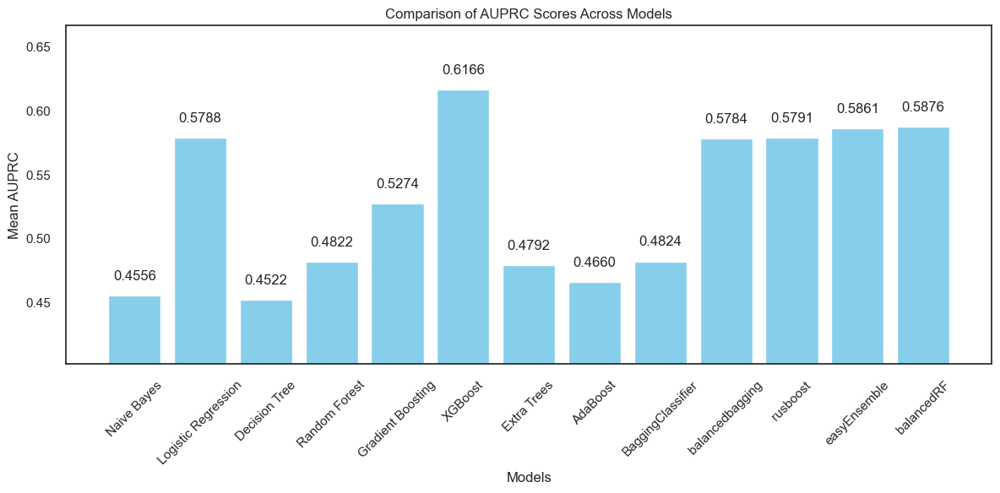

In [344]:
# Names of the models
model_names = list(results.keys())
# AUPRC scores
auprc_scores = [results[name] for name in model_names]

# Creating the bar plot
plt.figure(figsize=(12, 6))
plt.bar(model_names, auprc_scores, color="skyblue")
plt.xlabel("Models")
plt.ylabel("Mean AUPRC")
plt.title("Comparison of AUPRC Scores Across Models")
plt.xticks(rotation=45)
plt.ylim(
    [min(auprc_scores) - 0.05, max(auprc_scores) + 0.05]
)  # Set y-axis limits to give some padding

# Adding the score above each bar
for i, v in enumerate(auprc_scores):
    plt.text(i, v + 0.01, f"{v:.4f}", ha="center", va="bottom")

plt.tight_layout()
plt.show()

The best model is the XGBoost with a cross-validation score of $0.65$ and we continue to build the final model.

Here we train the XGBoost model over different iterations to study the effect on the generalistion and training metrics

### **Estimating Generalization Error Before Hyperparameter Optimization and Imbalance Solution**
Here, we used both kfold and repeated kfold CV metrics as a way to reduce bias and variance and we see that the training score is far higher than the validation score, hence we can conclude there is overfitting.

In [345]:
# using kfold cross validation


# Scorer for cross-validation: Area Under Precision-Recall Curve (AUPRC)
def auprc_score(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)


# Custom AUPRC evaluation metric
# create custom scorer
auprc = make_scorer(
    auprc_score,
    needs_proba=False,
    greater_is_better=True,
)

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# estimate generalization error
clf = cross_validate(
    baseline_model,
    X_train_imp_num_cat,
    y_train_transformed,
    scoring=auprc,
    return_train_score=True,
    cv=skf,  # stratified k-fold
)

clf["test_score"]

array([0.61391982, 0.60885973, 0.62812092, 0.60733294, 0.63054678,
       0.60507341, 0.63800111, 0.6158195 , 0.6334403 , 0.59513966])

In [346]:
clf["train_score"]

array([0.7467686 , 0.73756826, 0.73966277, 0.74580184, 0.74072747,
       0.73860974, 0.74059197, 0.74498902, 0.73892802, 0.73788086])

In [347]:
print(
    "mean train set accuracy: ",
    np.mean(clf["train_score"]),
    " +/- ",
    np.std(clf["train_score"]),
)
print(
    "mean validation set accuracy: ",
    np.mean(clf["test_score"]),
    " +/- ",
    np.std(clf["test_score"]),
)

mean train set accuracy:  0.741152854265899  +/-  0.0032489101791098
mean validation set accuracy:  0.6176254174469803  +/-  0.013436233390451536


In [348]:
# using repeated kfold cross validation to reduce any bias in the model


# Repeated K-Fold Cross-Validation
rkf = RepeatedStratifiedKFold(
    n_splits=10,
    n_repeats=5,
    random_state=42,
)
# estimate generalization error
clf = cross_validate(
    baseline_model,
    X_train_imp_num_cat,
    y_train_transformed,
    scoring=auprc,
    return_train_score=True,
    cv=rkf,  # stratified k-fold
)

clf["test_score"]

array([0.61391982, 0.60885973, 0.62812092, 0.60733294, 0.63054678,
       0.60507341, 0.63800111, 0.6158195 , 0.6334403 , 0.59513966,
       0.61818413, 0.61783499, 0.63107458, 0.62687801, 0.61026508,
       0.61373587, 0.60200474, 0.60186562, 0.61247098, 0.62612066,
       0.6518328 , 0.63135378, 0.6101466 , 0.60403687, 0.60073434,
       0.6228741 , 0.61981057, 0.63703237, 0.61698521, 0.64134498,
       0.63666886, 0.62602489, 0.6072828 , 0.62312184, 0.6414122 ,
       0.61622368, 0.61852543, 0.60906667, 0.64526313, 0.61828253,
       0.62963075, 0.60916953, 0.63288027, 0.60686283, 0.63573737,
       0.62080814, 0.61302069, 0.60713383, 0.62314516, 0.61483322])

In [349]:
clf["train_score"]

array([0.7467686 , 0.73756826, 0.73966277, 0.74580184, 0.74072747,
       0.73860974, 0.74059197, 0.74498902, 0.73892802, 0.73788086,
       0.74019132, 0.7420315 , 0.74050257, 0.74120427, 0.73672514,
       0.74113485, 0.74079908, 0.7430057 , 0.74350211, 0.74146445,
       0.74154355, 0.74008131, 0.74075688, 0.74315739, 0.74355994,
       0.74007516, 0.74026546, 0.74066984, 0.74110281, 0.74561316,
       0.73494446, 0.74075417, 0.74183503, 0.74052969, 0.74227821,
       0.74469923, 0.74188193, 0.74439082, 0.74021206, 0.73650042,
       0.74077538, 0.74091116, 0.74007322, 0.7399457 , 0.73935911,
       0.74370947, 0.74391615, 0.74569156, 0.74350211, 0.74333336])

In [350]:
print(
    "mean train set accuracy: ",
    np.mean(clf["train_score"]),
    " +/- ",
    np.std(clf["train_score"]),
)
print(
    "mean validation set accuracy: ",
    np.mean(clf["test_score"]),
    " +/- ",
    np.std(clf["test_score"]),
)

mean train set accuracy:  0.7413631655368097  +/-  0.0024723512658090564
mean validation set accuracy:  0.620158685421653  +/-  0.012896963283778418


We show below the performance of the model on the hold out test set and the model does not generalises well, showing signs of overfitting. I will habdle overtiffing in a later sections by applying some regularizations.

In [351]:
# final_model = GradientBoostingClassifier(random_state=42)
final_model = baseline_model
# fit the model
final_model.fit(X_train_imp_num_cat, y_train_transformed)


# Predict probabilities on the evaluation set
y_pred = final_model.predict_proba(X_train_imp_num_cat)[:, 1]

# Calculate the AUPRC score
auprc = auprc_score(y_train_transformed, y_pred)
print(f"TRAIN AUPRC: {auprc}")


# Predict probabilities on the evaluation set
y_pred = final_model.predict_proba(X_test_imp_num_cat)[:, 1]

# Calculate the AUPRC score
auprc = auprc_score(y_test_transformed, y_pred)
print(f"TEST AUPRC: {auprc}")

TRAIN AUPRC: 0.8236433962087226
TEST AUPRC: 0.5561886608375469


# **Imbalance Solutions with Cross Validation for XGBoost Model**
Since our data contains both numerical and categorical features, I used the SMOTENC, CTGAN for oversamling and RandomUnderSampling for undersapling the data.



In [352]:
def auprc_score(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)


X_train, X_test, y_train, y_test = train_test_split(
    data.drop("y", axis=1),
    data["y"],
    test_size=0.2,
    stratify=data["y"],
    random_state=42,
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

label_encoder = LabelEncoder().fit(y_train)
y_train_tf = label_encoder.transform(y_train)
y_test_tf = label_encoder.transform(y_test)


final_pipeline.fit(X_train)

Pipeline(steps=[('capping',
                 Winsorizer(capping_method='quantiles', fold=0.02, tail='both',
                            variables=['balance', 'duration', 'campaign'])),
                ('feature_creation', CustomFeatureCreator()),
                ('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('dropped', 'drop',
                                                  ['pdays', 'previous',
                                                   'day_of_week', 'month',
                                                   'day', 'education']),
                                                 ('imputer1',
                                                  Simp...
                                                   'remainder__day_of_month_cos',
                                                   'remainder__day_sin',
                                                   'remainder__day_cos',
                                                   'remainder__month_sin',
                                                   'remainder__month_cos'])])),
                ('feature_select',
                 Pipeline(steps=[('constant', DropConstantFeatures(tol=0.998)),
                                 ('duplicated', DropDuplicateFeatures()),
                                 ('correlation',
                                  SmartCorrelatedSelection(cv=5,
                                                           missing_values='raise',
                                                           scoring='f1',
                                                           selection_method='variance',
                                                           threshold=0.4))]))])

Using cross-validation to test the performance of the imbalance solution. Attention should be paid to how the evaluation of the imbalance soilutions are carried out. Thus, you want to evaluate on a dataset with the original imbalance distribution as it is in real-life. None of the imbalance solution has improved the performance

In [353]:
X_train_tf = final_pipeline.transform(X_train)
X_test_tf = final_pipeline.transform(X_test)

In [354]:
X_train_tf.shape

(36168, 25)

In [355]:
xgbc = XGBClassifier(
    scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
    random_state=42,
)

# define resampling methods

undersampler_dict = {
    "random": RandomUnderSampler(
        sampling_strategy="auto", random_state=0, replacement=False
    ),
    
    "enn": EditedNearestNeighbours(
        sampling_strategy="auto", n_neighbors=3, kind_sel="all", n_jobs=4
    ),
    "renn": RepeatedEditedNearestNeighbours(
        sampling_strategy="auto", n_neighbors=3, kind_sel="all", n_jobs=4, max_iter=100
    ),
    
}

oversampler_dict = {
    "random": RandomOverSampler(sampling_strategy="auto", random_state=0),
    "smote": SMOTE(
        sampling_strategy="auto",  # samples only the minority class
        random_state=0,  # for reproducibility
        k_neighbors=5,
        n_jobs=4,
    ),
    "adasyn": ADASYN(
        sampling_strategy="auto",  # samples only the minority class
        random_state=0,  # for reproducibility
        n_neighbors=5,
        n_jobs=4,
    ),
    "smenn": SMOTEENN(
        sampling_strategy="auto",  # combines both over and under sampling
        random_state=0,
        smote=SMOTE(sampling_strategy="auto", random_state=0, k_neighbors=5),
        enn=EditedNearestNeighbours(
            sampling_strategy="auto", n_neighbors=5, kind_sel="all"
        ),
        n_jobs=4,
    ),
}

In [356]:
# Scorer for cross-validation: Area Under Precision-Recall Curve (AUPRC)
def auprc_score(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)


# Custom AUPRC evaluation metric
# create custom scorer
auprc = make_scorer(
    auprc_score,
    needs_proba=False,
    greater_is_better=True,
)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

#### Undersampling

In [357]:
def run_model(X_train_tf, y_train_tf, model=None):

    cv_results = cross_validate(
        model,  # the random forest or the pipeline
        X_train_tf,  # the data that will be used in the cross-validation
        y_train_tf,  # the target
        scoring=auprc,  # the metric that we want to evaluate
        cv=skf,  # the cross-validation fold
        return_train_score=True,
        error_score="raise",  # to debug the error
    )
    return cv_results["test_score"].mean(), cv_results["test_score"].std()


pr_mean_dict = {}
pr_std_dict = {}

for name, resampler in undersampler_dict.items():
    # setup like this so we train on the undersampled data and evaluate on the test data with the original distribution
    pipeline = make_pipeline(resampler, xgbc)
    pr_mean, pr_std = run_model(X_train_tf, y_train_tf, pipeline)
    print(name, pr_mean, pr_std)
    pr_mean_dict[name] = pr_mean
    pr_std_dict[name] = pr_std

random 0.6353756619982225 0.00324356715816024
enn 0.6324135736011881 0.007403624092343152
renn 0.6353615213404119 0.0038289525279534787


#### Oversampling

In [358]:
for name, resampler in oversampler_dict.items():
    # setup like this so we train on the undersampled data and evaluate on the test data with the original distribution
    pipeline = make_pipeline(resampler, xgbc)
    pr_mean, pr_std = run_model(X_train_tf, y_train_tf, pipeline)
    print(name, pr_mean, pr_std)
    pr_mean_dict[name] = pr_mean
    pr_std_dict[name] = pr_std

random 0.626705965265036 0.008017412317129687
smote 0.6231223023777848 0.008558823628610965
adasyn 0.6157521227133903 0.009227628108359523
smenn 0.6070635227577885 0.006006557238480028


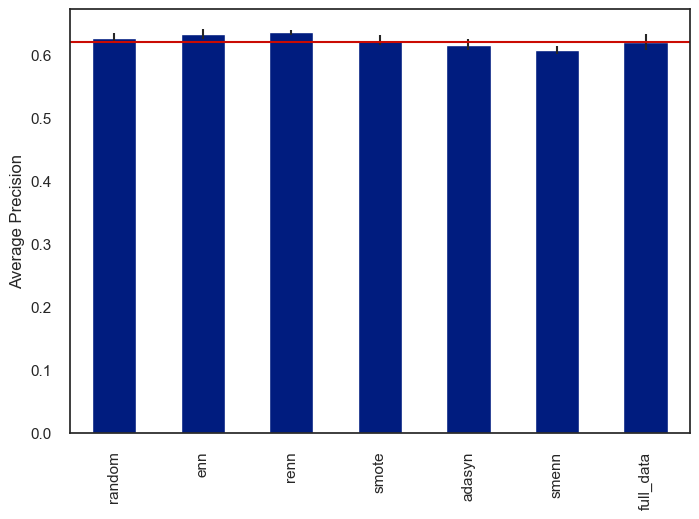

In [359]:
pr_mean_dict["full_data"] = np.mean(clf["test_score"])
pr_std_dict["full_data"] = np.std(clf["test_score"])

pr_mean_s = pd.Series(pr_mean_dict)
pr_std_s = pd.Series(pr_std_dict)

pr_mean_s.plot.bar(yerr=[pr_std_s, pr_std_s])
plt.ylabel("Average Precision")
plt.axhline(pr_mean_dict["full_data"], color="r")
plt.show()

In [360]:
print(x := max(pr_mean_dict, key=pr_mean_dict.get), pr_mean_dict[x])

renn 0.6353615213404119


#### Oversampling: SMOTENC

Sampling the categerical and numerical variables before encoding using smotenc produce nearly the same result as first encoding and resampling with smote.
**NB:** see how the evaluation of the resampling is done.

In [181]:
def score_model_smotenc(model, X_train, y_train, cv=None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    if cv is None:
        cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    smoter = SMOTENC(categorical_features=categorical_variables, random_state=42)

    scores = []

    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        # Get the training data
        X_train_fold, y_train_fold = (
            X_train.iloc[train_fold_index],
            y_train[train_fold_index],
        )
        # Get the validation data
        X_val_fold, y_val_fold = X_train.iloc[val_fold_index], y_train[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(
            X_train_fold, y_train_fold
        )
        y_train_fold_upsample = label_encoder.transform(y_train_fold_upsample)
        y_val_fold = label_encoder.transform(y_val_fold)

        X_train_fold_upsample = final_pipeline.transform(
            X_train_fold_upsample
        )
        print(
            X_train_fold_upsample.shape,
            y_train_fold_upsample.shape,
            sum(y_train_fold_upsample == 0),
            sum(y_train_fold_upsample == 1),
        )

        X_val_fold = final_pipeline.transform(X_val_fold)
        # Fit the model on the upsampled training data
        model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample)
        # Score the model on the (non-upsampled) validation data
        score = auprc_score(y_val_fold, model_obj.predict_proba(X_val_fold)[:, 1])
        scores.append(score)
    return np.mean(scores)

In [267]:
model = XGBClassifier(
    scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
    random_state=42,
)

scores_smotenc = score_model_smotenc(model, X_train, y_train, cv=None)
print("mean cross val scores for smotenc:", scores_smotenc)

mean cross val scores for smotenc: 0.5584342524795307


In [447]:
def run_xgboost(X_train, X_test, y_train, y_test):

    xgbc = XGBClassifier(
        scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
        random_state=42,
    )
    xgbc.fit(X_train, y_train)

    print("Train set")
    pred = xgbc.predict_proba(X_train)
    print("XGBoost AUPRC: {}".format(auprc_score(y_train, pred[:, 1])))

    print("Test set")
    pred = xgbc.predict_proba(X_test)
    print("XGBoost AUPRC: {}".format(auprc_score(y_test, pred[:, 1])))


run_xgboost(
    X_train_imp_num_cat_select,
    X_test_imp_num_cat_select,
    y_train_transformed,
    y_test_transformed,
)

Train set
XGBoost AUPRC: 0.8057973654208854
Test set
XGBoost AUPRC: 0.5951800588937797


In [269]:
smoter = SMOTENC(categorical_features=categorical_variables, random_state=42)

X_resampled, y_resampled = smoter.fit_resample(X_train, y_train)

y_train_smoter = label_encoder.transform(y_resampled)


dtrain_smoter = feature_engineering_pipeline.transform(X_resampled)

run_xgboost(
    dtrain_smoter,
    X_test_imp_num_cat_select,
    y_train_smoter,
    y_test_transformed,
)

Train set
XGBoost AUPRC: 0.9743847438725727
Test set
XGBoost AUPRC: 0.5532929454802312


## **ML Model Selection with Imbalance Solution using Cross Validation**

Imbalance solutions have not improved the performance significantly for the other models from what I had for the XGBoost without any of this solution. Going forward, I will optimise the model hyperparameters

In [36]:
# Setting up models
models = {
    "Naive Bayes": GaussianNB(),
    "Logistic Regression": LogisticRegression(
        class_weight="balanced", solver="saga", max_iter=1000, random_state=42
    ),  # apply cost sensitive learning using class weight which can be fine-tuned later
    "Decision Tree": DecisionTreeClassifier(class_weight="balanced", random_state=42),
    "Random Forest": RandomForestClassifier(  # bagging algorithm, without resampling
        class_weight="balanced", random_state=42, n_jobs=-1
    ),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(
        scale_pos_weight=sum(y_train_transformed == 0) / sum(y_train_transformed == 1),
        random_state=42,
    ),  # XGBoost handles imbalance by scale_pos_weight
    "Extra Trees": ExtraTreesClassifier(class_weight="balanced", random_state=42),
    "AdaBoost": AdaBoostClassifier(
        algorithm="SAMME"
    ),  # boosting algorithm, without resampling
    "BaggingClassifier": BaggingClassifier(  # bags any algorithm we want
        estimator=ExtraTreeClassifier(random_state=42),
        n_estimators=100,
    ),
    # "KNN": KNeighborsClassifier(n_jobs=-1),
    # "SVM": SVC(random_state=42),
    # bagging of Logistic regression, with resampling
    "balancedbagging": BalancedBaggingClassifier(
        estimator=LogisticRegression(random_state=42, max_iter=1000, solver="saga"),
        n_estimators=20,
        max_samples=1.0,  # The number of samples to draw from X to train each base estimator
        max_features=1.0,  # The number of features to draw from X to train each base estimator
        bootstrap=True,
        bootstrap_features=False,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
    # boosting + undersampling
    "rusboost": RUSBoostClassifier(
        estimator=None,
        n_estimators=20,
        learning_rate=1.0,
        sampling_strategy="auto",
        random_state=2909,
    ),
    # bagging + boosting + under-sammpling
    "easyEnsemble": EasyEnsembleClassifier(
        n_estimators=20,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
    # balanced random forests (bagging)
    "balancedRF": BalancedRandomForestClassifier(
        n_estimators=20,
        criterion="gini",
        max_depth=3,
        sampling_strategy="auto",
        n_jobs=4,
        random_state=2909,
    ),
}

sampler_dict = {"random": RandomUnderSampler(
        sampling_strategy="auto", random_state=0, replacement=False
    ),
    
    "enn": EditedNearestNeighbours(
        sampling_strategy="auto", n_neighbors=3, kind_sel="all", n_jobs=4
    ),
    "renn": RepeatedEditedNearestNeighbours(
        sampling_strategy="auto", n_neighbors=3, kind_sel="all", n_jobs=4, max_iter=100
    ),
    "random": RandomOverSampler(sampling_strategy="auto", random_state=0),
    "smote": SMOTE(
        sampling_strategy="auto",  # samples only the minority class
        random_state=0,  # for reproducibility
        k_neighbors=5,
        n_jobs=4,
    ),
    "adasyn": ADASYN(
        sampling_strategy="auto",  # samples only the minority class
        random_state=0,  # for reproducibility
        n_neighbors=5,
        n_jobs=4,
    ),
    "smenn": SMOTEENN(
        sampling_strategy="auto",  # combines both over and under sampling
        random_state=0,
        smote=SMOTE(sampling_strategy="auto", random_state=0, k_neighbors=5),
        enn=EditedNearestNeighbours(
            sampling_strategy="auto", n_neighbors=5, kind_sel="all"
        ),
        n_jobs=4,
    ),
    }

results = {}

for model_name, model in models.items():

    for name, resampler in sampler_dict.items():

        # setup like this so we train on the undersampled data and evaluate on the test data with the original distribution
        pipeline = make_pipeline(resampler, xgbc)
        pr_mean, pr_std = run_model(X_train_tf, y_train_tf, pipeline)
        print(f"{model_name}_{name}", pr_mean, pr_std)
        # results[model_name] = {}
        results[f"{model_name}_{name}"] = pr_mean
        # results[model_name][name] = pr_std

Naive Bayes_randomOS 0.6478036887045692 0.00591832891392775
Naive Bayes_smote 0.5839862658047904 0.012168660559246845
Naive Bayes_adasyn 0.580368968657048 0.010286094512837208
Naive Bayes_randomUS 0.6574599880809359 0.00450381241866408
Naive Bayes_enn 0.650537161365265 0.0035759936817054408
Naive Bayes_renn 0.6578437694030173 0.008494665084382864
Logistic Regression_randomOS 0.6478036887045692 0.00591832891392775
Logistic Regression_smote 0.5839862658047904 0.012168660559246845
Logistic Regression_adasyn 0.580368968657048 0.010286094512837208
Logistic Regression_randomUS 0.6574599880809359 0.00450381241866408
Logistic Regression_enn 0.650537161365265 0.0035759936817054408
Logistic Regression_renn 0.6578437694030173 0.008494665084382864
Decision Tree_randomOS 0.6478036887045692 0.00591832891392775
Decision Tree_smote 0.5839862658047904 0.012168660559246845
Decision Tree_adasyn 0.580368968657048 0.010286094512837208
Decision Tree_randomUS 0.6574599880809359 0.00450381241866408
Decision T

In [39]:
results["full_data"] = np.mean(clf["test_score"])

In [54]:
df = pd.DataFrame(list(results.items()), columns=["Model", "AUPRC"])
df.sort_values(by="AUPRC", ascending=False)

,Model,AUPRC
17,Decision Tree_renn,0.657844
11,Logistic Regression_renn,0.657844
53,BaggingClassifier_renn,0.657844
23,Random Forest_renn,0.657844
5,Naive Bayes_renn,0.657844
47,AdaBoost_renn,0.657844
29,Gradient Boosting_renn,0.657844
41,Extra Trees_renn,0.657844
35,XGBoost_renn,0.657844
15,Decision Tree_randomUS,0.657460


## **Hyperparameter Optimization for XGBoost Classifier using Sequential/Bayesian Search**

In [422]:
# Custom AUPRC evaluation metric
def auprc_score(y_true, y_pred):
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    return auc(recall, precision)


auprc = make_scorer(
    auprc_score,
    needs_proba=True,
    greater_is_better=True,
)

param_grid = [
    Integer(10, 500, name="n_estimators"),
    Integer(1, 15, name="max_depth"),
    Real(0.001, 0.99, name="learning_rate"),
    Categorical(["gbtree", "dart"], name="booster"),
    Real(0.01, 20, name="gamma"),
    Real(0.10, 0.90, name="subsample"),
    Real(0.10, 0.90, name="colsample_bytree"),
    Real(0.10, 0.90, name="colsample_bylevel"),
    Real(0.10, 0.90, name="colsample_bynode"),
    Integer(1, 50, name="reg_lambda"),
    Real(0.1, 10, name="scale_pos_weight"),  # implement a cost effective learning
    Integer(1, 50, name="min_child_weight"),
    Real(0, 10, name="max_delta_step"),  # Added max_delta_step
    Real(0, 1, name="reg_alpha"),  # Added reg_alpha
]

xgbc = XGBClassifier(
    random_state=42,
)


@use_named_args(param_grid)
def objective(**params):

    # model with new parameters
    xgbc.set_params(**params)

    # optimization function (hyperparam response function)
    value = np.mean(
        cross_val_score(xgbc, X_train_tf, y_train_tf, cv=3, n_jobs=-4, scoring=auprc)
    )

    # negate because we need to minimize
    return -value

#### Using SMAC

In [362]:
fm_ = forest_minimize(
    objective,  # the objective function to minimize
    param_grid,  # the hyperparameter space
    base_estimator="RF",  # the surrogate model to use
    n_initial_points=10,  # the number of points to evaluate f(x) to start of
    acq_func="EI",  # the acquisition function
    n_calls=60,  # the number of subsequent evaluations of f(x)
    random_state=0,
)

In [363]:
print(f"Best score={fm_.fun}")

Best score=-0.5672723778078185


In [364]:
dim_names = [
    "n_estimators",
    "max_depth",
    "learning_rate",
    "booster",
    "gamma",
    "subsample",
    "colsample_bytree",
    "colsample_bylevel",
    "colsample_bynode",
    "reg_lambda",
    "scale_pos_weight",
    "min_child_weight",
    "max_delta_step",
    "reg_alpha",
]

In [365]:
params = {key: value for key, value in zip(dim_names, fm_.x)}
params

{'n_estimators': 243,
 'max_depth': 5,
 'learning_rate': 0.6943663097834554,
 'booster': 'gbtree',
 'gamma': 0.06565826002319296,
 'subsample': 0.8852542061924196,
 'colsample_bytree': 0.8384674691018807,
 'colsample_bylevel': 0.6046091231466343,
 'colsample_bynode': 0.8356830655593803,
 'reg_lambda': 41,
 'scale_pos_weight': 0.1897825682913128,
 'min_child_weight': 3,
 'max_delta_step': 4.659544757413269,
 'reg_alpha': 0.8927128146482154}

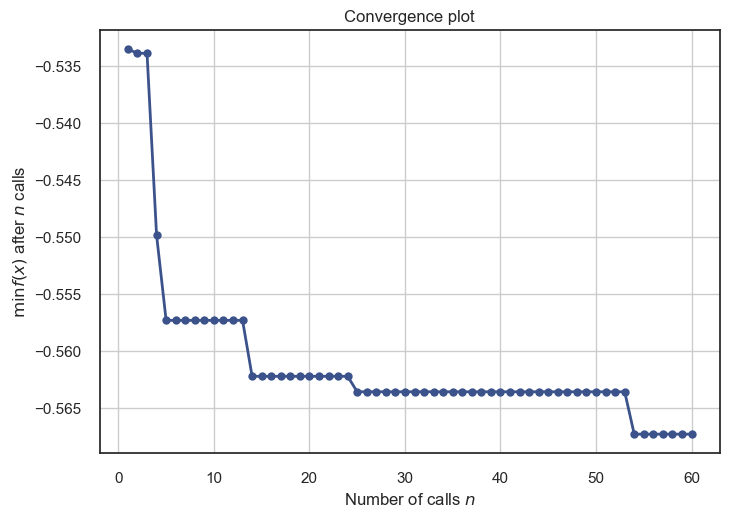

In [366]:
plot_convergence(fm_)
plt.show()

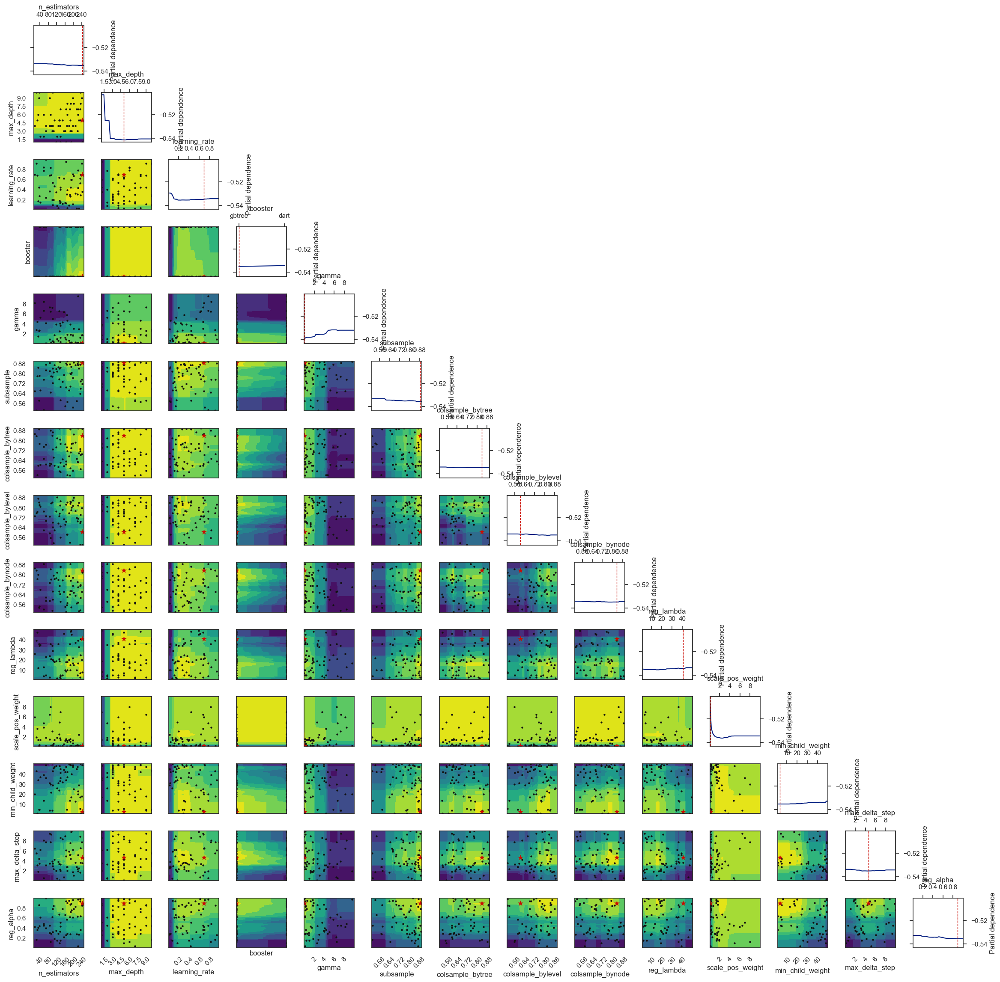

In [367]:
plot_objective(result=fm_, plot_dims=dim_names)
plt.show()

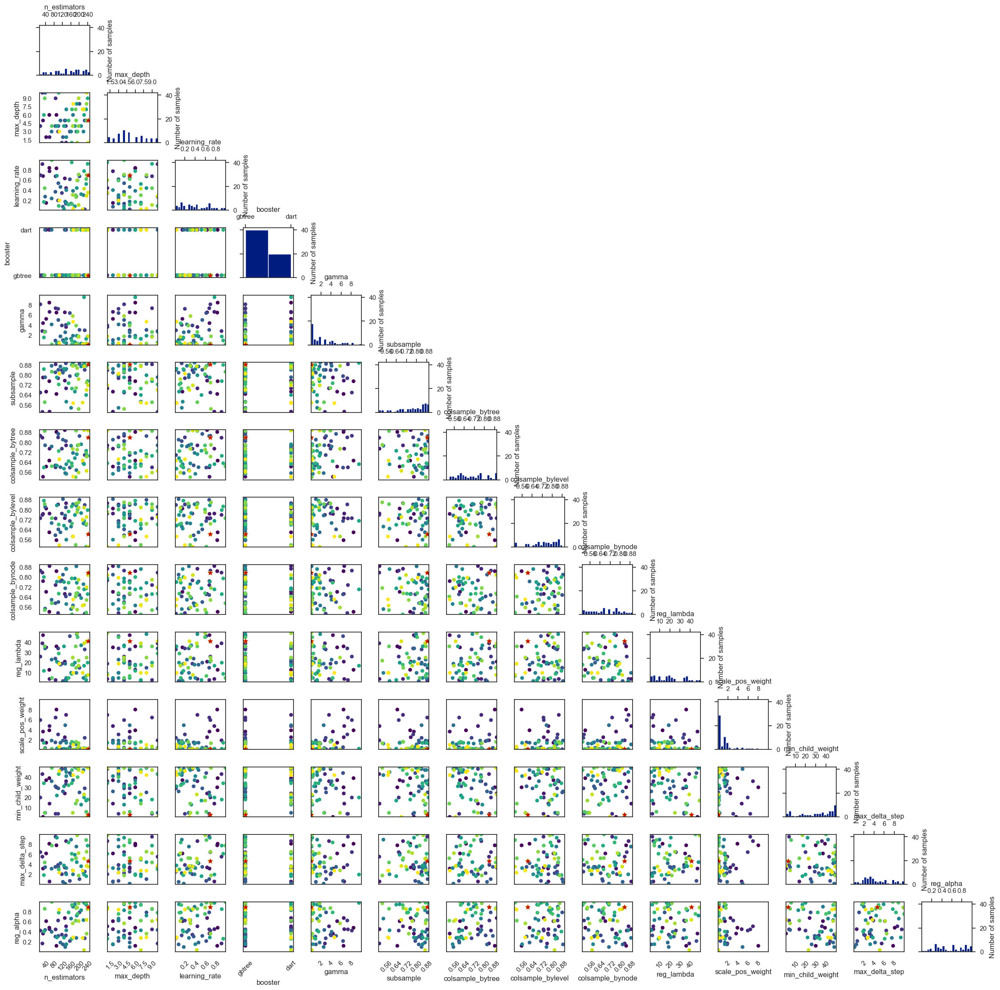

In [368]:
plot_evaluations(result=fm_, plot_dims=dim_names)
plt.show()

In [369]:
def run_xgboost(X_train, X_test, y_train, y_test, params, importance_type="gain"):

    xgbc = XGBClassifier(
        **params,
        importance_type=importance_type,
        random_state=42,
    )
    xgbc.fit(X_train, y_train)

    print("Train set")
    pred = xgbc.predict_proba(X_train)
    print("XGBoost AUPRC: {}".format(auprc_score(y_train, pred[:, 1])))

    print("Test set")
    pred = xgbc.predict_proba(X_test)
    print("XGBoost AUPRC: {}".format(auprc_score(y_test, pred[:, 1])))

    return xgbc


final_model = run_xgboost(X_train_tf, X_test_tf, y_train_tf, y_test_tf, params)

Train set
XGBoost AUPRC: 0.7120738716900761
Test set
XGBoost AUPRC: 0.5765204034521837


#### Using Gaussain Process

In [423]:
gp_1 = gp_minimize(
    objective,  # the objective function to minimize
    param_grid,  # the hyperparameter space
    n_initial_points=15,  # the number of points to evaluate f(x) to start of
    acq_func="EI",  # the acquisition function
    n_calls=300,  # the number of subsequent evaluations of f(x)
    random_state=0,
)

In [371]:
print(f"Best score={gp_1.fun}")

Best score=-0.5723903393723867


In [ ]:
params1 = {key: value for key, value in zip(dim_names, gp_1.x)}
params1

In [372]:
params1 = {key: value for key, value in zip(dim_names, gp_1.x)}
params1

{'n_estimators': 182,
 'max_depth': 8,
 'learning_rate': 0.04114947198640934,
 'booster': 'gbtree',
 'gamma': 5.280025033963081,
 'subsample': 0.8704807077516517,
 'colsample_bytree': 0.9,
 'colsample_bylevel': 0.9,
 'colsample_bynode': 0.6259220005374183,
 'reg_lambda': 15,
 'scale_pos_weight': 8.236432636124821,
 'min_child_weight': 37,
 'max_delta_step': 6.092229592778098,
 'reg_alpha': 0.7671515756808497}

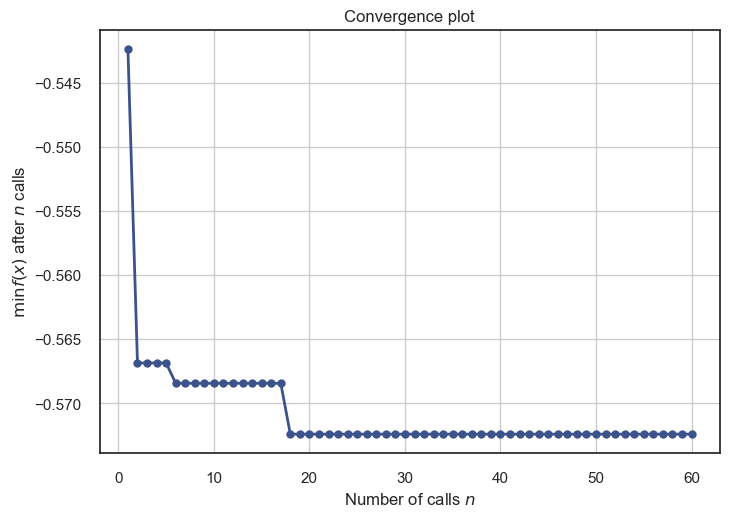

In [373]:
plot_convergence(gp_1)
plt.show()

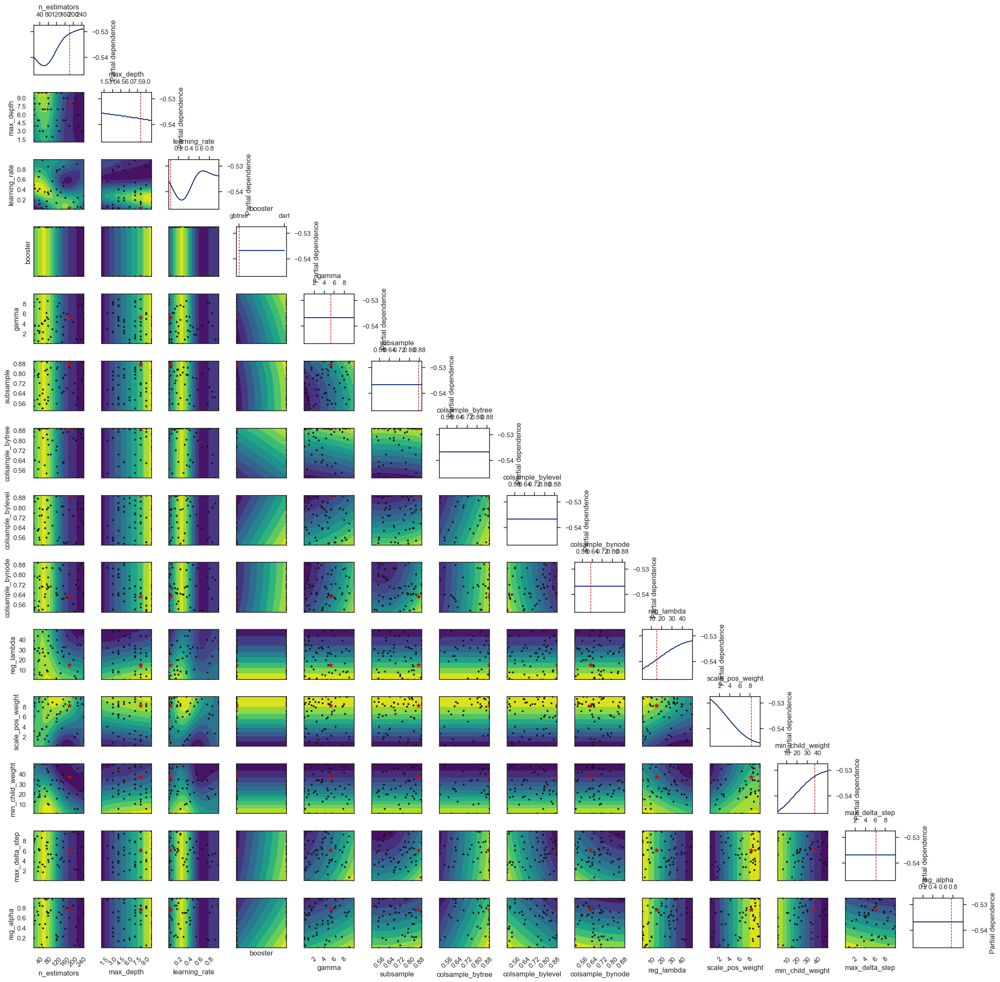

In [374]:
plot_objective(result=gp_1, plot_dims=dim_names)
plt.show()

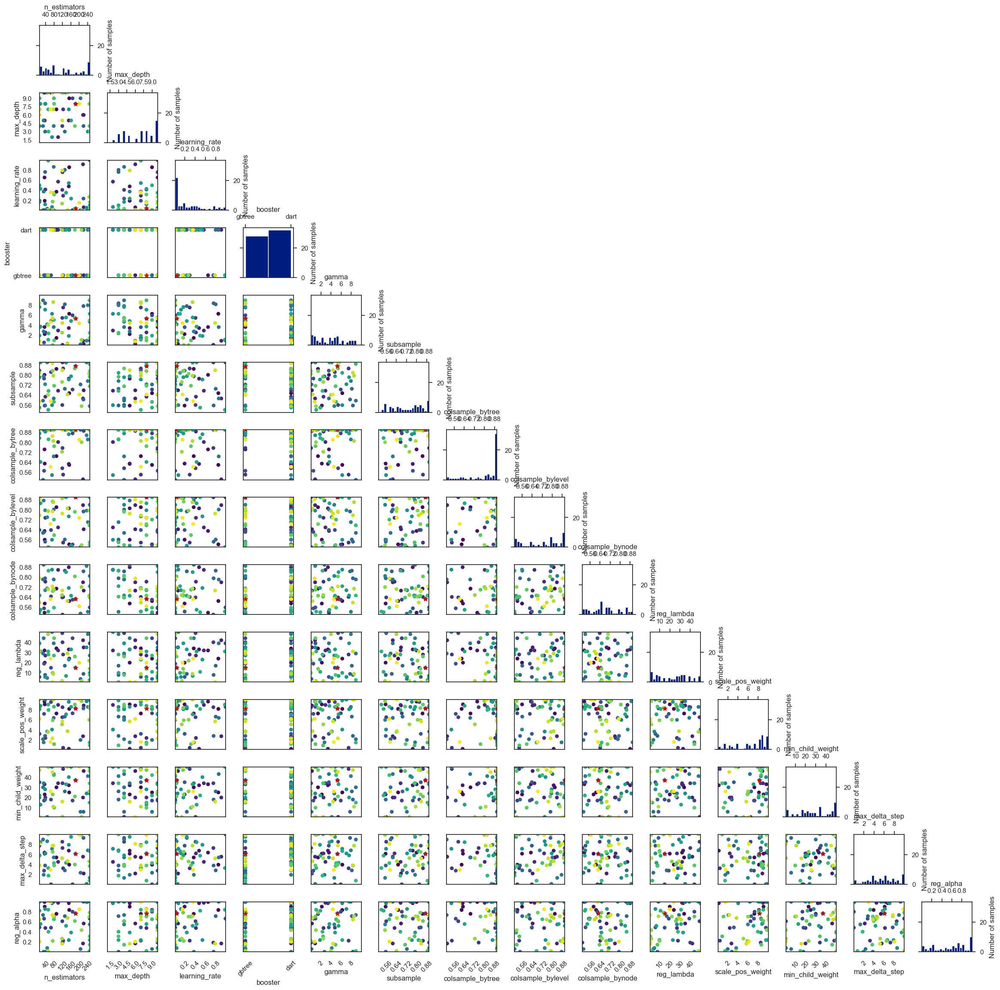

In [375]:
plot_evaluations(result=gp_1, plot_dims=dim_names)
plt.show()

In [376]:
final_model2 = run_xgboost(X_train_tf, X_test_tf, y_train_tf, y_test_tf, params1)

Train set
XGBoost AUPRC: 0.6263260341786163
Test set
XGBoost AUPRC: 0.5813765313282869


## Calibrated Probabilities

Not necessary to determine the model performance but for users, this might be necessary to give them a confidence in the result. In this work, however, we applied cost-sensitive learning using different class weight penalizations in the XGBoost model via the parameter: scale_pos_weight. Techniques like cost sensitive learning, undersampling, and oversampling in a model produce probablities that are uncalibrated irrespective of the model that is used. These techniques distort the relationship between the returned prob and the freaction of positive obs. So if we want to convey likelihood, we need to calibrate the probabilities after re-sampling an cost-sensitive learning.

NB: models like logistic regression returen calibarted prob by design and Decision trees, Naives Bayes etc return uncalibrated prob

In [378]:
from sklearn.calibration import calibration_curve, CalibratedClassifierCV

probs = final_model.predict_proba(X_test_tf)[:, 1]

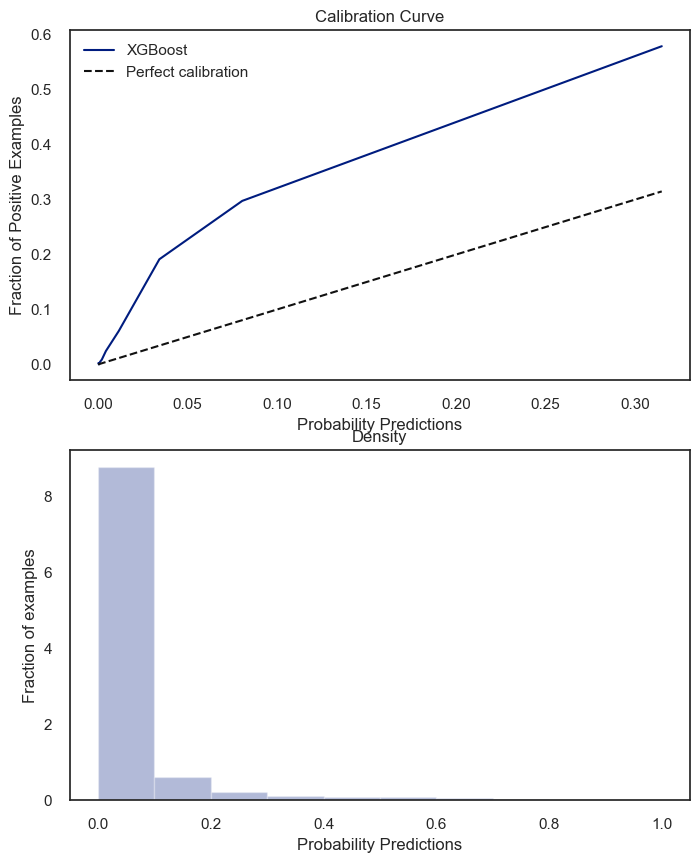

In [382]:
# calibration curve for imbalance dataset is hard to say if the prob is calibrated bcos there are few observations of the positive class
def plot_calibration_curve(y_true, probs, bins, strategy):

    fraction_of_positives, mean_predicted_value = calibration_curve(
        y_true, probs, n_bins=bins, strategy=strategy
    )

    max_val = max(mean_predicted_value)

    plt.figure(figsize=(8, 10))
    plt.subplot(2, 1, 1)
    plt.plot(mean_predicted_value, fraction_of_positives, label="XGBoost")
    plt.plot(
        np.linspace(0, max_val, bins),
        np.linspace(0, max_val, bins),
        linestyle="--",
        color="k",
        label="Perfect calibration",
    )

    plt.xlabel("Probability Predictions")
    plt.ylabel("Fraction of Positive Examples")
    plt.title("Calibration Curve")
    plt.legend(loc="best")

    plt.subplot(2, 1, 2)
    plt.hist(probs, range=(0, 1), bins=bins, density=True, stacked=True, alpha=0.3)
    plt.xlabel("Probability Predictions")
    plt.ylabel("Fraction of examples")
    plt.title("Density")
    plt.show()


plot_calibration_curve(y_test_tf, probs, bins=10, strategy="quantile")

Brier score closer to zero shows a model is better calibrated, however, for imbalance datasets, rare classes do not affect the score. This score doesn't refelect imbalance datasets

In [379]:
from sklearn.metrics import (
    brier_score_loss,
    roc_auc_score,
)

print("Brier Score of ", brier_score_loss(y_test_tf, probs))

Brier Score of  0.0832680317844437


calibrating a classifier means mapping a model's prediction to a posterior prob, $p(y)$

$$f_{\text{calib}} (s(x)) = p(y)$$


$s(x)$ is the score of the classifier. The two common ways of doing this are the Platt scaling and Isotonic regression, $f_{\text{calib}}$. To get a good posterior prob, we should not calibrate our classifiers on the train set but rather on the test set

In [393]:
# Isotonic calibration
model = XGBClassifier(
    **params1,
    random_state=42,
)
clf_isotonic = CalibratedClassifierCV(model, cv=5, method="isotonic")
clf_isotonic.fit(X_train_tf, y_train_tf)
prob_isotonic = clf_isotonic.predict_proba(X_test_tf)[:, 1]

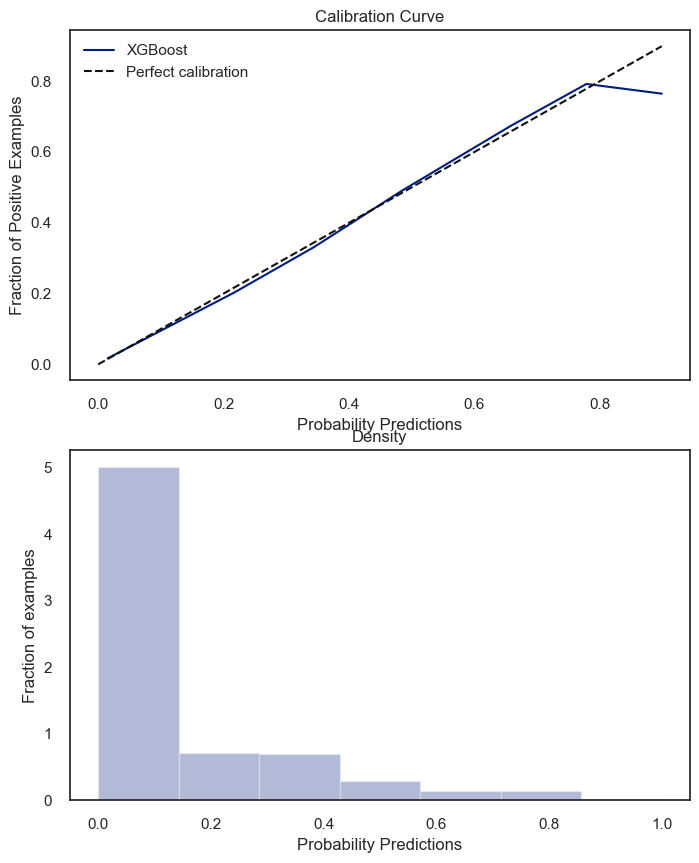

In [394]:
plot_calibration_curve(y_test_tf, prob_isotonic, bins=7, strategy="uniform")

In [395]:
print("Test set")
print("XGBoost AUPRC: {}".format(auprc_score(y_test_tf, prob_isotonic)))

Test set
XGBoost AUPRC: 0.5795371087223953


In [396]:
print(
    "Brier Score of calibrated prob using Isotonic Regression",
    brier_score_loss(y_test_tf, prob_isotonic),
)

Brier Score of calibrated prob using Isotonic Regression 0.06814730534300524


In [397]:
# Isotonic calibration
# clf_isotonic = CalibratedClassifierCV(final_model, cv=5, method="prefit")
# clf_isotonic.fit(X_test_tf, y_test_tf)
# prob_isotonic = clf_isotonic.predict_proba(X_test_tf)[:, 1]

# Sigmoid calibration/platt scaling
clf_sigmoid = CalibratedClassifierCV(model, cv=5, method="sigmoid")
clf_sigmoid.fit(X_train_tf, y_train_tf)
prob_sigmoid = clf_sigmoid.predict_proba(X_test_tf)[:, 1]

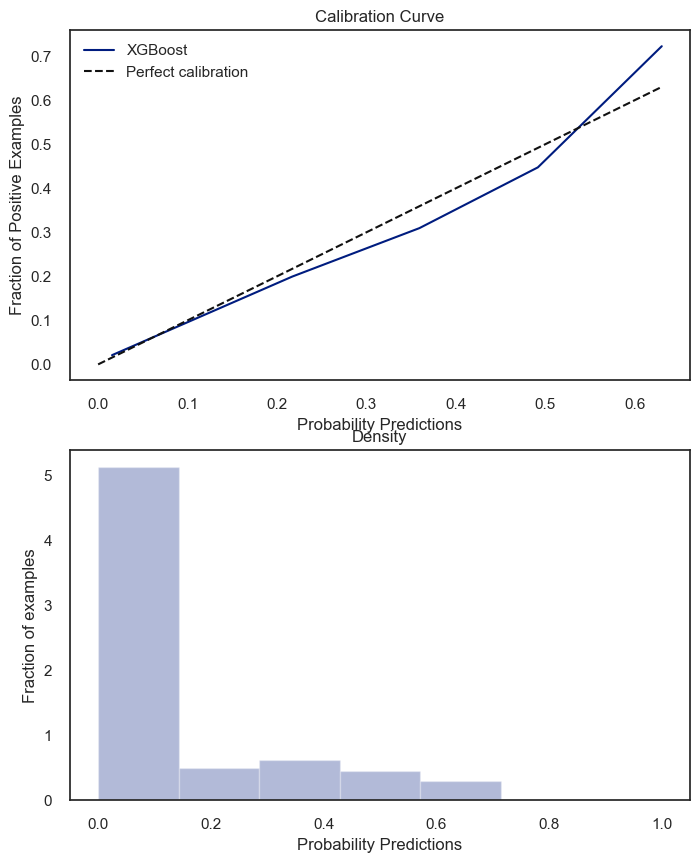

In [398]:
plot_calibration_curve(y_test_tf, prob_sigmoid, bins=7, strategy="uniform")

In [399]:
print("Test set")
print("XGBoost AUPRC: {}".format(auprc_score(y_test_tf, prob_sigmoid)))

Test set
XGBoost AUPRC: 0.5795245804154641


In [400]:
print(
    "Brier Score of calibrated prob using Platt Scaling",
    brier_score_loss(y_test_tf, prob_sigmoid),
)

Brier Score of calibrated prob using Platt Scaling 0.06910631989968688


The isotonic regression calibrator has the smallest Brier score and hence a plausible choice of calibrator.

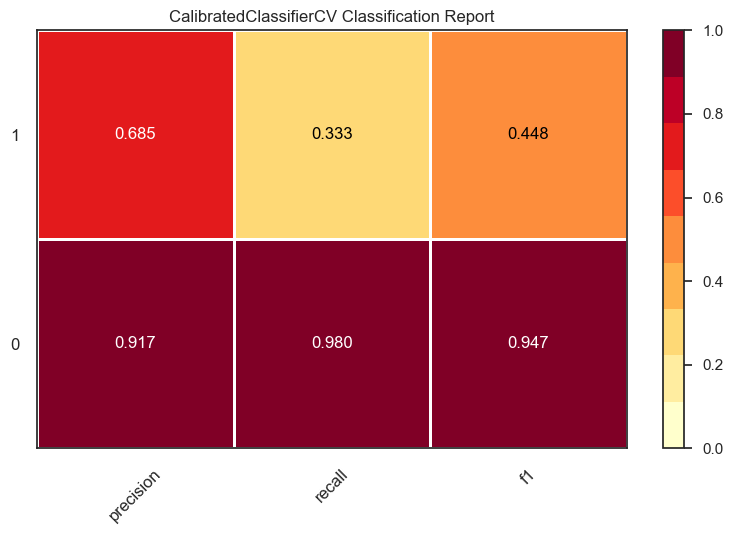

<Axes: title={'center': 'CalibratedClassifierCV Classification Report'}>

In [414]:
# clf_isotonic = CalibratedClassifierCV(final_model, cv=5, method="isotonic")
model = XGBClassifier(
    **params1,
    random_state=42,
)
visualizer = ClassificationReport(clf_isotonic)

visualizer.fit(X_train_tf, y_train_tf)  # Fit the training data to the visualizer
visualizer.score(X_test_tf, y_test_tf)  # Evaluate the model on the test data
visualizer.show()

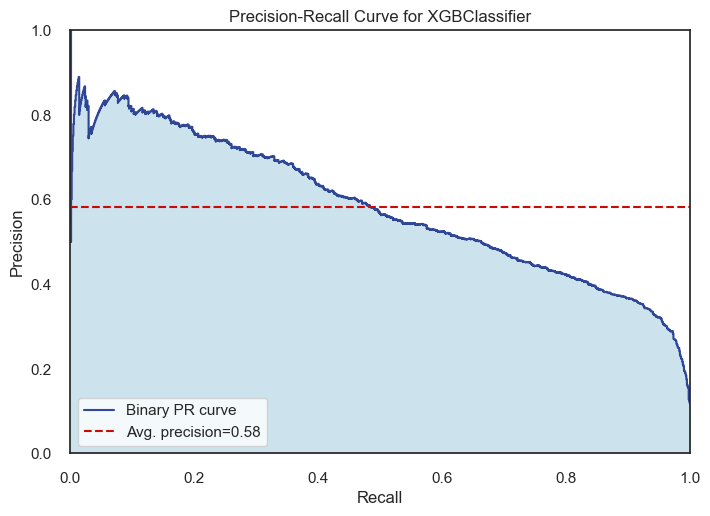

<Axes: title={'center': 'Precision-Recall Curve for XGBClassifier'}, xlabel='Recall', ylabel='Precision'>

In [407]:
visualizer = PrecisionRecallCurve(model, classes=[0, 1])

visualizer.fit(X_train_tf, y_train_tf)  # Fit the training data to the visualizer
visualizer.score(X_test_tf, y_test_tf)  # Evaluate the model on the test data
visualizer.show()

## **Model Explainability**

### Global explanation - Feature importance for XGBoost.
Multicollinearity affects importances derived from tree based models

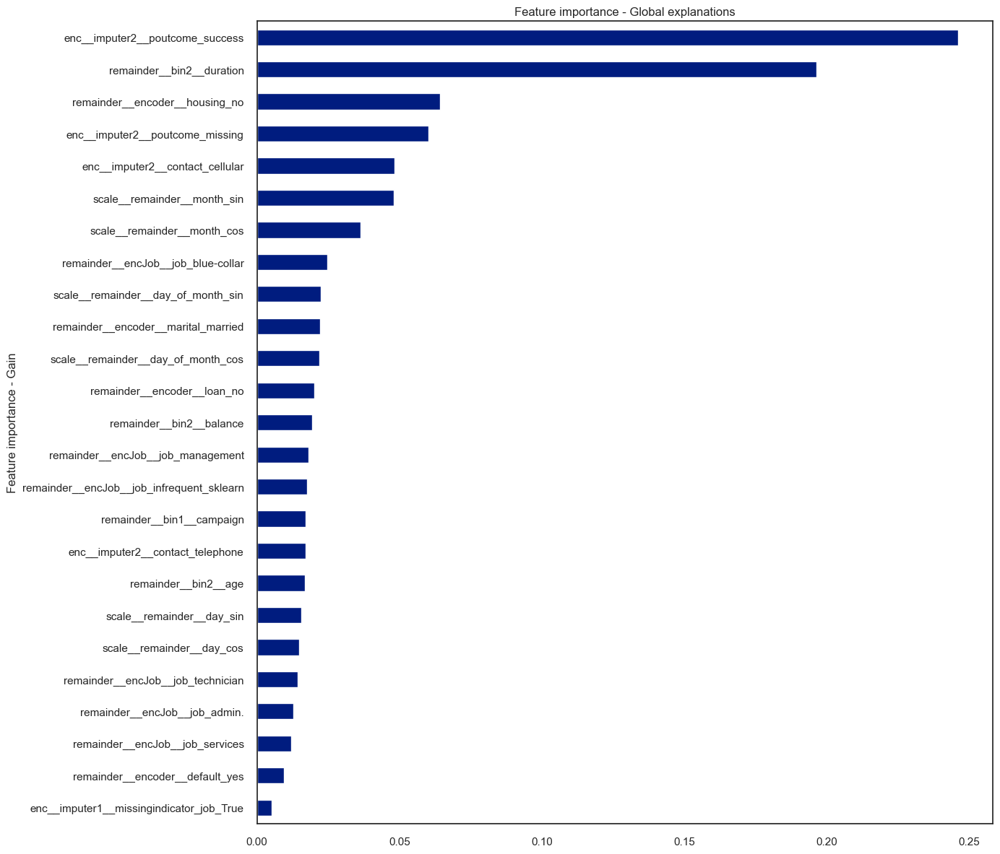

In [408]:
# using gain
global_exp = pd.Series(
    final_model.feature_importances_, index=final_model.feature_names_in_
)
global_exp.sort_values(ascending=False).plot.barh(figsize=(14, 12))
plt.ylabel("Feature importance - Gain")
plt.title("Feature importance - Global explanations")
plt.gca().invert_yaxis()  # Invert the Y-axis to show the most important feature at the top
plt.tight_layout()
plt.show()

# plot_importance(
#     final_model,
#     max_num_features=None,
#     importance_type="gain",
#     title="Feature Importance (Gain)",
#     show_values=False,
#     grid=False,

# )
# plt.show()

Train set
XGBoost AUPRC: 0.6263260341786163
Test set
XGBoost AUPRC: 0.5813765313282869


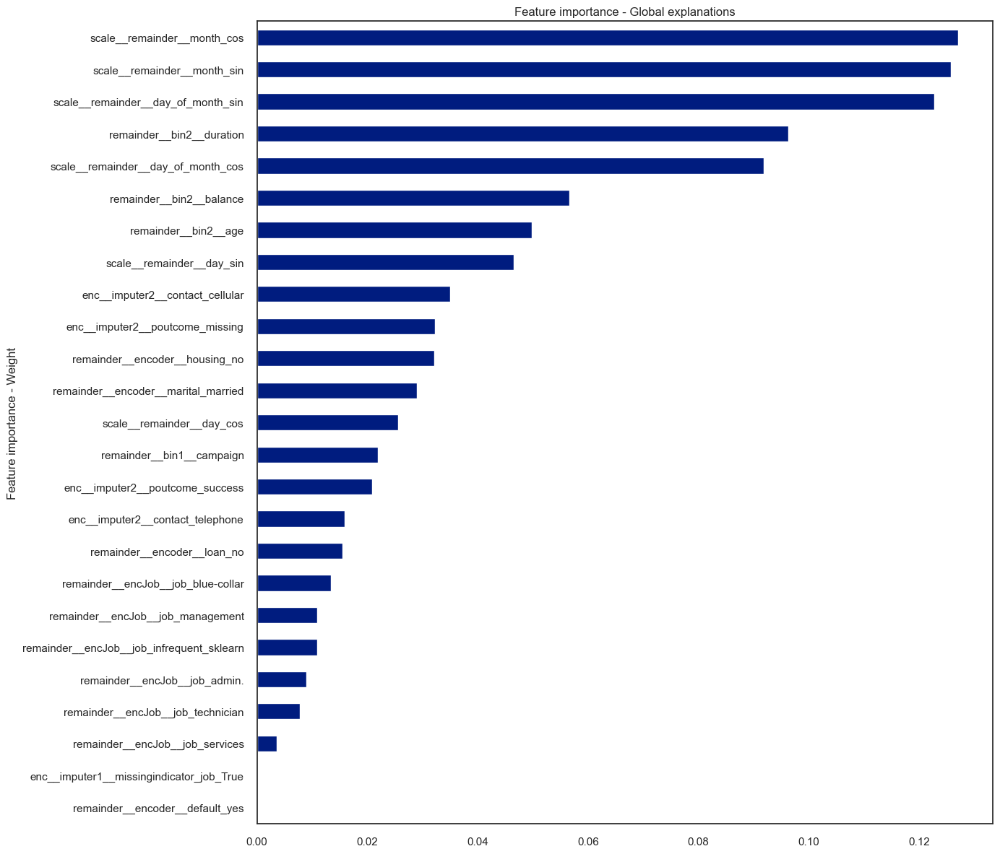

In [409]:
final_model = run_xgboost(
    X_train_tf, X_test_tf, y_train_tf, y_test_tf, params1, importance_type="weight"
)

# using weight
global_exp = pd.Series(
    final_model.feature_importances_, index=final_model.feature_names_in_
)
global_exp.sort_values(ascending=False).plot.barh(figsize=(14, 12))
plt.ylabel("Feature importance - Weight")
plt.title("Feature importance - Global explanations")
plt.gca().invert_yaxis()  # Invert the Y-axis to show the most important feature at the top
plt.tight_layout()
plt.show()

Train set
XGBoost AUPRC: 0.7120738716900761
Test set
XGBoost AUPRC: 0.5765204034521837


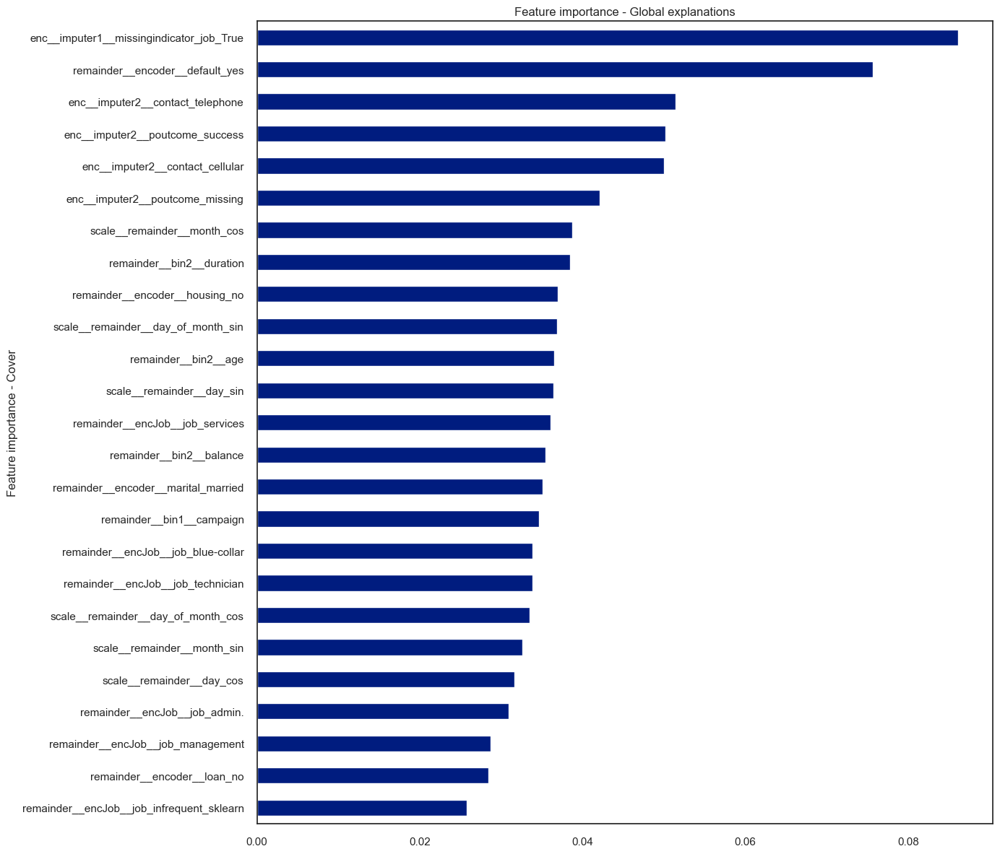

In [410]:
# using cover
final_model = run_xgboost(
    X_train_tf, X_test_tf, y_train_tf, y_test_tf, params, importance_type="cover"
)

global_exp = pd.Series(
    final_model.feature_importances_, index=final_model.feature_names_in_
)
global_exp.sort_values(ascending=False).plot.barh(figsize=(14, 12))
plt.ylabel("Feature importance - Cover")
plt.title("Feature importance - Global explanations")
plt.gca().invert_yaxis()  # Invert the Y-axis to show the most important feature at the top
plt.tight_layout()
plt.show()

There is inconsistency among the various importance metrics associated with XGBoost which pose the question of which one you should trust. Given this inconsistency, I explored other options like Permutation feature importance and SHAP. The feature importances from XGBoost comes in handy when doing feature selection to optimise the model performance.

### **Permutation Feature Importance**
Here, we slightly perturb or randomise each feature and see the performance change from the original training. The features with the largest change or drop in performance are ranked as the most significant features. One of the drawback here is that it doesn't show the interaction among the features and it is also affected by multicollinearity particularly given that we used encoded categorical variables.

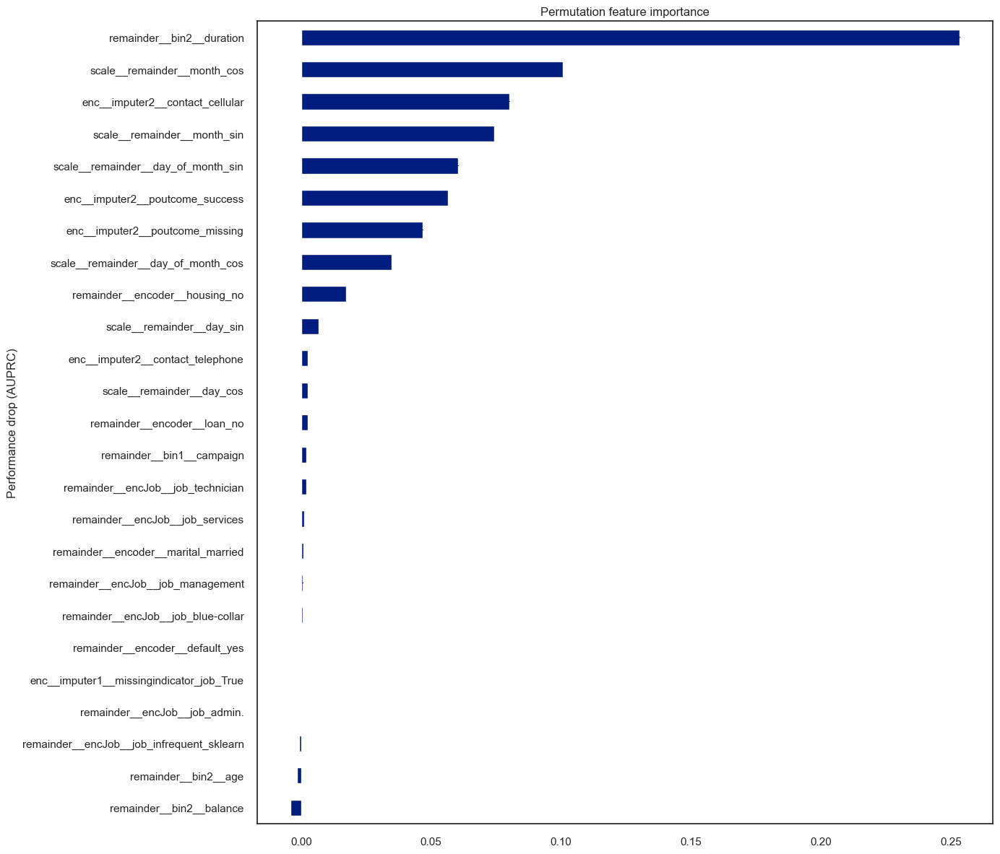

In [411]:
from sklearn.inspection import permutation_importance

r = permutation_importance(
    final_model,
    X_test_tf,  # we use the test set
    y_test_tf,
    scoring=auprc,  # we can use any metric
    n_repeats=5,
    random_state=0,
)

importance = pd.DataFrame(
    {"importance_mean": r["importances_mean"], "importance_std": r["importances_std"]},
    index=final_model.feature_names_in_,
)
# The larger the drop, the more important the feature

importance["importance_mean"].sort_values(ascending=False).plot(
    figsize=(14, 12), kind="barh", yerr=importance["importance_std"]
)

plt.title("Permutation feature importance")
plt.ylabel("Performance drop (AUPRC)")
plt.gca().invert_yaxis()  # Invert the Y-axis to show the most important feature at the top
plt.tight_layout()
plt.show()

In [489]:
# sel = SelectByShuffling(
#     variables=None,  # automatically examine all numerical variables
#     estimator=final_model,  # the ML model
#     scoring=auprc,  # the metric to evaluate
#     threshold=0.01,  # the maximum performance drop allowed to select the feature
#     cv=5,  # cross-validation
#     random_state=1,  # seed
# )

# # Feature-engine measures importance with
# # cross-validation over the train set
# # the importance is derived from the
# # held out fold

# sel.fit(X_train_tf, y_train_tf)
# # sel.initial_model_performance_

# pd.Series(sel.performance_drifts_).sort_values(ascending=False).plot.barh(
#     figsize=(14, 12)
# )

# plt.title("Permutation feature importance")
# plt.ylabel("Performance drop (AUPRC)")
# plt.gca().invert_yaxis()  # Invert the Y-axis to show the most important feature at the top
# plt.tight_layout()
# plt.show()

In [285]:
from sklearn.inspection import PartialDependenceDisplay

important_features = (
    importance["importance_mean"].sort_values(ascending=False)[:6].index.to_list()
)

print(important_features)

['num_power__duration', 'remainder__month', 'trans_l__contact_missing', 'trans_l__poutcome_success', 'cat__housing_yes', 'remainder__day_of_week_cos']


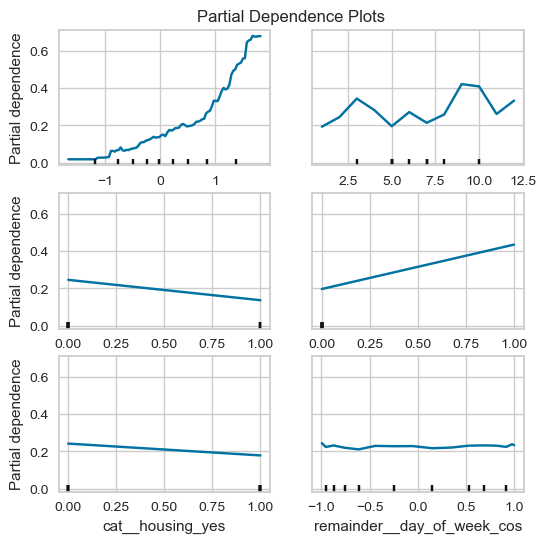

In [286]:
fig, ax = plt.subplots(figsize=(6, 6))
PartialDependenceDisplay.from_estimator(
    final_model, X_test_tf, important_features, n_cols=2, ax=ax
)
ax.set_title("Partial Dependence Plots")
plt.show()

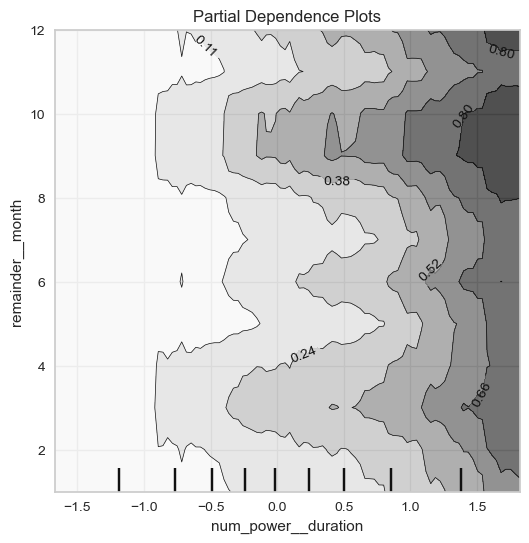

In [287]:
fig, ax = plt.subplots(figsize=(6, 6))

PartialDependenceDisplay.from_estimator(
    final_model,
    X_test_tf,
    # tuple to show the interaction of both important features
    [(important_features[0], important_features[1])],
    target=1,  # set the target to 1 to show the probability for Subscription
    ax=ax,
)
ax.set_title("Partial Dependence Plots")
plt.show()

## SHAP
This is used to explain the probability of subscribing. 

In [412]:
import shap

explainer = shap.Explainer(final_model.predict_proba, X_train_tf)

In [413]:
# we want to explain the predictions of the model for the test set
shape_values = explainer(X_test_tf)

PermutationExplainer explainer: 9044it [25:03,  6.01it/s]                          


In [415]:
shape_values.shape

(9043, 25, 2)

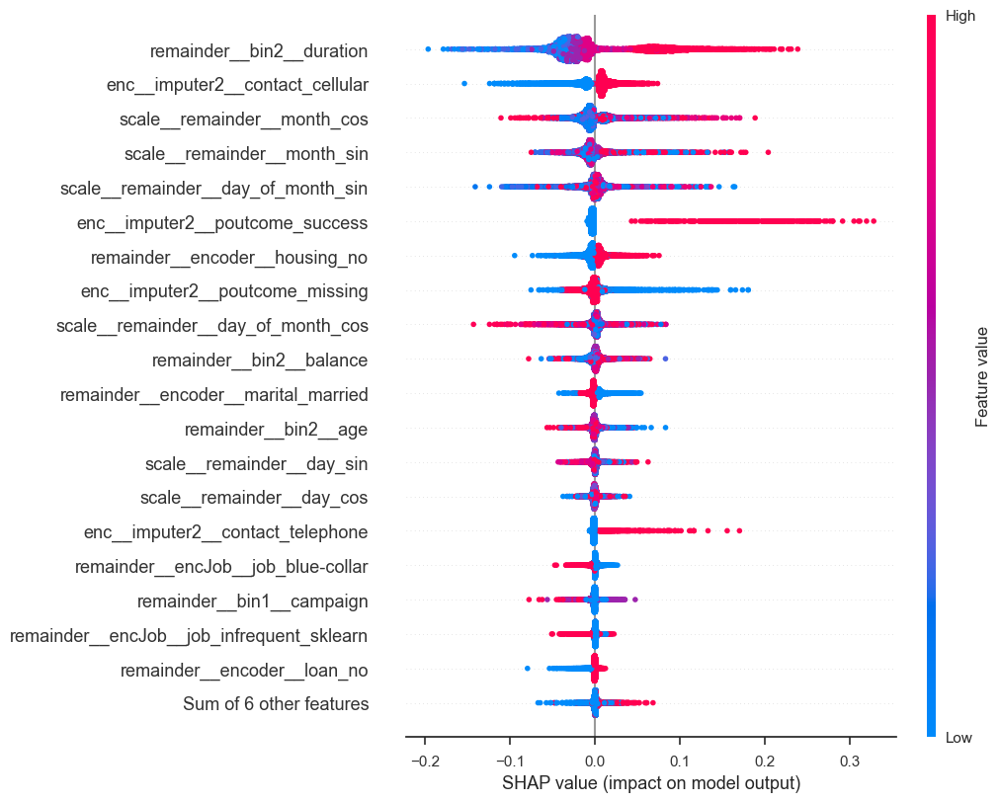

In [416]:
shap.plots.beeswarm(shape_values[:, :, 1], max_display=20)

The most important global feature is the duration given its wide range. Longer contact duration gives the subscribers - I believe - enough time to think and research hence an increase the probability of subscribing and vice versa. When the contact information loss increase, it has a negative impact on the subscription probability. This makes sense as contacting people to subscribe improves their chances. Most subscriptions are done towards the later part of the year. People with housing loans did not subscribe. The scatter plots below explain the evolution of each importance feature. Given the wide dispersion of these features signals that other features are impacting the importance of these features

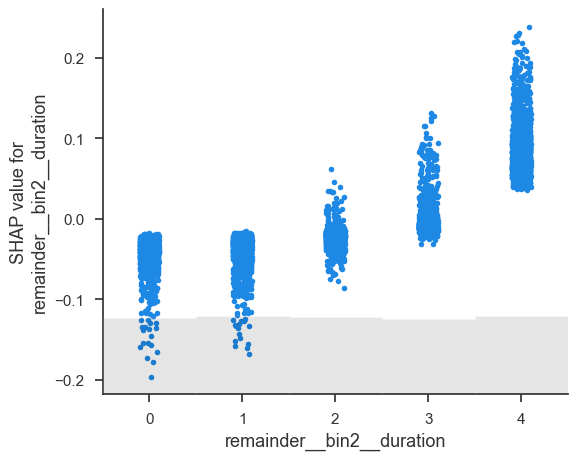

In [419]:
shap.plots.scatter(shape_values[:, "remainder__bin2__duration", 1])

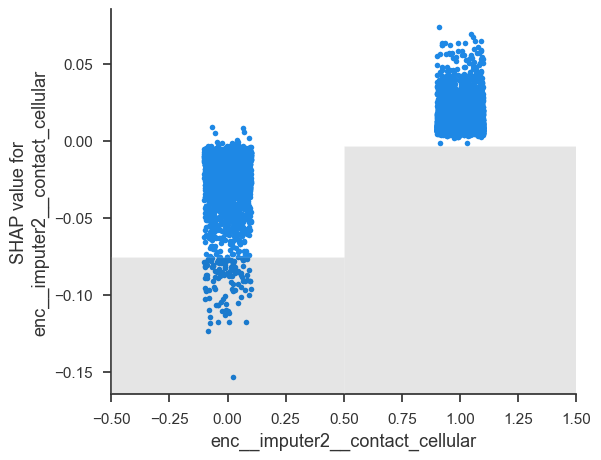

In [420]:
shap.plots.scatter(shape_values[:, "enc__imputer2__contact_cellular", 1])

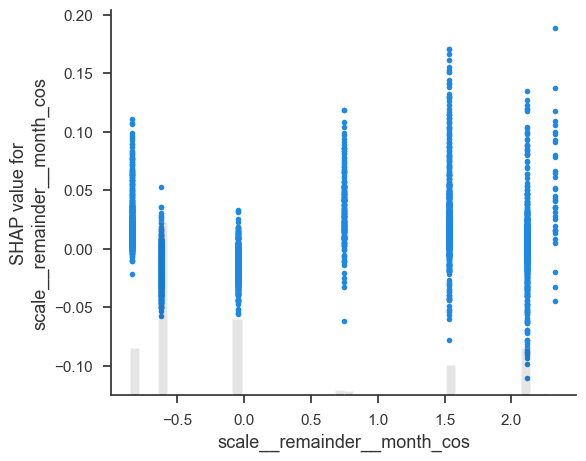

In [421]:
shap.plots.scatter(shape_values[:, "scale__remainder__month_cos", 1])

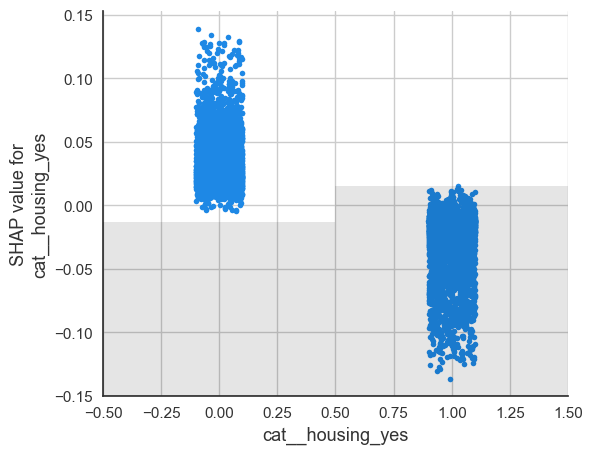

In [500]:
shap.plots.scatter(shape_values[:, "cat__housing_yes", 1])

### Local explanation 



#### SHAP

In [229]:
y_test_tf[0]

0

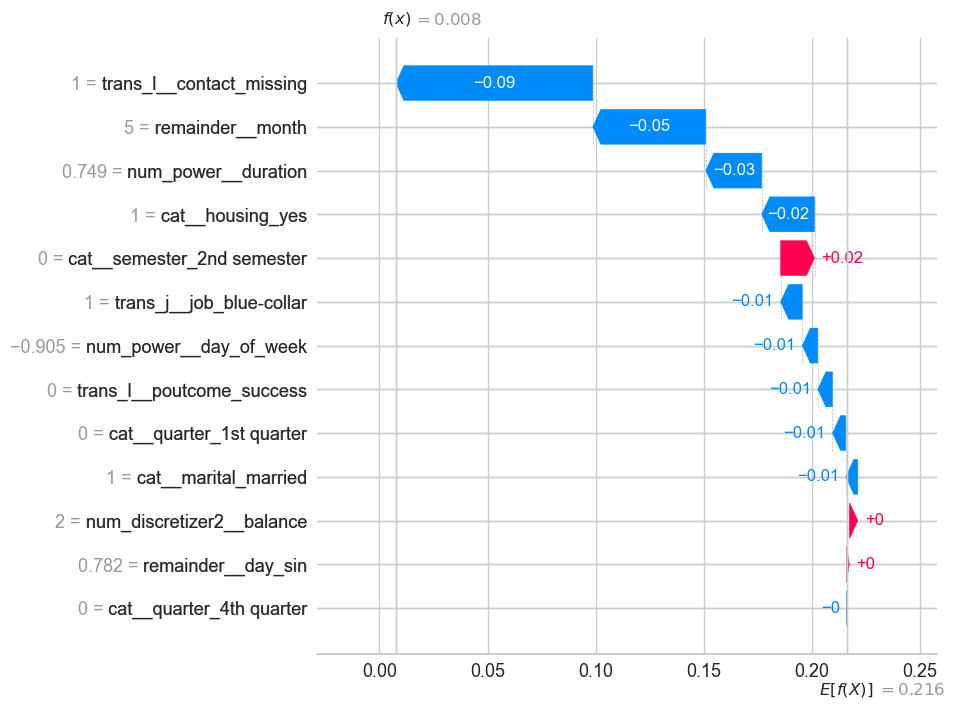

In [501]:
shap.plots.waterfall(shape_values[0, :, 1], max_display=20)

In [233]:
y_test_tf[113]

1

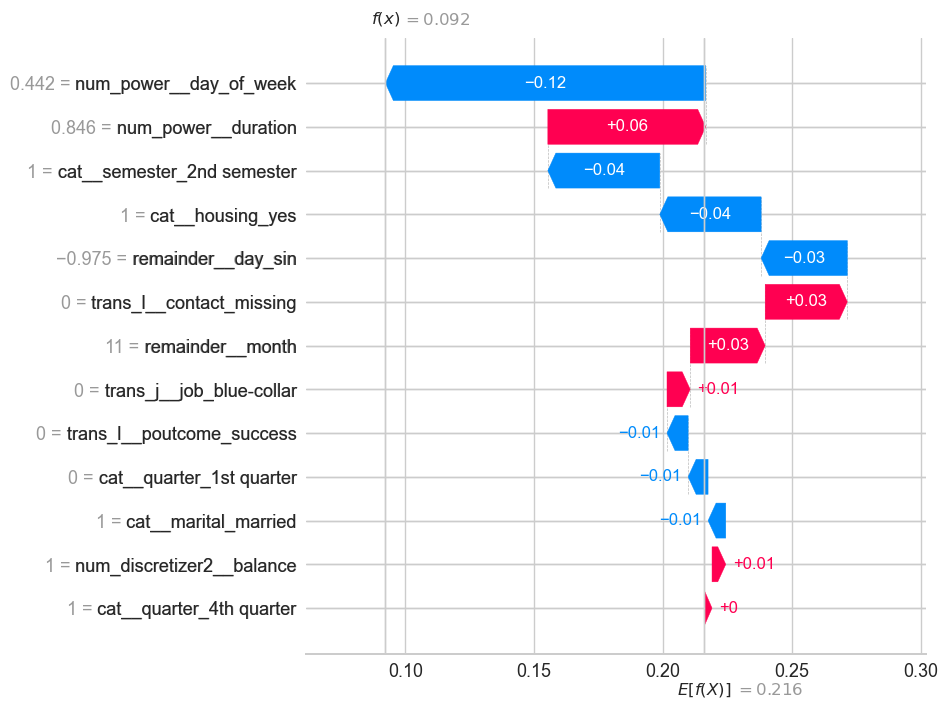

In [502]:
shap.plots.waterfall(shape_values[113, :, 1], max_display=20)

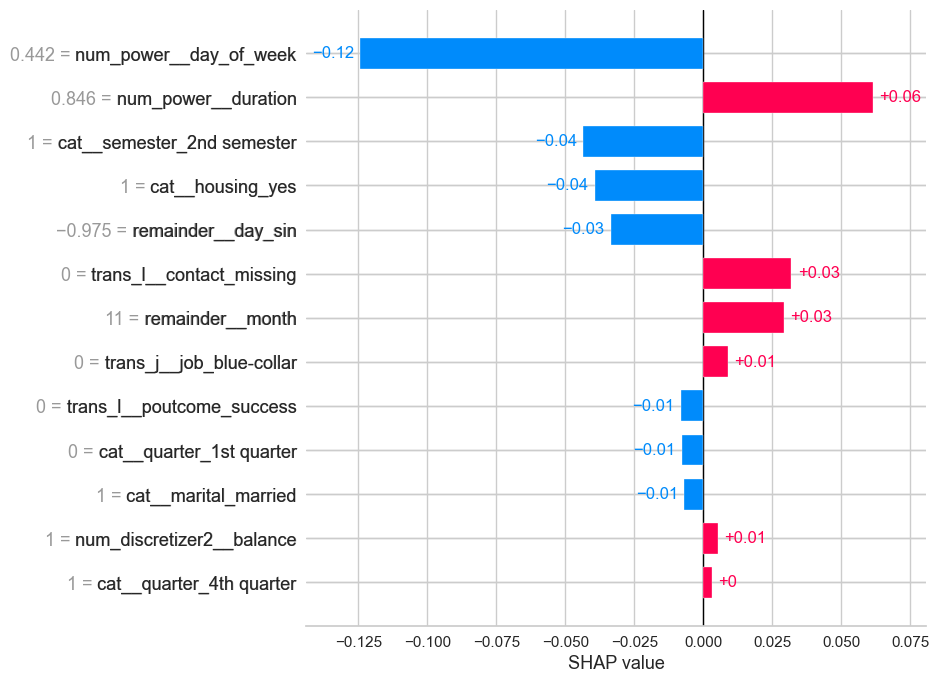

In [503]:
shap.plots.bar(shape_values[113, :, 1], max_display=20)

In [283]:
import lime

In [504]:
# train the explainer

explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_tf,  # the training set
    mode="classification",  # the explanation model
    feature_names=list(X_train_tf.columns),  # the feature names
    class_names=["did not subscribed", "subscribed"],  # the target name
    discretize_continuous=False,
    sample_around_instance=True,  # sample with a Normal distribution centred at the feature mean
    random_state=43,
    kernel_width=0.1,
)

In [505]:
# explain one observation

exp = explainer.explain_instance(
    X_test_tf.iloc[[113]].values[0],  # the observation to explain
    final_model.predict_proba,  # the output of the model on the perturbed data
    num_features=7,  # the number of features to show in the explanation
)

In [506]:
# show the data

exp.show_in_notebook(show_table=True, show_all=False)

In [507]:
# the LIME prediction (the prediction of the LIME surrogate)

exp.local_pred

array([0.09222569])

In [508]:
y_test_tf[113]

0

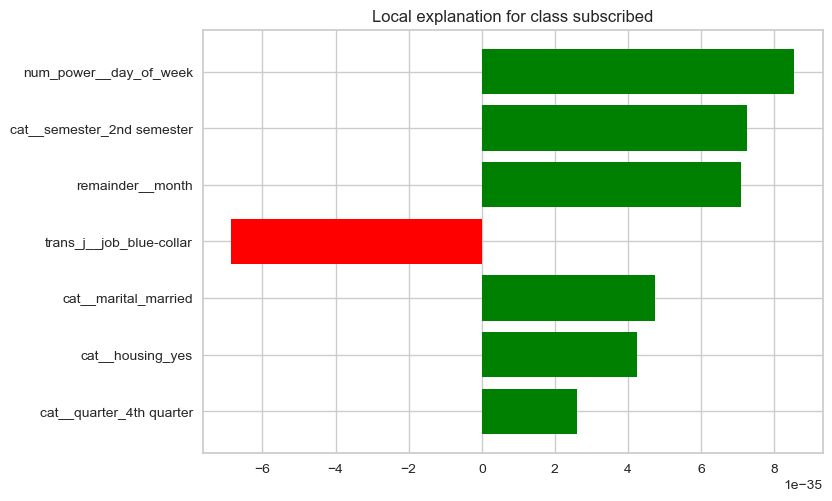

In [509]:
exp.as_pyplot_figure()
plt.show()

In [510]:
y_test_tf[113], final_model.predict_proba(X_test_tf.iloc[[113]].values)[0, 1], exp.score

(0, 0.09222569, 0.0)

# Putting It All Together

In [569]:
class CustomFeatureCreator(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Assume X is a DataFrame
        X = X.copy()

        # X["is_unemployed"] = (
        #     X["job"].isin(["unemployed", "student", "retired"]).astype(int)
        # )
        # X["is_married"] = (X["marital"] == "married").astype(int)
        X["day"] = X["day_of_week"].apply(lambda x: ((x - 1) % 7) + 1).astype(int)
        X["day_of_week_sin"] = np.sin(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_of_week_cos"] = np.cos(
            X["day_of_week"] / X["day_of_week"].max() * 2 * np.pi
        )
        X["day_sin"] = np.sin(X["day"] / X["day"].max() * 2 * np.pi)
        X["day_cos"] = np.cos(X["day"] / X["day"].max() * 2 * np.pi)

        X["is_weekend"] = X["day_of_week"].isin([6, 7]).astype(int)
        # Map each month to its respective quarter
        month_to_quarter = {
            "jan": "1st quarter",
            "feb": "1st quarter",
            "mar": "1st quarter",
            "apr": "2nd quarter",
            "may": "2nd quarter",
            "jun": "2nd quarter",
            "jul": "3rd quarter",
            "aug": "3rd quarter",
            "sep": "3rd quarter",
            "oct": "4th quarter",
            "nov": "4th quarter",
            "dec": "4th quarter",
        }

        X["quarter"] = X["month"].map(month_to_quarter)

        month_to_semester = {
            "jan": "1st semester",
            "feb": "1st semester",
            "mar": "1st semester",
            "apr": "1st semester",
            "may": "1st semester",
            "jun": "1st semester",
            "jul": "2nd semester",
            "aug": "2nd semester",
            "sep": "2nd semester",
            "oct": "2nd semester",
            "nov": "2nd semester",
            "dec": "2nd semester",
        }

        X["semester"] = X["month"].map(month_to_semester)

        month_to_num = {
            "jan": 1,
            "feb": 2,
            "mar": 3,
            "apr": 4,
            "may": 5,
            "jun": 6,
            "jul": 7,
            "aug": 8,
            "sep": 9,
            "oct": 10,
            "nov": 11,
            "dec": 12,
        }

        X["month"] = X["month"].map(month_to_num)

        X["month_sin"] = np.sin(X["month"] / X["month"].max() * 2 * np.pi)
        X["month_cos"] = np.cos(X["month"] / X["month"].max() * 2 * np.pi)
        return X


new_catergorical_features = [
    "quarter",
    "semester",
    "loan",
    "default",
    "housing",
    "marital",
]

ohe_enc_top = OneHotEncoder(
    handle_unknown="infrequent_if_exist",  # unseen categories will be treated like the less frequent ones
    max_categories=6,  # the number of top categories
    sparse_output=False,  # necessary for set output pandas
)

numeric_transformer = Pipeline(
    steps=[
        ("imputer", PowerTransformer(method="yeo-johnson", standardize=False)),
        (
            "scaler",
            StandardScaler(),
        ),  # Standardize features by removing the mean and scaling to unit variance
    ]
)
pipe_cat1 = Pipeline(
    [
        ("s_imputer", SimpleImputer(strategy="most_frequent", add_indicator=True)),
        (("s_ohe", OneHotEncoder(sparse_output=False, handle_unknown="error"))),
    ]
)

pipe_cat2 = Pipeline(
    [
        ("l_imputer", SimpleImputer(strategy="constant", fill_value="missing")),
        (("l_ohe", OneHotEncoder(sparse_output=False, handle_unknown="error"))),
    ]
)

pipe_cat3 = Pipeline(
    [
        ("s_imputer", SimpleImputer(strategy="most_frequent", add_indicator=True)),
        (("s_ohe", ohe_enc_top)),
    ]
)
feature_transformer = ColumnTransformer(
    [
        ("trans_s", pipe_cat1, ["education"]),
        ("trans_l", pipe_cat2, ["contact", "poutcome"]),
        ("trans_j", pipe_cat3, ["job"]),
        (
            "num_discretizer1",
            KBinsDiscretizer(
                n_bins=4,
                encode="ordinal",
                strategy="uniform",
                subsample=None,
            ),
            ["campaign"],
        ),
        (
            "num_discretizer2",
            KBinsDiscretizer(
                n_bins=5,
                encode="ordinal",
                strategy="quantile",
                subsample=None,
            ),
            ["balance"],
        ),
        (
            "num_discretizer3",
            KBinsDiscretizer(
                n_bins=3,
                encode="ordinal",
                strategy="uniform",
                subsample=None,
            ),
            ["pdays"],
        ),
        (
            "num_discretizer4",
            KBinsDiscretizer(
                n_bins=3,
                encode="ordinal",
                strategy="uniform",
                subsample=None,
            ),
            ["previous"],
        ),
        (
            "num_power",
            numeric_transformer,
            ["age", "duration", "day_of_week"],
        ),
        (
            "cat",
            OneHotEncoder(sparse_output=False, handle_unknown="error"),
            new_catergorical_features,
        ),
        #         ("cat2", OneHotEncoder(
        #     handle_unknown="infrequent_if_exist",  # unseen categories will be treated like the less frequent ones
        #     max_categories=6,  # the number of top categories
        #     sparse_output=False,  # necessary for set output pandas
        # )
        # ["month"]
        # )
        ("transformed", "drop", ["month", "day_of_week"]),  # drop these features
    ],
    remainder="passthrough",
).set_output(transform="pandas")

capper = Winsorizer(
    variables=[
        "balance",
        "duration",
        "campaign",
        "pdays",
        "previous",
    ],
    capping_method="quantiles",
    tail="both",
    fold=0.02,
)

select_transformer = RecursiveFeatureElimination(
    variables=None,  # automatically evaluate all numerical variables
    estimator=LogisticRegression(
        random_state=42, max_iter=1000, class_weight="balanced"
    ),  # the ML model
    scoring="f1",  # the metric we want to evalute
    threshold=0.001,  # the maximum performance drop allowed to remove a feature
    cv=3,  # cross-validation
)

feature_select = Pipeline(
    [
        ("constant", DropConstantFeatures(tol=0.998)),
        ("duplicated", DropDuplicateFeatures()),
        (
            "correlation",
            select_transformer,
        ),
    ]
)

params_opt = {
    "n_estimators": 204,
    "max_depth": 8,
    "learning_rate": 0.1326818823008904,
    "booster": "gbtree",
    "gamma": 8.78003105187642,
    "subsample": 0.8190557706490229,
    "colsample_bytree": 0.808515865325433,
    "colsample_bylevel": 0.8962252142314822,
    "colsample_bynode": 0.8916326823611036,
    "reg_lambda": 18,
    "scale_pos_weight": 9.93833797152336,
    "min_child_weight": 1,
    "max_delta_step": 1.0904121518350183,
    "reg_alpha": 0.45510140019426226,
}

xgbc = XGBClassifier(
    **params_opt,
    random_state=42,
)

feature_engineering_pipeline = Pipeline(
    steps=[
        ("capping", capper),  # capping
        ("feature_creation", CustomFeatureCreator()),  # create feature
        ("feature_transform", feature_transformer),  # transform features
        # ("scaler", StandardScaler()),
        ("filter", feature_select),
        ("predictor", xgbc),
    ]
)  # .set_output(transform="pandas")

X_train, X_test, y_train, y_test = train_test_split(
    data.drop("y", axis=1),
    data["y"],
    test_size=0.2,
    stratify=data["y"],
    random_state=42,
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)


label_encoder = LabelEncoder().fit(y_train)
y_train_tf = label_encoder.transform(y_train)
y_test_tf = label_encoder.transform(y_test)


feature_engineering_pipeline.fit(X_train, y_train_tf)

Pipeline(steps=[('capping',
                 Winsorizer(capping_method='quantiles', fold=0.02, tail='both',
                            variables=['balance', 'duration', 'campaign',
                                       'pdays', 'previous'])),
                ('feature_creation', CustomFeatureCreator()),
                ('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('trans_s',
                                                  Pipeline(steps=[('s_imputer',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 stra...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.1326818823008904, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=1.0904121518350183, max_depth=8,
                               max_leaves=None, min_child_weight=1, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=204, n_jobs=None,
                               num_parallel_tree=None, random_state=42, ...))])

In [532]:
X_train_tf = feature_engineering_pipeline.transform(X_train)
X_test_tf = feature_engineering_pipeline.transform(X_test)

(9043, 19)

In [570]:
print("Train set")
pred = feature_engineering_pipeline.fit(X_train, y_train_tf).predict_proba(X_train)
print(f"XGBoost AUPRC: {auprc_score(y_train_tf, pred[:, 1])}")

print("Test set")
pred = feature_engineering_pipeline.predict_proba(X_test)
print(f"XGBoost AUPRC: {auprc_score(y_test_tf, pred[:, 1])}")

Train set
XGBoost AUPRC: 0.6579859096616798
Test set
XGBoost AUPRC: 0.617441754738088


In [562]:
X_train_tf.shape

(36168, 7)

In [563]:
X_test_tf.columns

Index(['trans_l__contact_missing', 'trans_l__poutcome_success',
       'trans_j__job_blue-collar', 'num_discretizer2__balance',
       'num_power__duration', 'cat__quarter_3rd quarter', 'cat__housing_yes'],
      dtype='object')

In [461]:
def evaluate_model(X_train, X_test, y_train, y_test, params):

    xgbc = XGBClassifier(
        **params,
        random_state=42,
    )
    xgbc.fit(X_train, y_train)

    print("Train set")
    pred = xgbc.predict_proba(X_train)
    print(f"XGBoost AUPRC: {auprc_score(y_train, pred[:, 1])}")

    print("Test set")
    pred = xgbc.predict_proba(X_test)
    print(f"XGBoost AUPRC: {auprc_score(y_test, pred[:, 1])}")

    return xgbc


f_model = evaluate_model(X_train_tf, X_test_tf, y_train_tf, y_test_tf, params_opt)

Train set
XGBoost AUPRC: 0.6535972829246174
Test set
XGBoost AUPRC: 0.616967532527952
